<a href="https://colab.research.google.com/github/sarimadev/courseProjects/blob/Cwk3/Air_Quality_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Decoding Urban Emissions: A Predictive Analysis of the Influence of Vehicular Fuel Types on Air Quality Under Varied Meteorological Conditions. A Case Study in The London Borough of Barnet**


Student Name: Sarima Iyayi

Student ID: M00897716

Supervisor Name: Prof. Serengul Smith

### **PROBLEM DEFINITION:**
The following proposed research questions aim to utilise predictive analytics to explore the effect of vehicle fuel types and weather conditions on air pollution to inform urban environmental strategies. A case study in Barnet:


1. What is the correlation between different vehicular fuel types and the levels of key pollutants in urban air quality?
2. How do weather conditions modify the impact of emissions from various fuel types on urban air quality?
3. Can machine learning models accurately predict air pollution levels based on the distribution of vehicle fuel types and meteorological data?





### **DATA DESCRIPTION**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, median_absolute_error
import json
import datetime
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV, cross_val_score
from sklearn.linear_model import Ridge , RidgeCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import tensorflow as tf
from sklearn.multioutput import MultiOutputRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

Load Dataset

In [ ]:
#Traffic Data
barnet_df = pd.read_csv('/content/drive/MyDrive/Data/THESIS/dft_rawcount_local_authority_id_57.csv')

#Display the Traffic dataframe
barnet_df.head()

,count_point_id,direction_of_travel,year,count_date,hour,region_id,region_name,local_authority_id,local_authority_name,road_name,...,buses_and_coaches,lgvs,hgvs_2_rigid_axle,hgvs_3_rigid_axle,hgvs_4_or_more_rigid_axle,hgvs_3_or_4_articulated_axle,hgvs_5_articulated_axle,hgvs_6_articulated_axle,all_hgvs,all_motor_vehicles
0,26463,S,2016,6/10/2016,13,6,London,57,Barnet,A41,...,31,229,28,3,11,0,2,5,49,1553
1,26463,S,2016,6/10/2016,14,6,London,57,Barnet,A41,...,40,253,29,7,9,1,2,9,57,1509
2,26463,S,2016,6/10/2016,15,6,London,57,Barnet,A41,...,24,298,34,7,17,2,9,8,77,1981
3,26463,S,2016,6/10/2016,16,6,London,57,Barnet,A41,...,37,282,31,3,8,2,3,3,50,1977
4,26463,S,2016,6/10/2016,17,6,London,57,Barnet,A41,...,31,266,24,1,6,1,4,2,38,2098


In [ ]:
#Vehicle Fuel Type distribution in Barnet. This would used as a proxy measure to estimate the proportion...
#...for the different fuel types represented in the vehicle flow.


veh_df = pd.read_csv('/content/drive/MyDrive/Data/THESIS/VEH0105.csv')

#Display the VFT dataframe
veh_df.head()

,Units,BodyType,Fuel [note 2],Keepership [note 3],ONS Sort [note 6],ONS Code [note 6],ONS Geography [note 6],2022 Q4,2022 Q3,2022 Q2,...,2020 Q2,2020 Q1,2019 Q4,2019 Q3,2019 Q2,2019 Q1,2018 Q4,2018 Q3,2018 Q2,2018 Q1
0,Thousands,Buses and coaches,Diesel,Company,257,E09000003,Barnet,0.3,0.2,0.3,...,0.288,0.357,0.384,0.384,0.399,0.397,0.426,0.464,0.500,0.515
1,Thousands,Buses and coaches,Diesel,Private,252,E09000003,Barnet,[low],[low],[low],...,0.041,0.050,0.047,0.049,0.051,0.055,0.055,0.064,0.059,0.062
2,Thousands,Buses and coaches,Diesel,Total,258,E09000003,Barnet,0.3,0.3,0.3,...,0.329,0.407,0.431,0.433,0.450,0.452,0.481,0.528,0.559,0.577
3,Thousands,Buses and coaches,Hybrid electric (petrol),Company,231,E09000003,Barnet,0,0,0,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,Thousands,Buses and coaches,Hybrid electric (petrol),Private,231,E09000003,Barnet,0,0,0,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [ ]:
#Emission factors for each year

emsn_2018_data = pd.ExcelFile('/content/drive/MyDrive/Data/THESIS/RoadtransportEFs_NAEI18_v1.xlsx')
emsn_2019_data = pd.ExcelFile('/content/drive/MyDrive/Data/THESIS/RoadtransportEFs_NAEI19_v1.xlsx')
emsn_2020_data  = pd.ExcelFile('/content/drive/MyDrive/Data/THESIS/RoadtransportEFs_NAEI20_v1 (1).xlsx')
emsn_2021_data  = pd.ExcelFile('/content/drive/MyDrive/Data/THESIS/RoadtransportEFs_NAEI21_v1.xlsx')

In [ ]:
#Weather Data
weather_data = pd.read_csv('/content/drive/MyDrive/Data/THESIS/Weather_data.csv')

weather_data.head()

,dt,dt_iso,timezone,city_name,lat,lon,temp,visibility,dew_point,feels_like,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,1514764800,2018-01-01 00:00:00 +0000 UTC,0,Custom location,51.600959,-0.219725,7.07,10000.0,2.95,2.80,...,NaN,NaN,NaN,NaN,NaN,100,804,Clouds,overcast clouds,04n
1,1514768400,2018-01-01 01:00:00 +0000 UTC,0,Custom location,51.600959,-0.219725,6.81,10000.0,3.25,2.77,...,NaN,NaN,NaN,NaN,NaN,40,802,Clouds,scattered clouds,03n
2,1514772000,2018-01-01 02:00:00 +0000 UTC,0,Custom location,51.600959,-0.219725,6.10,10000.0,2.74,2.21,...,NaN,NaN,NaN,NaN,NaN,40,802,Clouds,scattered clouds,03n
3,1514775600,2018-01-01 03:00:00 +0000 UTC,0,Custom location,51.600959,-0.219725,5.87,10000.0,1.97,1.74,...,NaN,NaN,NaN,NaN,NaN,40,802,Clouds,scattered clouds,03n
4,1514779200,2018-01-01 04:00:00 +0000 UTC,0,Custom location,51.600959,-0.219725,5.85,10000.0,1.95,1.90,...,NaN,NaN,NaN,NaN,NaN,40,802,Clouds,scattered clouds,03n


In [ ]:
#Air quality datasets
barnet_air_quality_data = pd.read_csv('/content/drive/MyDrive/Data/THESIS/Barnet-air-quality-data.csv')
barnet_air_quality_data.head()

,Date,Time,Nitrogen dioxide,PM10 particulate matter (Hourly measured),Nitrogen dioxide.1,PM10 particulate matter (Hourly measured).1
0,2018-01-01,01:00:00,9.18146,38.3,21.4987,30.6
1,2018-01-01,02:00:00,8.22485,8.8,21.61268,13.4
2,2018-01-01,03:00:00,9.49824,7.1,17.78688,9.3
3,2018-01-01,04:00:00,8.58768,4.9,15.92239,6.3
4,2018-01-01,05:00:00,7.82422,5.5,13.20588,5.9


In [ ]:
#Open-weather AQI

with open('/content/drive/MyDrive/Data/THESIS/air quality history.json', 'r') as file:
    data = json.load(file)

In [ ]:
data

In [ ]:
open_aqi_data = pd.json_normalize(data, record_path=['list'])

In [ ]:
open_aqi_data.head()

,dt,main.aqi,components.co,components.no,components.no2,components.o3,components.so2,components.pm2_5,components.pm10,components.nh3
0,1606266000,1,223.64,0.0,13.20,57.94,6.74,4.74,6.12,0.74
1,1606269600,1,220.30,0.0,11.65,58.65,6.80,5.73,7.21,0.71
2,1606273200,1,223.64,0.0,11.31,58.65,7.03,6.23,8.07,0.67
3,1606276800,1,223.64,0.0,11.14,58.65,7.39,6.27,8.59,0.60
4,1606280400,1,223.64,0.0,11.82,55.79,7.87,6.27,8.92,0.55


In [ ]:
open_aqi_data.insert(0, 'date_time', open_aqi_data['dt'].apply(lambda x: datetime.datetime.utcfromtimestamp(x)))

open_aqi_data= open_aqi_data.drop('dt', axis=1)

open_aqi_data

,date_time,main.aqi,components.co,components.no,components.no2,components.o3,components.so2,components.pm2_5,components.pm10,components.nh3
0,2020-11-25 01:00:00,1,223.64,0.00,13.20,57.94,6.74,4.74,6.12,0.74
1,2020-11-25 02:00:00,1,220.30,0.00,11.65,58.65,6.80,5.73,7.21,0.71
2,2020-11-25 03:00:00,1,223.64,0.00,11.31,58.65,7.03,6.23,8.07,0.67
3,2020-11-25 04:00:00,1,223.64,0.00,11.14,58.65,7.39,6.27,8.59,0.60
4,2020-11-25 05:00:00,1,223.64,0.00,11.82,55.79,7.87,6.27,8.92,0.55
...,...,...,...,...,...,...,...,...,...,...
18187,2022-12-30 20:00:00,1,216.96,0.01,18.51,50.07,6.74,3.18,4.63,0.36
18188,2022-12-30 21:00:00,1,216.96,0.01,17.82,49.35,6.91,3.56,5.26,0.32
18189,2022-12-30 22:00:00,1,216.96,0.01,17.31,48.64,7.15,3.99,5.75,0.28
18190,2022-12-30 23:00:00,1,216.96,0.01,16.28,47.21,7.03,4.62,6.41,0.22


In [ ]:
open_aqi_data.to_csv('Open_AQI_data.csv')

**Data Inspection**

In [ ]:
print(barnet_df.shape)
print(barnet_df.info())

(20268, 32)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20268 entries, 0 to 20267
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   count_point_id                20268 non-null  int64  
 1   direction_of_travel           20268 non-null  object 
 2   year                          20268 non-null  int64  
 3   count_date                    20268 non-null  object 
 4   hour                          20268 non-null  int64  
 5   region_id                     20268 non-null  int64  
 6   region_name                   20268 non-null  object 
 7   local_authority_id            20268 non-null  int64  
 8   local_authority_name          20268 non-null  object 
 9   road_name                     20268 non-null  object 
 10  road_type                     20268 non-null  object 
 11  start_junction_road_name      13476 non-null  object 
 12  end_junction_road_name        13476 non-null  ob

The **Barnet Traffic dataset** is made up of 20268 rows and 32 columns with both categorical, numerical and spatial datatypes. However during the analysis we would filter the data contain the features relevant for research.

In [ ]:
print(veh_df.shape)
print(veh_df.info())

(101, 27)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Units                   101 non-null    object 
 1   BodyType                101 non-null    object 
 2   Fuel [note 2]           101 non-null    object 
 3   Keepership [note 3]     101 non-null    object 
 4   ONS Sort [note 6]       101 non-null    int64  
 5   ONS Code [note 6]       101 non-null    object 
 6   ONS Geography [note 6]  101 non-null    object 
 7   2022 Q4                 101 non-null    object 
 8   2022 Q3                 101 non-null    object 
 9   2022 Q2                 101 non-null    object 
 10  2022 Q1                 101 non-null    object 
 11  2021 Q4                 101 non-null    float64
 12  2021 Q3                 101 non-null    float64
 13  2021 Q2                 101 non-null    float64
 14  2021 Q1                 101 non-

The **Vehicle Fuel Type dataset** described above, containing 101 rows and 31 columns, would be valuable for feature engineering. It contains detailed and quaterly statistics about licensed vehicles by body type, fuel type and local authority that aligns with vehicle type classifications in the traffic data and directly provides fuel type distribution.

In [ ]:
#display sheet names for each excel workbook
print(emsn_2018_data.sheet_names)
print(emsn_2019_data.sheet_names)
print(emsn_2020_data.sheet_names)
print(emsn_2021_data.sheet_names)

['QA', 'Notes', '2018_Emission_Factors', 'Exhaust', 'Cold start', 'Brake & Tyre & Road Abrasion', 'Evaporative']
['QA', 'Notes', '2019_Emission_Factors', 'Exhaust', 'Cold start', 'Brake & Tyre & Road Abrasion', 'Evaporative']
['QA', 'Notes', '2020_Emission_Factors', 'Exhaust', 'Cold start', 'Brake & Tyre & Road Abrasion', 'Evaporative']
['QA', 'Notes', '2021_Emission_Factors', 'Exhaust', 'Cold start', 'Brake & Tyre & Road Abrasion', 'Evaporative']


In [ ]:
#Extract the main sheet into dataframes
sheet_name1 = '2018_Emission_Factors'
sheet_name2 = '2019_Emission_Factors'
sheet_name3 = '2020_Emission_Factors'
sheet_name4 = '2021_Emission_Factors'

emsn_2018_df = pd.read_excel(emsn_2018_data, sheet_name=sheet_name1)
emsn_2019_df = pd.read_excel(emsn_2019_data, sheet_name=sheet_name2)
emsn_2020_df = pd.read_excel(emsn_2020_data, sheet_name=sheet_name3)
emsn_2021_df = pd.read_excel(emsn_2021_data, sheet_name=sheet_name4)


In [ ]:
emsn_2018_df

,Year,Emission_Factors,Petrol_Cars,Diesel_Cars,Petrol_Light_goods_vehicles,Diesel_Light_goods_vehicles,Rigid_Diesel_Heavy_goods_vehicles,Artic_Diesel_Heavy_goods_vehicles,Diesel_Buses_and_coaches,Petrol_Motorcycles
0,2018,NOx,0.074601,0.553417,0.088375,1.142186,1.088410,0.517950,2.633763,0.111430
1,2018,CO,0.775542,0.054869,1.621398,0.103684,0.389057,0.311960,0.799931,2.299965
2,2018,SO2,0.000526,0.000742,0.000699,0.001070,0.002768,0.003737,0.003807,0.000380
3,2018,PM2.5,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
4,2018,PM10,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242


In [ ]:
emsn_2018_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 10 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Year                               5 non-null      int64  
 1   Emission_Factors                   5 non-null      object 
 2   Petrol_Cars                        5 non-null      float64
 3   Diesel_Cars                        5 non-null      float64
 4   Petrol_Light_goods_vehicles        5 non-null      float64
 5   Diesel_Light_goods_vehicles        5 non-null      float64
 6   Rigid_Diesel_Heavy_goods_vehicles  5 non-null      float64
 7   Artic_Diesel_Heavy_goods_vehicles  5 non-null      float64
 8   Diesel_Buses_and_coaches           5 non-null      float64
 9   Petrol_Motorcycles                 5 non-null      float64
dtypes: float64(8), int64(1), object(1)
memory usage: 528.0+ bytes


The annual **emissions factors data** each contain exhaust emissions of NOx, CO, SO2, PM10 & PM2.5 for different vehicle fuel types. They estimate the average emission rate of a vehicle per fuel type under various driving conditions. They would be used to estimate the emissions from the traffic datas. However we lack emission factors for 2022 due to unavailability. We would use the trends from 2018-2021 to estimate the 2022 emission factors. While not exact, it can still provide a reasonable approximation.

In [ ]:
weather_data.shape
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44324 entries, 0 to 44323
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dt                   44324 non-null  int64  
 1   dt_iso               44324 non-null  object 
 2   timezone             44324 non-null  int64  
 3   city_name            44324 non-null  object 
 4   lat                  44324 non-null  float64
 5   lon                  44324 non-null  float64
 6   temp                 44324 non-null  float64
 7   visibility           43856 non-null  float64
 8   dew_point            44324 non-null  float64
 9   feels_like           44324 non-null  float64
 10  temp_min             44324 non-null  float64
 11  temp_max             44324 non-null  float64
 12  pressure             44324 non-null  int64  
 13  sea_level            0 non-null      float64
 14  grnd_level           0 non-null      float64
 15  humidity             44324 non-null 

We will be using the open **weather dataset** to analyze the weather data. Based on the dataset description, it contains 44324 rows and 28 columns, consisting of both numerical and categorical features. Some features in the dataset have a significant number of null values. However, we will take necessary steps to clean and address these null values during our analysis. This will help us ensure the reliability and accuracy of our data.

In [ ]:
barnet_air_quality_data.shape
barnet_air_quality_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43828 entries, 0 to 43827
Data columns (total 6 columns):
 #   Column                                       Non-Null Count  Dtype 
---  ------                                       --------------  ----- 
 0   Date                                         43825 non-null  object
 1   Time                                         43824 non-null  object
 2   Nitrogen dioxide                             43824 non-null  object
 3   PM10 particulate matter (Hourly measured)    43824 non-null  object
 4   Nitrogen dioxide.1                           43361 non-null  object
 5   PM10 particulate matter (Hourly measured).1  42482 non-null  object
dtypes: object(6)
memory usage: 2.0+ MB


In [ ]:
open_aqi_data.shape
open_aqi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18192 entries, 0 to 18191
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date_time         18192 non-null  datetime64[ns]
 1   main.aqi          18192 non-null  int64         
 2   components.co     18192 non-null  float64       
 3   components.no     18192 non-null  float64       
 4   components.no2    18192 non-null  float64       
 5   components.o3     18192 non-null  float64       
 6   components.so2    18192 non-null  float64       
 7   components.pm2_5  18192 non-null  float64       
 8   components.pm10   18192 non-null  float64       
 9   components.nh3    18192 non-null  float64       
dtypes: datetime64[ns](1), float64(8), int64(1)
memory usage: 1.4 MB


The **Air Quality Datasets** above have distinct structures. The `barnet_air_quality_data` with 43828 rows and 6 columns,  dating from 2018-2022 is the London Borough of Barnet's monitoring data, collected from The Air Quality England's repository. This dataset only contains NO2 and PM10 emission measurements, given the data availability and the fact that they are also key indicators of air pollution related to traffic, we would merge the NO2 and PM10 pollutants with the `open_aqi_data` from OpenWeather, integrating the readings for same location but from a different sensor to allow for a more elaborate and detailed analysis including all pollutants, offering deeper insights for 2021 and 2022 despite short the period.

### **DATA PROCESSING AND FEATURE ENGINEERING**


This crucial step involves preparing our raw data for the time series analysis. It includes cleaning the data to rectify inconsistencies and anomalies, handling missing values, standardizing the format for seamless integration, creating informative features by estimating the distribution of vehicle fuel types and their emmissions using vehicle fuel types data  and emmission factors. Our goal is to ensure data quality and reliability, which is vital for accurate analysis. robust features that capture the essence of our research questions.




**Traffic Data**

In [ ]:
#convert date column format
barnet_df['count_date'] = pd.to_datetime(barnet_df['count_date'])

#Creating a complete datetime column
# Convert 'hour' to a timedelta object representing the hours
barnet_df['hour_timedelta'] = pd.to_timedelta(barnet_df['hour'], unit='h')

# Combine 'count_date' and 'hour_timedelta' to create a new datetime column
barnet_df['datetime'] = barnet_df['count_date'] + barnet_df['hour_timedelta']

# Drop the 'hour_timedelta' column as it is no longer needed
barnet_df.drop('hour_timedelta', axis=1, inplace=True)

# Drop the original 'hour' and previous 'count_date' columns
barnet_df.drop(['hour', 'count_date'], axis=1, inplace=True)

# Rename the 'datetime' column to 'count_date'
barnet_df.rename(columns={'datetime': 'count_date'}, inplace=True)

# Reordering the columns to put 'count_date' at the front
column_order = ['count_date'] + [col for col in barnet_df.columns if col != 'count_date']
barnet_df = barnet_df[column_order]

In [ ]:
#remove unneccesary features
columns_to_drop = ['count_point_id','year', 'road_type','easting','northing','latitude','longitude','direction_of_travel', 'region_id', 'region_name', 'local_authority_id', 'local_authority_name', 'road_name','start_junction_road_name','end_junction_road_name','link_length_miles','link_length_km',
				  'pedal_cycles', 'hgvs_2_rigid_axle',	'hgvs_3_rigid_axle', 'hgvs_4_or_more_rigid_axle', 'hgvs_3_or_4_articulated_axle', 'hgvs_5_articulated_axle', 'hgvs_6_articulated_axle','all_motor_vehicles']
df = barnet_df.drop(columns=columns_to_drop)

# Display the updated dataframe
df.head()

,count_date,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,all_hgvs
0,2016-06-10 13:00:00,35,1209,31,229,49
1,2016-06-10 14:00:00,24,1135,40,253,57
2,2016-06-10 15:00:00,20,1562,24,298,77
3,2016-06-10 16:00:00,48,1560,37,282,50
4,2016-06-10 17:00:00,40,1723,31,266,38


In [ ]:
# Check for missing values in each column
missing_values = df.isnull().sum()

missing_values

count_date                    0
two_wheeled_motor_vehicles    0
cars_and_taxis                0
buses_and_coaches             0
lgvs                          0
all_hgvs                      0
dtype: int64

There are no missing or NULL values present in the dataset. In the Next line of code we'll be filtering our dataset to the latest 5 years to reduce complexity in our final model while analyzing our objectives over the years.

In [ ]:
#Filter traffic data to the last five years

df = df[(df['count_date'].dt.year >= 2018) & (df['count_date'].dt.year <= 2022)]

# Display the first few rows of the filtered DataFrame
df.head()

,count_date,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,all_hgvs
15804,2018-09-10 07:00:00,9,650,37,89,8
15805,2018-09-10 08:00:00,11,813,45,81,23
15806,2018-09-10 09:00:00,9,588,46,82,21
15807,2018-09-10 10:00:00,14,466,49,123,21
15808,2018-09-10 11:00:00,13,476,49,113,20


In [ ]:
#sort data
df.sort_values(by='count_date', inplace=True)

df

,count_date,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,all_hgvs
17436,2018-04-19 07:00:00,5,576,15,138,9
17448,2018-04-19 07:00:00,5,326,6,57,2
17437,2018-04-19 08:00:00,3,433,5,34,1
17449,2018-04-19 08:00:00,2,461,4,35,5
17450,2018-04-19 09:00:00,2,369,11,33,13
...,...,...,...,...,...,...
20265,2022-10-13 16:00:00,10,318,2,52,0
20254,2022-10-13 17:00:00,8,400,0,26,2
20266,2022-10-13 17:00:00,9,437,2,57,3
20255,2022-10-13 18:00:00,14,384,2,21,3


The dataset includes multiple entries for the same dates, likely to account for different hours of the day and possibly different directions of travel. The metadata information of the dataset clarifies that each record in the dataset represents a traffic count for a specific hour and direction of travel for a given date, therefore the presence of multiple records for the same date is expected and not indicative of duplications

In [ ]:
#We'll aggregate the traffic counts to have one vehicle count for each hour of the days present in the dataset

df = df.groupby(df['count_date']).sum()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1860 entries, 2018-04-19 07:00:00 to 2022-10-13 18:00:00
Data columns (total 5 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   two_wheeled_motor_vehicles  1860 non-null   int64
 1   cars_and_taxis              1860 non-null   int64
 2   buses_and_coaches           1860 non-null   int64
 3   lgvs                        1860 non-null   int64
 4   all_hgvs                    1860 non-null   int64
dtypes: int64(5)
memory usage: 87.2 KB


In [ ]:
# Convert the index to a DatetimeIndex
df.index = pd.to_datetime(df.index)

# Function to assign quarters for purposes of feature engineering & mapping
def assign_quarter(month):
    if month in [1, 2, 3]:
        return 'Q1'
    elif month in [4, 5, 6]:
        return 'Q2'
    elif month in [7, 8, 9]:
        return 'Q3'
    else:  # months 10, 11, 12
        return 'Q4'

# Extract the month & year from the 'count_date' index
df['month'] = df.index.month
df['year'] = df.index.year

# Apply the function to assign quarters
df['quarter'] = df['month'].apply(assign_quarter)


In [ ]:
#rename columns for mapping purposes
traffic_df = df.rename(columns={'all_hgvs': 'Heavy_goods_vehicles', 'cars_and_taxis':'Cars','buses_and_coaches':'Buses_and_coaches', 'lgvs':'Light_goods_vehicles', 'two_wheeled_motor_vehicles':'Motorcycles'})

In [ ]:
traffic_df.head()

,Motorcycles,Cars,Buses_and_coaches,Light_goods_vehicles,Heavy_goods_vehicles,month,year,quarter
count_date,,,,,,,,
2018-04-19 07:00:00,10,902,21,195,11,4,2018,Q2
2018-04-19 08:00:00,5,894,9,69,6,4,2018,Q2
2018-04-19 09:00:00,5,792,21,93,27,4,2018,Q2
2018-04-19 10:00:00,4,580,16,108,10,4,2018,Q2
2018-04-19 11:00:00,9,726,14,105,14,4,2018,Q2


**Vehicle Fuel Type Data**

In [ ]:
# Check for missing values in each column
missing_values = veh_df.isnull().sum()

missing_values

Units                     0
BodyType                  0
Fuel [note 2]             0
Keepership [note 3]       0
ONS Sort [note 6]         0
ONS Code [note 6]         0
ONS Geography [note 6]    0
2022 Q4                   0
2022 Q3                   0
2022 Q2                   0
2022 Q1                   0
2021 Q4                   0
2021 Q3                   0
2021 Q2                   0
2021 Q1                   0
2020 Q4                   0
2020 Q3                   0
2020 Q2                   0
2020 Q1                   0
2019 Q4                   0
2019 Q3                   0
2019 Q2                   0
2019 Q1                   0
2018 Q4                   0
2018 Q3                   0
2018 Q2                   0
2018 Q1                   0
dtype: int64

In [ ]:
# handling non-numeric markers in the quarterly data
for col in veh_df.columns:
    if 'Q' in col:   # Check for quarter columns
        veh_df[col] = pd.to_numeric(veh_df[col], errors='coerce')  # Converts non-numeric to NaN

In [ ]:
#Handling the NaN values
veh_df.fillna(0, inplace=True)

In [ ]:
veh_df = veh_df.rename(columns={'Fuel [note 2]': 'FuelType'}) #rename for easier referencing

In [ ]:
veh_df.head()

,Units,BodyType,FuelType,Keepership [note 3],ONS Sort [note 6],ONS Code [note 6],ONS Geography [note 6],2022 Q4,2022 Q3,2022 Q2,...,2020 Q2,2020 Q1,2019 Q4,2019 Q3,2019 Q2,2019 Q1,2018 Q4,2018 Q3,2018 Q2,2018 Q1
0,Thousands,Buses and coaches,Diesel,Company,257,E09000003,Barnet,0.3,0.2,0.3,...,0.288,0.357,0.384,0.384,0.399,0.397,0.426,0.464,0.500,0.515
1,Thousands,Buses and coaches,Diesel,Private,252,E09000003,Barnet,0.0,0.0,0.0,...,0.041,0.050,0.047,0.049,0.051,0.055,0.055,0.064,0.059,0.062
2,Thousands,Buses and coaches,Diesel,Total,258,E09000003,Barnet,0.3,0.3,0.3,...,0.329,0.407,0.431,0.433,0.450,0.452,0.481,0.528,0.559,0.577
3,Thousands,Buses and coaches,Hybrid electric (petrol),Company,231,E09000003,Barnet,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,Thousands,Buses and coaches,Hybrid electric (petrol),Private,231,E09000003,Barnet,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


**Emissions Factors Data**

In [ ]:
# Concatenate the DataFrames into one, aligning them by columns
emission_df = pd.concat([emsn_2018_df, emsn_2019_df, emsn_2020_df, emsn_2021_df], ignore_index=True)

In [ ]:
emission_df.head()

,Year,Emission_Factors,Petrol_Cars,Diesel_Cars,Petrol_Light_goods_vehicles,Diesel_Light_goods_vehicles,Rigid_Diesel_Heavy_goods_vehicles,Artic_Diesel_Heavy_goods_vehicles,Diesel_Buses_and_coaches,Petrol_Motorcycles
0,2018,NOx,0.074601,0.553417,0.088375,1.142186,1.088410,0.517950,2.633763,0.111430
1,2018,CO,0.775542,0.054869,1.621398,0.103684,0.389057,0.311960,0.799931,2.299965
2,2018,SO2,0.000526,0.000742,0.000699,0.001070,0.002768,0.003737,0.003807,0.000380
3,2018,PM2.5,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
4,2018,PM10,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242


In [ ]:
# Create separate DataFrames for each emission factor
nox_df = emission_df[emission_df['Emission_Factors'] == 'NOx'].reset_index(drop=True).drop(columns= 'Emission_Factors')
co_df = emission_df[emission_df['Emission_Factors'] == 'CO'].reset_index(drop=True).drop(columns= 'Emission_Factors')
so2_df = emission_df[emission_df['Emission_Factors'] == 'SO2'].reset_index(drop=True).drop(columns= 'Emission_Factors')
pm25_df = emission_df[emission_df['Emission_Factors'] == 'PM2.5'].reset_index(drop=True).drop(columns= 'Emission_Factors')
pm10_df = emission_df[emission_df['Emission_Factors'] == 'PM10'].reset_index(drop=True).drop(columns= 'Emission_Factors')


In [ ]:
so2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Year                               4 non-null      int64  
 1   Petrol_Cars                        4 non-null      float64
 2   Diesel_Cars                        4 non-null      float64
 3   Petrol_Light_goods_vehicles        4 non-null      float64
 4   Diesel_Light_goods_vehicles        4 non-null      float64
 5   Rigid_Diesel_Heavy_goods_vehicles  4 non-null      float64
 6   Artic_Diesel_Heavy_goods_vehicles  4 non-null      float64
 7   Diesel_Buses_and_coaches           4 non-null      float64
 8   Petrol_Motorcycles                 4 non-null      float64
dtypes: float64(8), int64(1)
memory usage: 416.0 bytes


**Extrapolating the 2022 emission factors based on data from 2018 to 2021:**
We would explore the emissions factors to understand its trend over the years. This along with other statistical analysis would assist in making an informed decision on what approach to take for extrapolation.

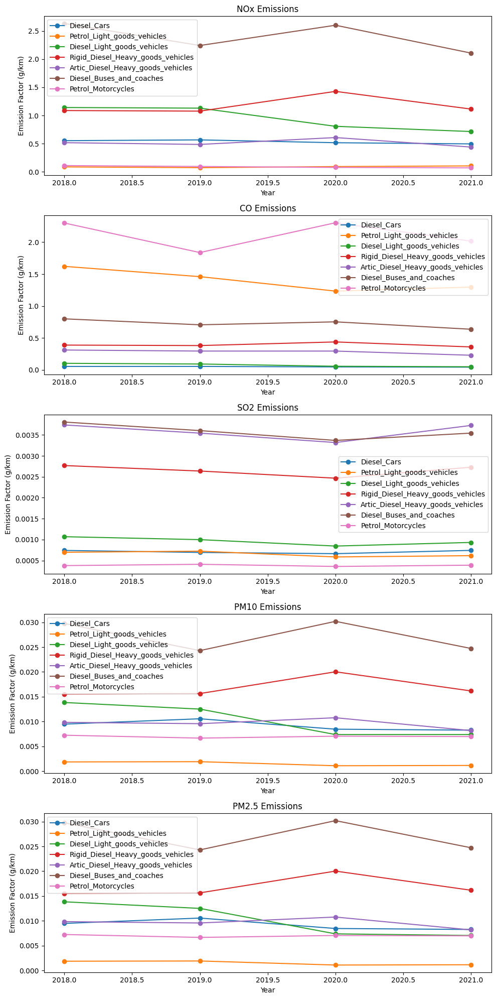

In [ ]:
# Visualize time series plot over the years
fig, axs = plt.subplots(5, 1, figsize=(10, 20))

# List of dataframes and their titles for looping
emission_dfs = [
    (nox_df, 'NOx Emissions'),
    (co_df, 'CO Emissions'),
    (so2_df, 'SO2 Emissions'),
    (pm10_df, 'PM10 Emissions'),
    (pm25_df, 'PM2.5 Emissions')
]

# Loop through each emission factor dataframe and plot the trends
for ax, (emission_df, title) in zip(axs, emission_dfs):
    for column in emission_df.columns[2:]:  # Skip 'Year' and 'Emission_Factors' columns
        ax.plot(emission_df['Year'], emission_df[column], marker='o', label=column)
    ax.set_title(title)
    ax.set_xlabel('Year')
    ax.set_ylabel('Emission Factor (g/km)')
    ax.legend()

plt.tight_layout()
plt.show()

Based on the visualizations provided, some pollutants show a relatively stable or linear trend, particularly SO2 emissions with very little variation. However, pollutants such as NOx, CO, PM10, and PM2.5 exhibit less linearity due to the fluctuations in emission factors for different vehicle types over the years.

In [ ]:
#Perform Time Series Decomposition to access the trend component

nox_df.set_index('Year', inplace=True)
co_df.set_index('Year', inplace=True)
so2_df.set_index('Year', inplace=True)
pm10_df.set_index('Year', inplace=True)
pm25_df.set_index('Year', inplace=True)

# Now, instead of melting, you rename the columns to include the pollutant name
nox_df.columns = [f'NOx_{col}' for col in nox_df.columns]
co_df.columns = [f'CO_{col}' for col in co_df.columns]
so2_df.columns = [f'SO2_{col}' for col in so2_df.columns]
pm10_df.columns = [f'PM10_{col}' for col in pm10_df.columns]
pm25_df.columns = [f'PM2.5_{col}' for col in pm25_df.columns]

# Concatenate horizontally since they all share the same 'Year' index
emsn_df = pd.concat([nox_df, co_df, so2_df, pm10_df, pm25_df], axis=1)

emsn_df


,NOx_Petrol_Cars,NOx_Diesel_Cars,NOx_Petrol_Light_goods_vehicles,NOx_Diesel_Light_goods_vehicles,NOx_Rigid_Diesel_Heavy_goods_vehicles,NOx_Artic_Diesel_Heavy_goods_vehicles,NOx_Diesel_Buses_and_coaches,NOx_Petrol_Motorcycles,CO_Petrol_Cars,CO_Diesel_Cars,...,PM10_Diesel_Buses_and_coaches,PM10_Petrol_Motorcycles,PM2.5_Petrol_Cars,PM2.5_Diesel_Cars,PM2.5_Petrol_Light_goods_vehicles,PM2.5_Diesel_Light_goods_vehicles,PM2.5_Rigid_Diesel_Heavy_goods_vehicles,PM2.5_Artic_Diesel_Heavy_goods_vehicles,PM2.5_Diesel_Buses_and_coaches,PM2.5_Petrol_Motorcycles
Year,,,,,,,,,,,,,,,,,,,,,
2018,0.074601,0.553417,0.088375,1.142186,1.088410,0.517950,2.633763,0.111430,0.775542,0.054869,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
2019,0.070874,0.567535,0.074678,1.130467,1.077814,0.486809,2.242384,0.095241,0.760581,0.055237,...,0.024301,0.006656,0.001353,0.010556,0.001904,0.012508,0.015641,0.009568,0.024301,0.006656
2020,0.065340,0.517155,0.093647,0.808414,1.428076,0.608737,2.601943,0.078934,0.582954,0.047421,...,0.030201,0.007047,0.001155,0.008456,0.001086,0.007375,0.020029,0.010764,0.030201,0.007047
2021,0.063219,0.496403,0.105743,0.715639,1.114328,0.440126,2.107537,0.071226,0.600395,0.043872,...,0.024730,0.006969,0.001168,0.008261,0.001145,0.007043,0.016167,0.008169,0.024730,0.006969


In [ ]:
#convert year index to a datetime
emsn_df.index = pd.to_datetime(emsn_df.index.astype(int), format='%Y')

In [ ]:
emsn_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4 entries, 2018-01-01 to 2021-01-01
Data columns (total 40 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   NOx_Petrol_Cars                          4 non-null      float64
 1   NOx_Diesel_Cars                          4 non-null      float64
 2   NOx_Petrol_Light_goods_vehicles          4 non-null      float64
 3   NOx_Diesel_Light_goods_vehicles          4 non-null      float64
 4   NOx_Rigid_Diesel_Heavy_goods_vehicles    4 non-null      float64
 5   NOx_Artic_Diesel_Heavy_goods_vehicles    4 non-null      float64
 6   NOx_Diesel_Buses_and_coaches             4 non-null      float64
 7   NOx_Petrol_Motorcycles                   4 non-null      float64
 8   CO_Petrol_Cars                           4 non-null      float64
 9   CO_Diesel_Cars                           4 non-null      float64
 10  CO_Petrol_Light_goods_vehicles   

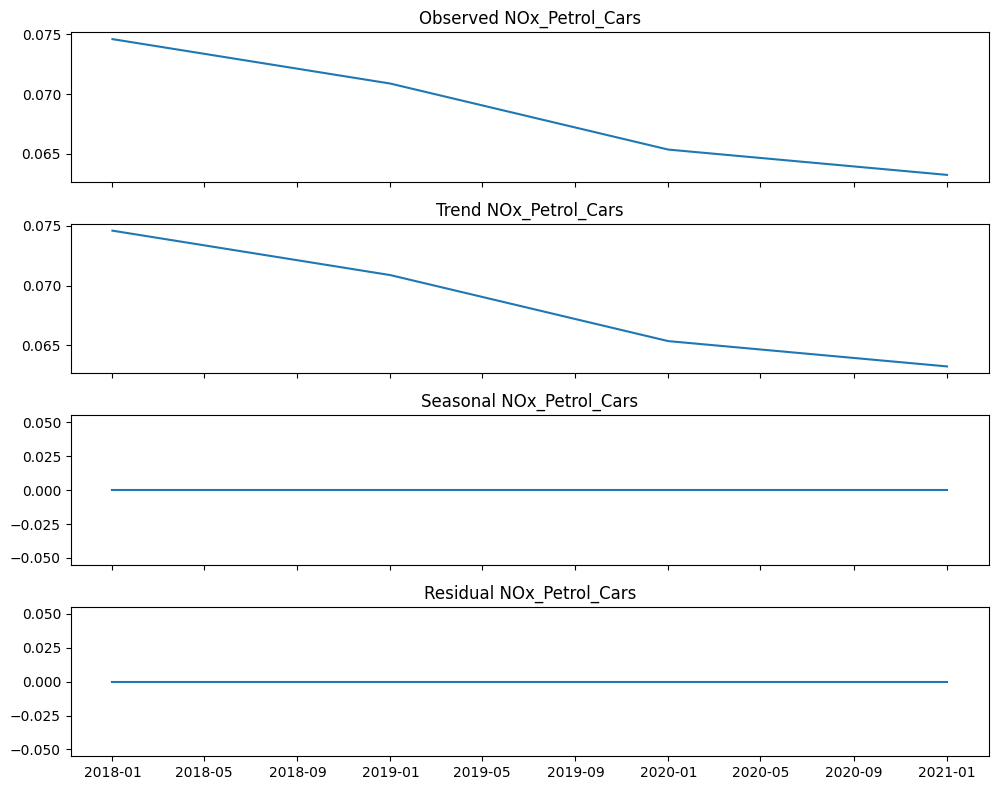

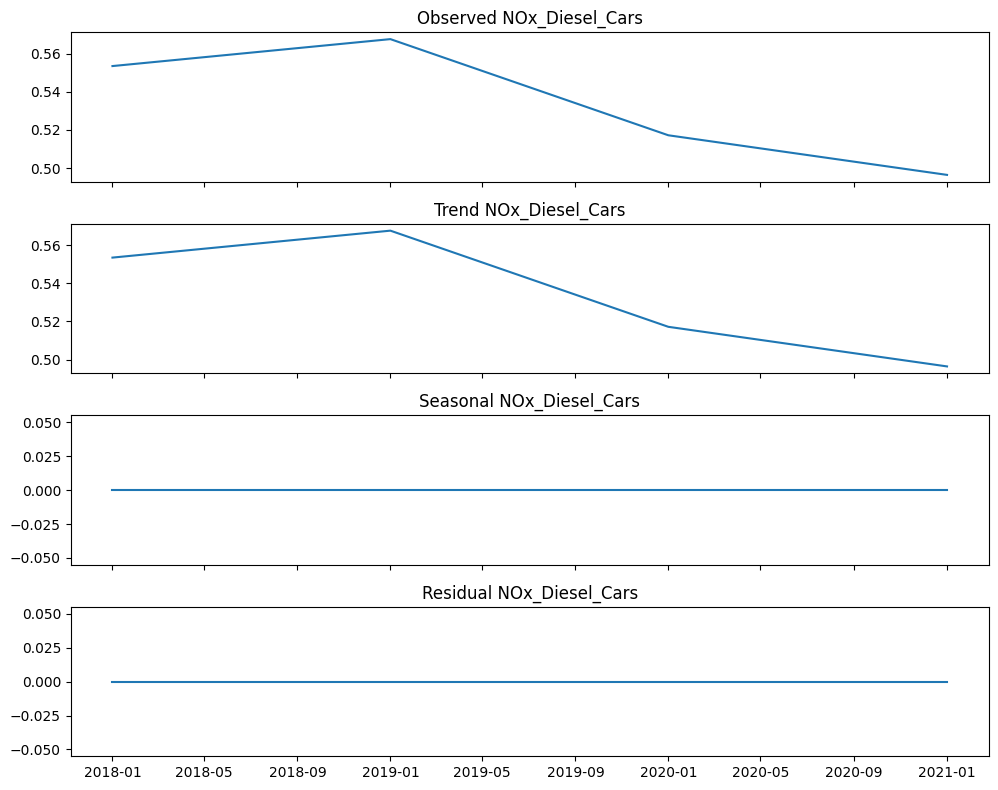

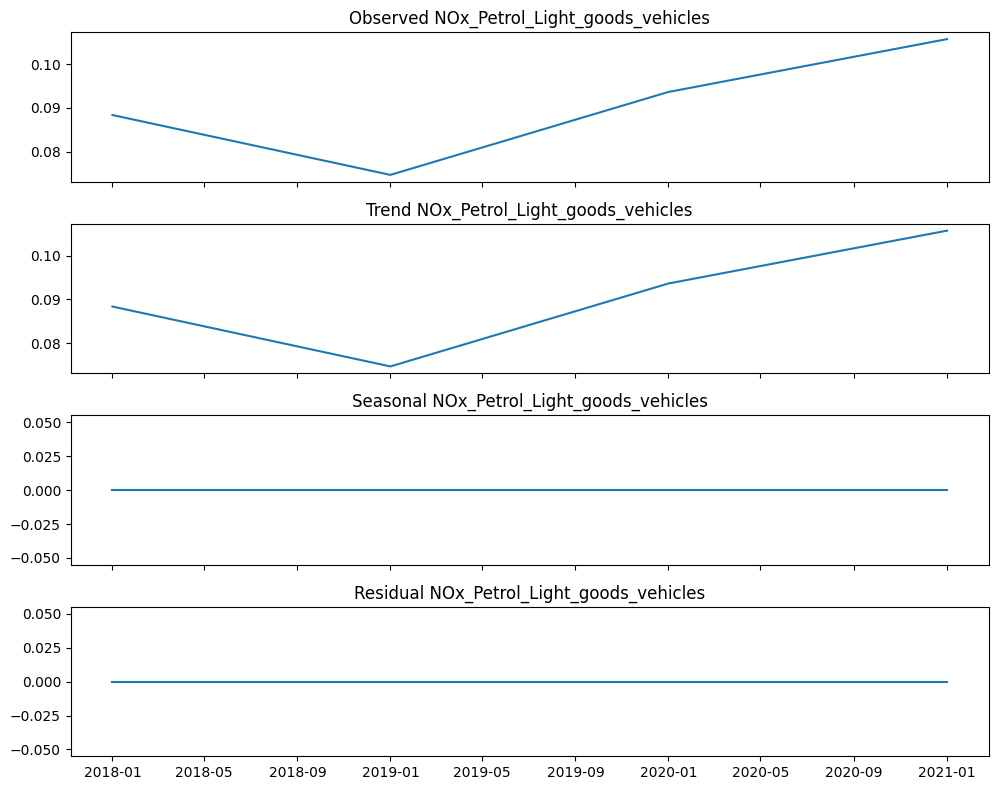

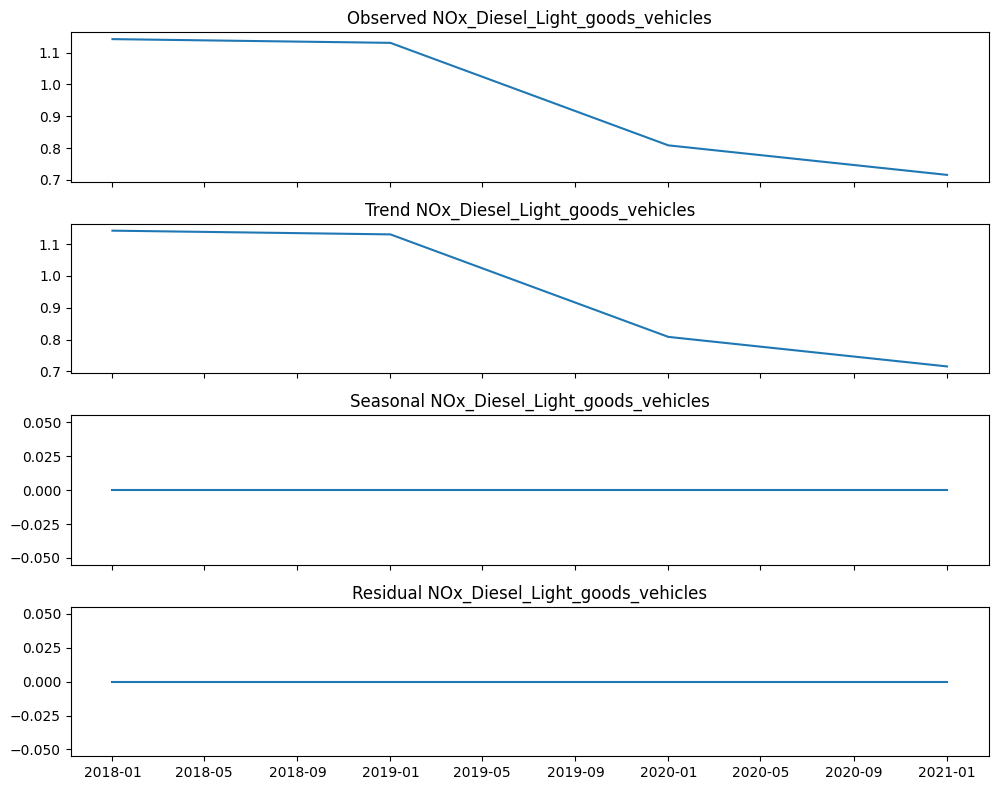

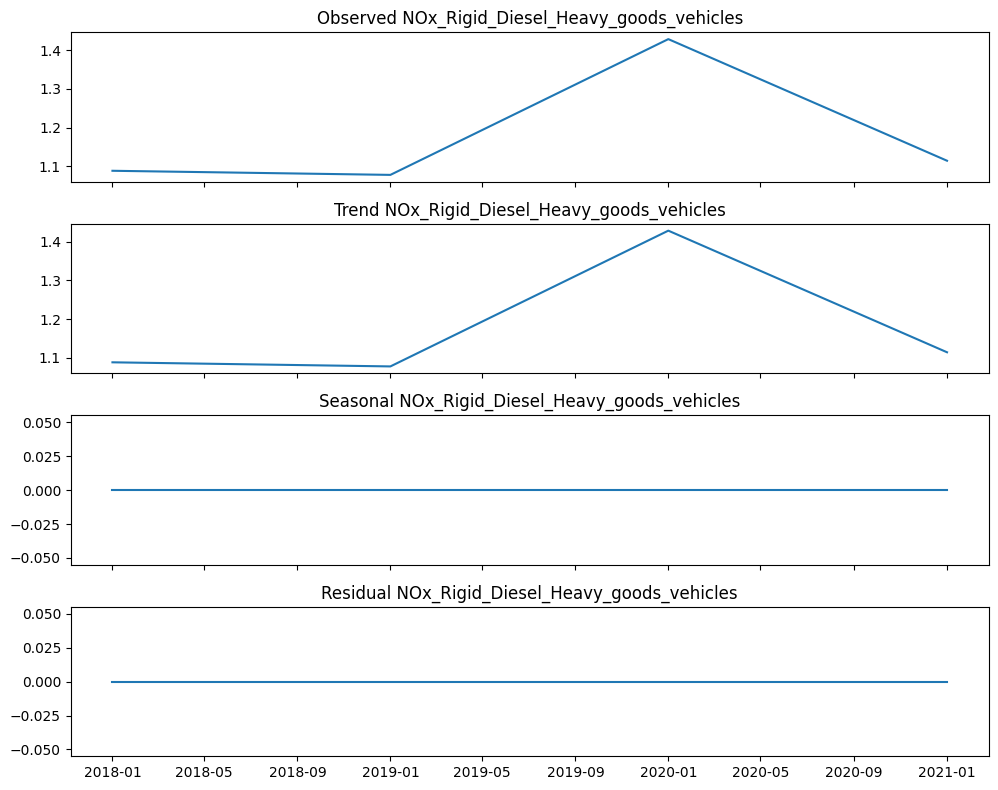

...

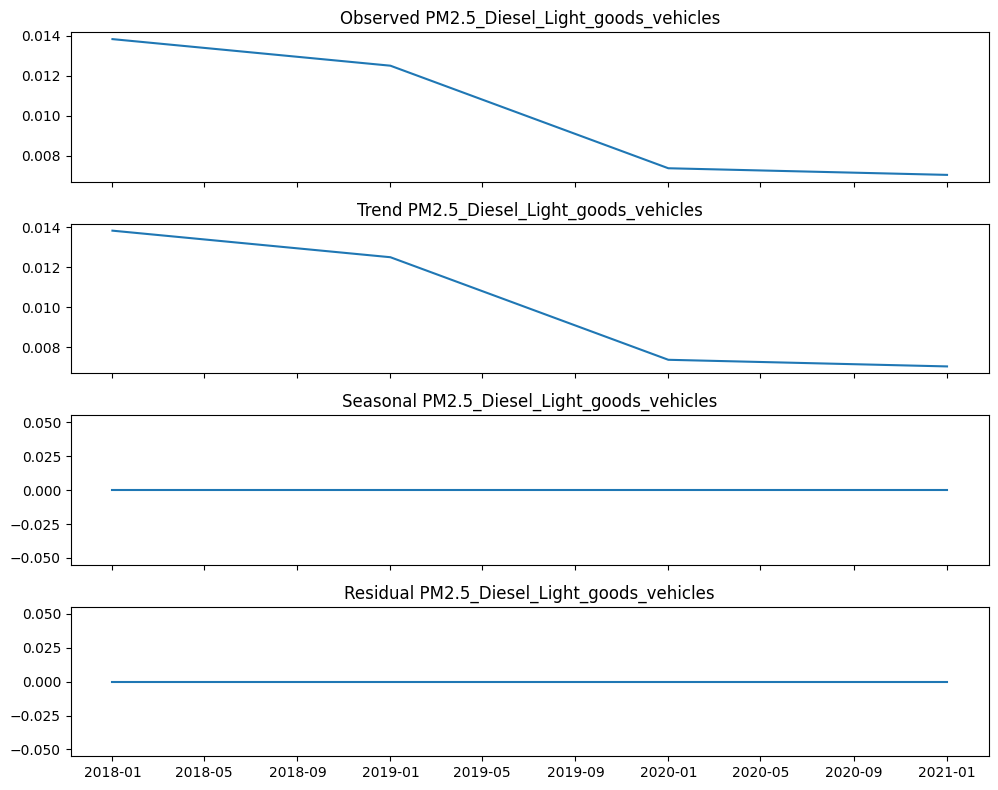

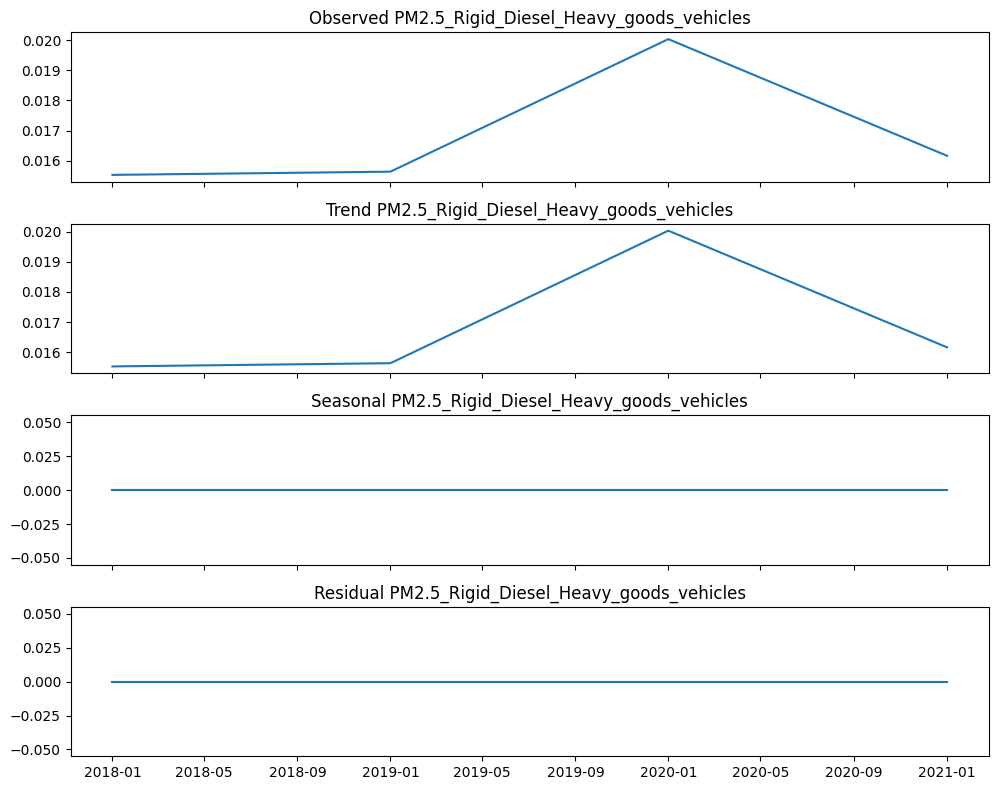

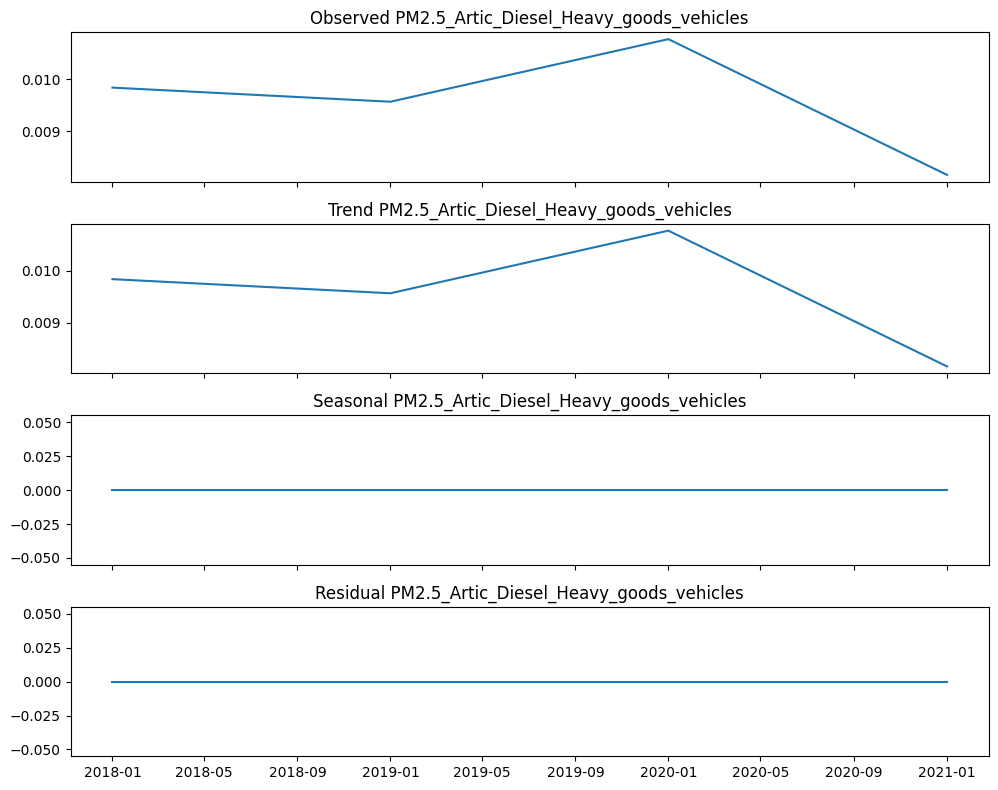

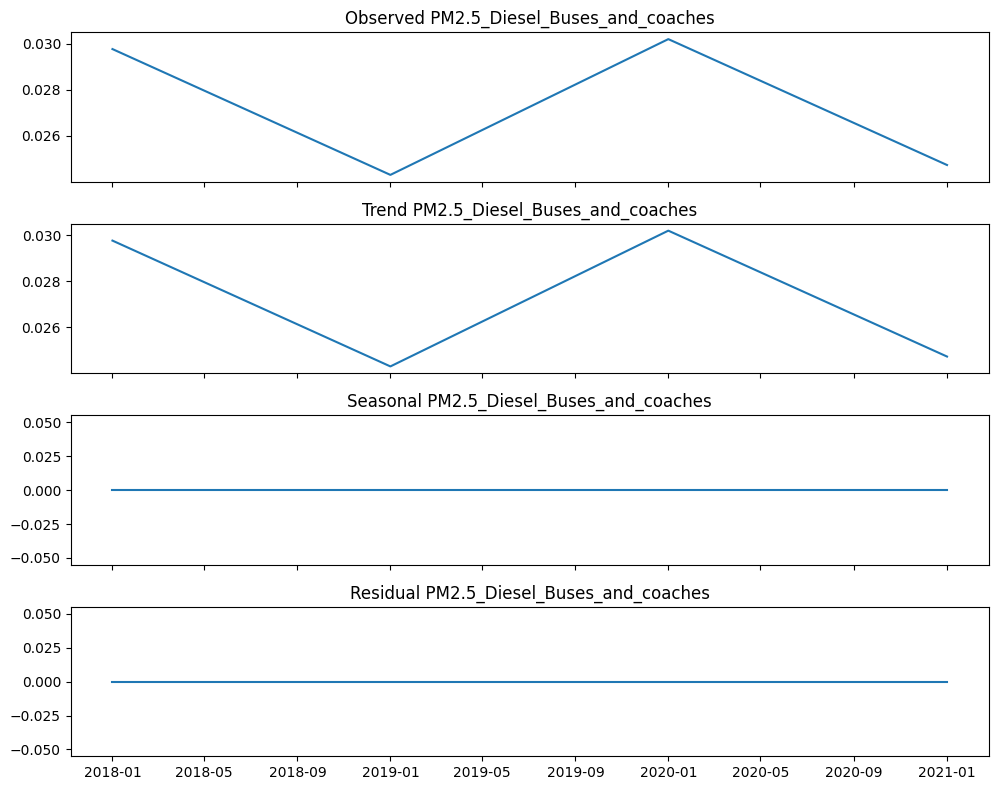

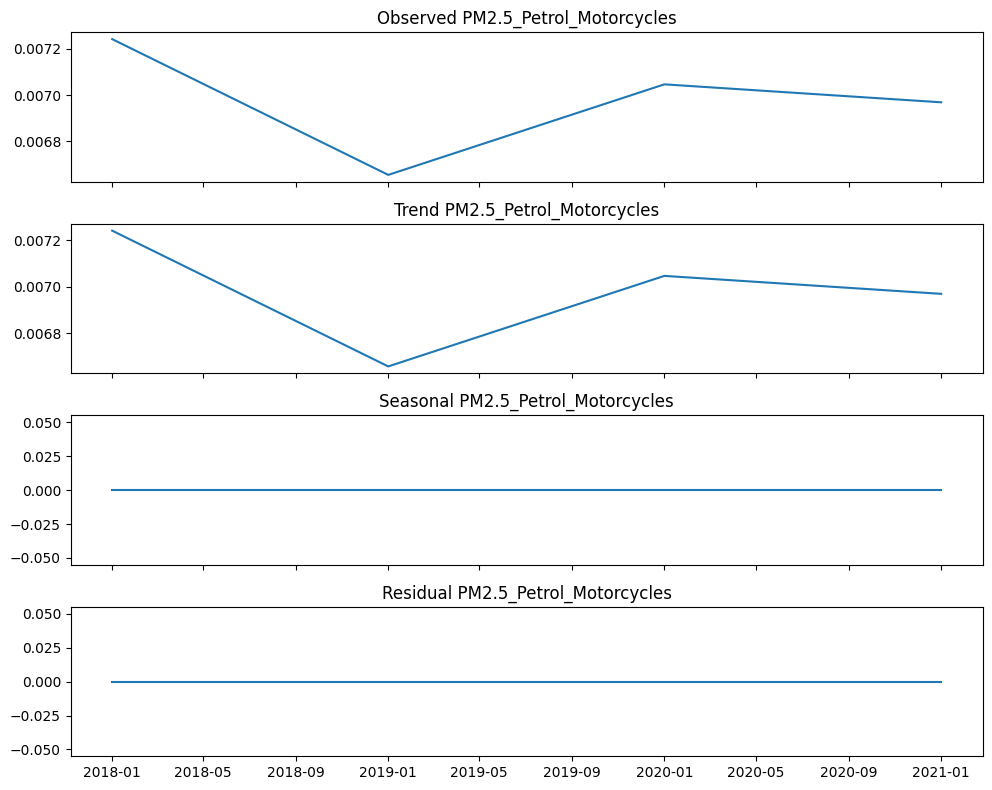

In [ ]:
# Perform decomposition for each non-'Year' column and plot the results


for column in emsn_df.columns:
    # Skip the 'Year' column if it's still in the DataFrame
    if column == 'Year':
        continue

    # Perform the decomposition
    result = seasonal_decompose(emsn_df[column], model='additive', period=1)

    # Plot the decomposition results
    fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

    axes[0].plot(result.observed)
    axes[0].set_title(f'Observed {column}')

    axes[1].plot(result.trend)
    axes[1].set_title(f'Trend {column}')

    axes[2].plot(result.seasonal)
    axes[2].set_title(f'Seasonal {column}')

    axes[3].plot(result.resid)
    axes[3].set_title(f'Residual {column}')

    plt.tight_layout()
    plt.show()

From the visualisation, there are no seasonal patterns found in the emissions and  residuals are quite stable and show little variability, indicating that the trend captures most of the systematic information in the data series.

The time series decomposition of the emissions across various vehicle types indicates an almost consistent trend over the years. Some of the trends are characterized by a generally steady decline, while some are not. The presence of inflection points most of which are seen in the year 2020, an anomaly across all pollutants due to the COVID-19 pandemic, represents a deviation from the expected trend and so 2020 would be treated as an outlier in the extrapolation process.

Due to this instability we would extrapolate using a polynomial model. The time series data involves multiple external factors influencing the outcome in a non-linear way, polynomial models can capture the essence of such complexities.However we would compare with a simple linear modelto evaluate performance.


**Fitting & Evaluating the 2022 Extrapolation Model**

In [ ]:
nox_model = nox_df.copy()
so2_model = so2_df.copy()
co_model = co_df.copy()
pm10_model = pm10_df.copy()
pm25_model = pm25_df.copy()



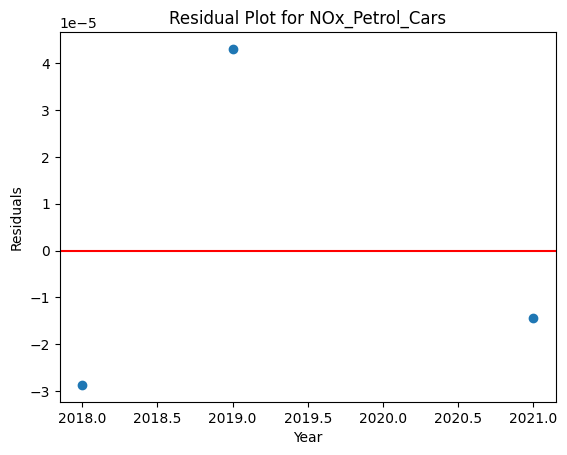

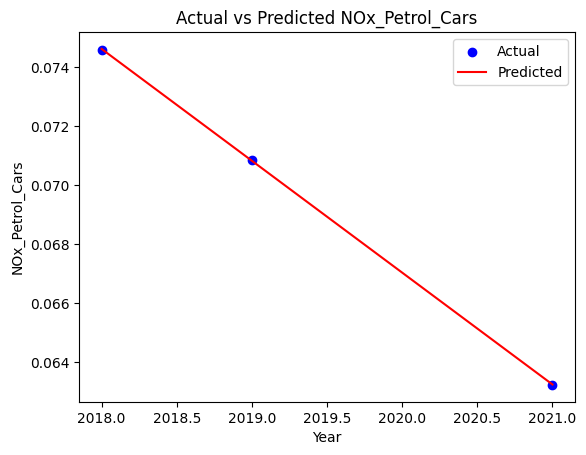

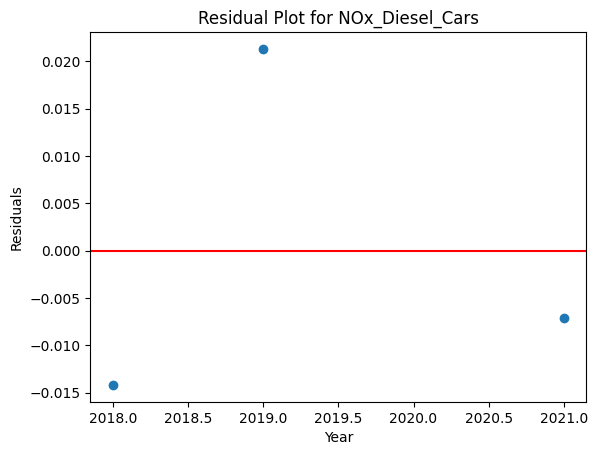

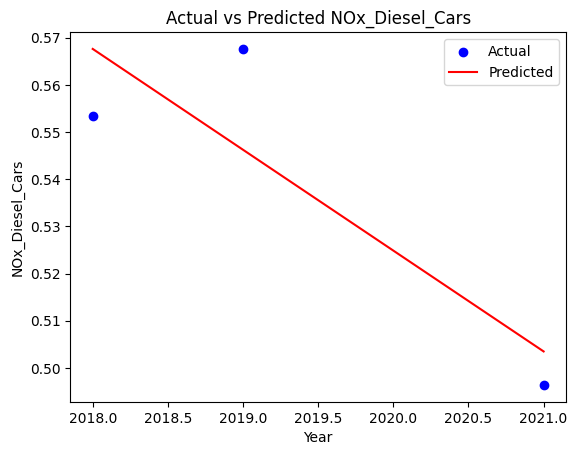

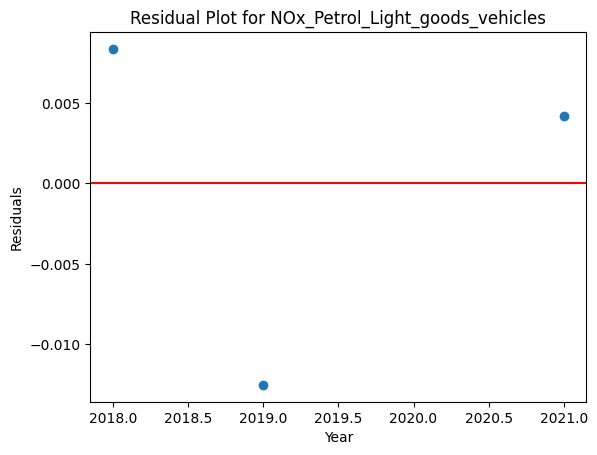

...

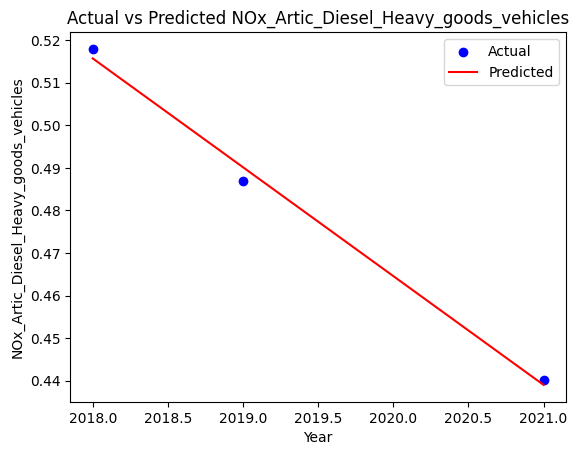

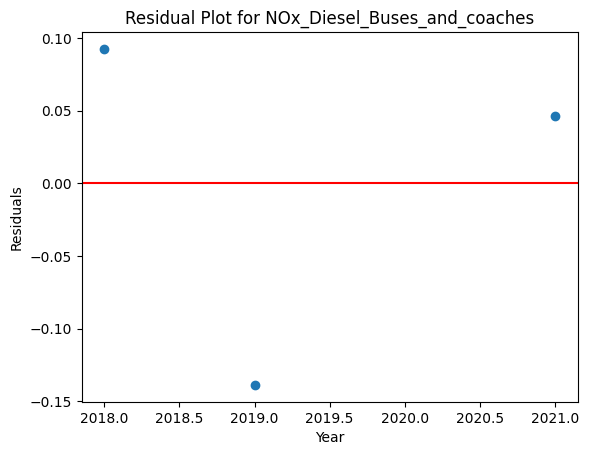

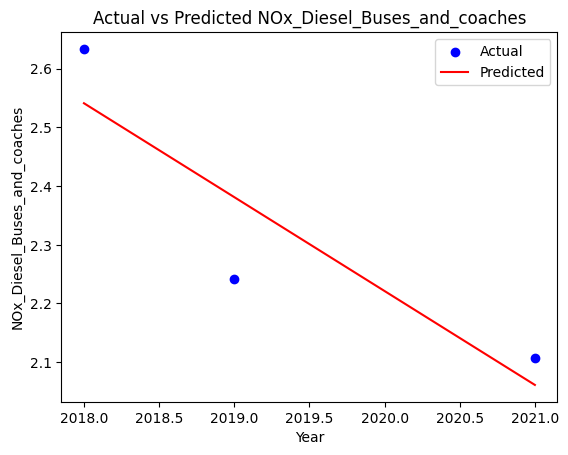

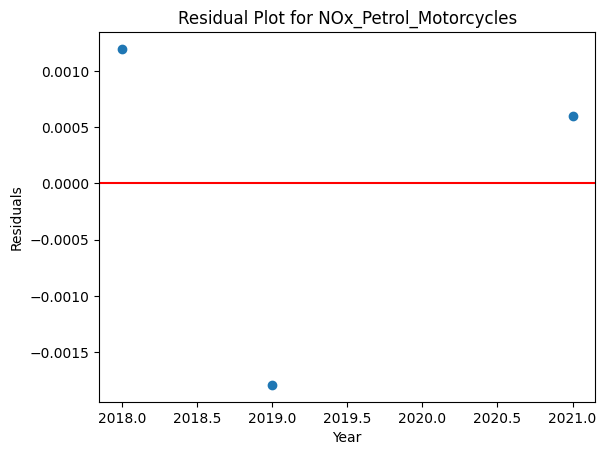

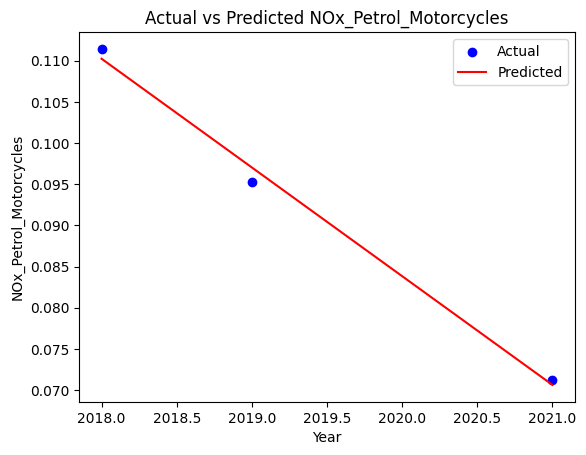

In [ ]:
#Replace each emission factor df after the other to perform training in a nonsimultaneous order
nox_model.reset_index(inplace=True)

nox_model = nox_model[nox_model['Year'] != 2020]  # Exclude the year 2020


X = nox_model['Year'].values.reshape(-1, 1)  # Reshape to make it 2D  # Features
veh_emsn_fac = nox_model.columns.drop('Year')

# Dictionary to hold models for each emission type
models = {}
resultslm_df = pd.DataFrame()

for emission in veh_emsn_fac:
    y = nox_model[emission].values  # Target variable for each emission type

    # Create and fit the model
    model = LinearRegression()
    model.fit(X, y)
    models[emission] = model

    # Predict and calculate residuals
    predicted = model.predict(X)
    residuals = y - predicted

    #Calculate MSE
    mse = mean_squared_error(y, predicted)

    # Store results in the DataFrame
    resultslm_df[f'{emission}_Actual'] = y
    resultslm_df[f'{emission}_Predicted'] = predicted
    resultslm_df[f'{emission}_Residuals'] = residuals
    resultslm_df[f'{emission}_MSE'] = mse

    # Plotting the residual plot for each emission type
    plt.scatter(nox_model['Year'], residuals)
    plt.axhline(y=0, color='r', linestyle='-')
    plt.title(f'Residual Plot for {emission}')
    plt.xlabel('Year')
    plt.ylabel('Residuals')
    plt.show()

    # Plotting actual vs predicted values
    plt.scatter(nox_model['Year'], y, color='blue', label='Actual')
    plt.plot(nox_model['Year'], predicted, color='red', label='Predicted')

    plt.title(f'Actual vs Predicted {emission}')
    plt.xlabel('Year')
    plt.ylabel(emission)
    plt.legend()
    plt.show()


In [ ]:
resultslm_df

,NOx_Petrol_Cars_Actual,NOx_Petrol_Cars_Predicted,NOx_Petrol_Cars_Residuals,NOx_Petrol_Cars_MSE,NOx_Diesel_Cars_Actual,NOx_Diesel_Cars_Predicted,NOx_Diesel_Cars_Residuals,NOx_Diesel_Cars_MSE,NOx_Petrol_Light_goods_vehicles_Actual,NOx_Petrol_Light_goods_vehicles_Predicted,...,NOx_Artic_Diesel_Heavy_goods_vehicles_Residuals,NOx_Artic_Diesel_Heavy_goods_vehicles_MSE,NOx_Diesel_Buses_and_coaches_Actual,NOx_Diesel_Buses_and_coaches_Predicted,NOx_Diesel_Buses_and_coaches_Residuals,NOx_Diesel_Buses_and_coaches_MSE,NOx_Petrol_Motorcycles_Actual,NOx_Petrol_Motorcycles_Predicted,NOx_Petrol_Motorcycles_Residuals,NOx_Petrol_Motorcycles_MSE
0,0.074601,0.074630,-0.000029,9.630677e-10,0.553417,0.567612,-0.014195,0.000235,0.088375,0.080024,...,0.002229,0.000006,2.633763,2.541205,0.092559,0.009995,0.111430,0.110236,0.001195,0.000002
1,0.070874,0.070831,0.000043,9.630677e-10,0.567535,0.546242,0.021293,0.000235,0.074678,0.087205,...,-0.003343,0.000006,2.242384,2.381222,-0.138838,0.009995,0.095241,0.097033,-0.001792,0.000002
2,0.063219,0.063233,-0.000014,9.630677e-10,0.496403,0.503501,-0.007098,0.000235,0.105743,0.101568,...,0.001114,0.000006,2.107537,2.061257,0.046279,0.009995,0.071226,0.070628,0.000597,0.000002


Tuned Linear Extrapolation Model

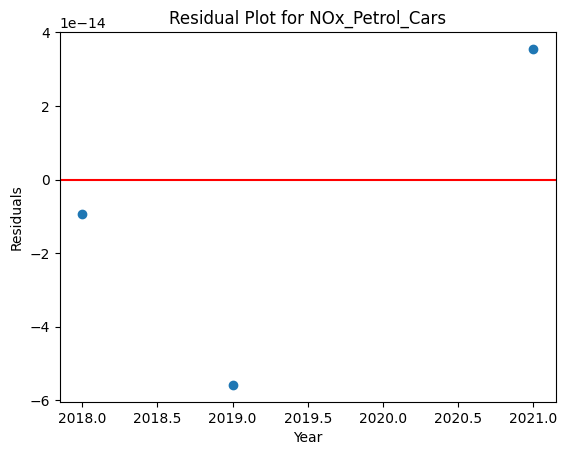

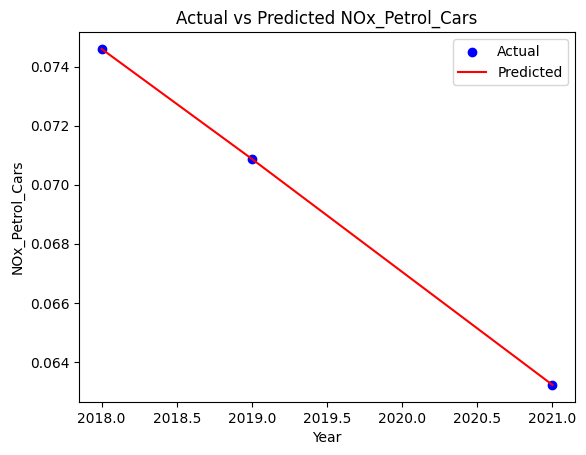

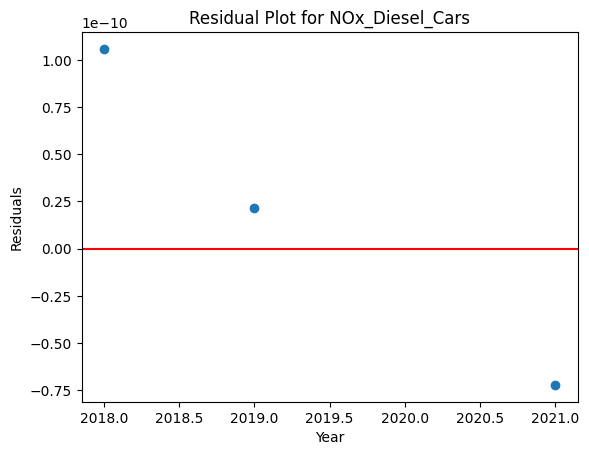

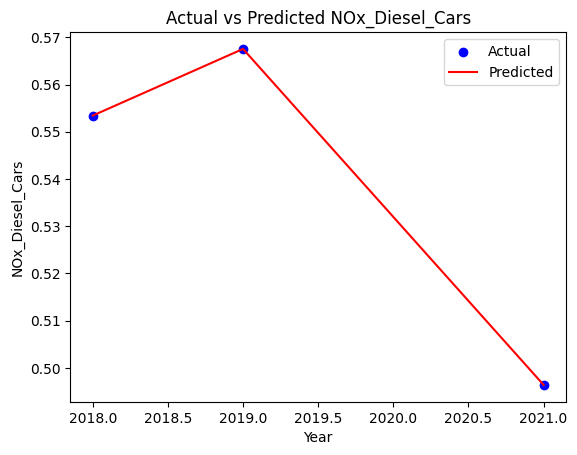

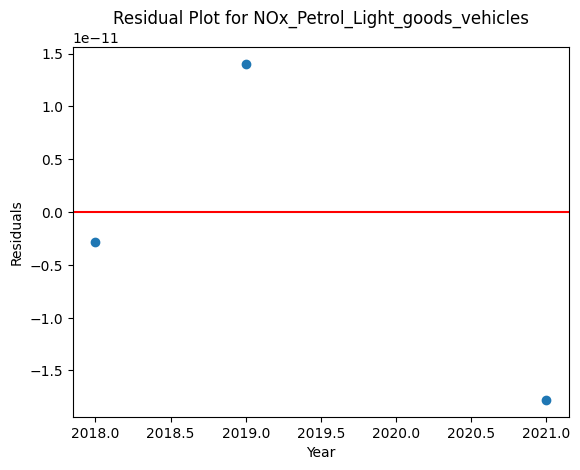

...

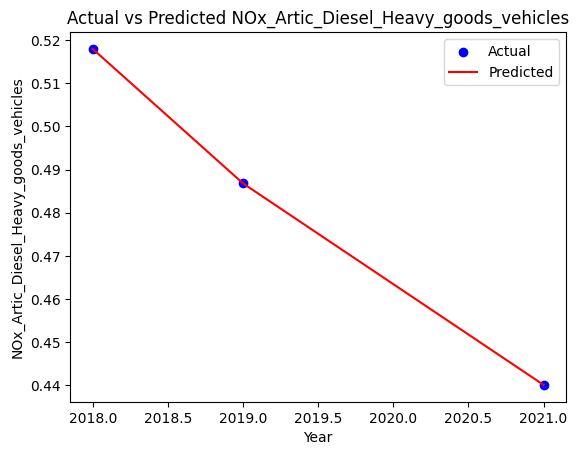

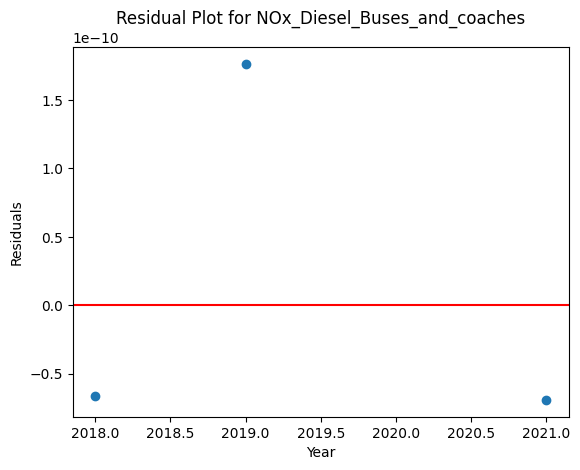

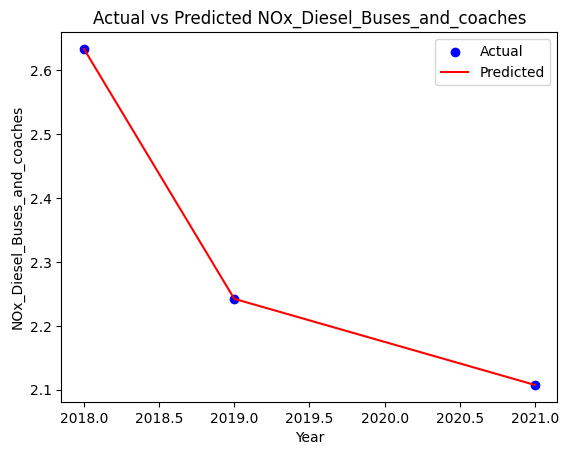

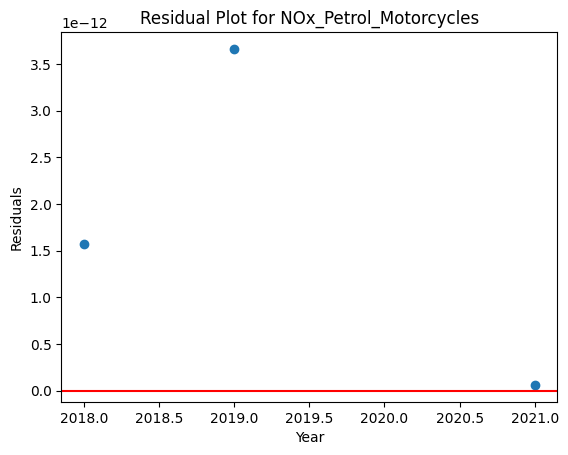

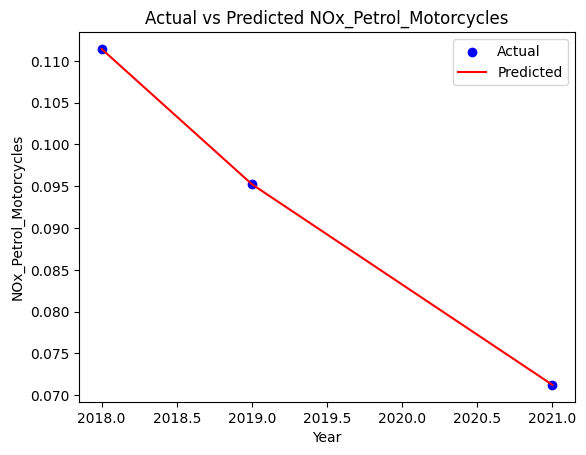

In [ ]:
nox_model.reset_index(inplace=True)

nox_model = nox_model[nox_model['Year'] != 2020]  # Exclude the year 2020


X = nox_model['Year'].values.reshape(-1, 1)  # Reshape to make it 2D  # Features
veh_emsn_fac = nox_model.columns.drop('Year')  # List of emission factors for each vehicle fuel type

# Dictionary to hold models for each emission type
poly_models = {}
resultspm_df = pd.DataFrame()

for emission in veh_emsn_fac:
    y = nox_model[emission].values  # Target variable for each emission type

    # Create a polynomial regression model
    polyreg = make_pipeline(PolynomialFeatures(2), LinearRegression())
    polyreg.fit(X, y)
    poly_models[emission] = polyreg

    # Predict and calculate residuals
    predicted =polyreg.predict(X)
    residuals = y - predicted

    #Calculate MSE
    mse_pm = mean_squared_error(y, predicted)

     # Store results in the DataFrame
    resultspm_df[f'{emission}_Actual'] = y
    resultspm_df[f'{emission}_Predicted'] = predicted
    resultspm_df[f'{emission}_Residuals'] = residuals
    resultspm_df[f'{emission}_MSE'] = mse_pm

    # Plotting the residual plot for each emission type
    plt.scatter(nox_model['Year'], residuals)
    plt.axhline(y=0, color='r', linestyle='-')
    plt.title(f'Residual Plot for {emission}')
    plt.xlabel('Year')
    plt.ylabel('Residuals')
    plt.show()

    # Plotting actual vs predicted values
    plt.scatter(nox_model['Year'], y, color='blue', label='Actual')
    plt.plot(nox_model['Year'], predicted, color='red', label='Predicted')

    plt.title(f'Actual vs Predicted {emission}')
    plt.xlabel('Year')
    plt.ylabel(emission)
    plt.legend()
    plt.show()


In [ ]:
resultspm_df

,NOx_Petrol_Cars_Actual,NOx_Petrol_Cars_Predicted,NOx_Petrol_Cars_Residuals,NOx_Petrol_Cars_MSE,NOx_Diesel_Cars_Actual,NOx_Diesel_Cars_Predicted,NOx_Diesel_Cars_Residuals,NOx_Diesel_Cars_MSE,NOx_Petrol_Light_goods_vehicles_Actual,NOx_Petrol_Light_goods_vehicles_Predicted,...,NOx_Artic_Diesel_Heavy_goods_vehicles_Residuals,NOx_Artic_Diesel_Heavy_goods_vehicles_MSE,NOx_Diesel_Buses_and_coaches_Actual,NOx_Diesel_Buses_and_coaches_Predicted,NOx_Diesel_Buses_and_coaches_Residuals,NOx_Diesel_Buses_and_coaches_MSE,NOx_Petrol_Motorcycles_Actual,NOx_Petrol_Motorcycles_Predicted,NOx_Petrol_Motorcycles_Residuals,NOx_Petrol_Motorcycles_MSE
0,0.074601,0.074601,-9.311996e-15,1.487794e-27,0.553417,0.553417,1.058675e-10,5.631178e-21,0.088375,0.088375,...,-1.535660e-12,2.287350e-24,2.633763,2.633763,-6.614131e-11,1.342310e-20,0.111430,0.111430,1.573131e-12,5.298018e-24
1,0.070874,0.070874,-5.581646e-14,1.487794e-27,0.567535,0.567535,2.162204e-11,5.631178e-21,0.074678,0.074678,...,-1.983969e-13,2.287350e-24,2.242384,2.242384,1.763398e-10,1.342310e-20,0.095241,0.095241,3.662709e-12,5.298018e-24
2,0.063219,0.063219,3.551326e-14,1.487794e-27,0.496403,0.496403,-7.223633e-11,5.631178e-21,0.105743,0.105743,...,-2.112921e-12,2.287350e-24,2.107537,2.107537,-6.927392e-11,1.342310e-20,0.071226,0.071226,6.225576e-14,5.298018e-24


Results:
**NOx**

---

**Residual Plot Interpretations:**
The residuals seem randomly scattered around the zero line prior to 2020 suggests a good model fit without bias, However, the significant negative residual at the start of 2020 corresponds to the model overestimating emissions, a direct consequence of the anomaly caused by the the pandemic. Excluding this outlier data from 2020 helped maintain the model's focus on representing typical emission trends without the distortion of extraordinary events.

**Actual vs Predicted Plot Interpretations:**
The close match between actual and predicted values indicates a well-fitting model.
The model's consistency across vehicle types suggests it can reliably predict future emissions.

**SO2**

---
**Residual Plot interpretation:**
The residual plot illustrates the difference between the actual and predicted SO2 emissions over time. Residuals are scattered across the chart, with some variation from zero but without a clear pattern. The larger residuals in 2020 again reflect the impact of unusual circumstances on emission levels, which were not fully captured by the model. The absence of a systematic pattern in residuals indicates that there are no apparent biases in the model's predictions, although the variability suggests room for refinement in capturing unpredictable fluctuations.

**Actual vs Predicted interpretaion:**
This line chart compares actual SO2 emissions (blue points) against the emissions predicted by our model (red line) from 2018 to 2021. The predictions closely follow the actual emissions for 2018 and 2019, indicating a strong model performance during these years. In 2020, a slight deviation occurs, likely influenced by external factors such as the reduced traffic during the COVID-19 pandemic. The convergence of actual and predicted values in 2021 suggests that the model has adapted to the changes in emission patterns or that conditions have returned closer to pre-pandemic levels.

**CO**


---


**Residual Plot nterpretations:**
The residuals do not center around zero and increase over time, which could suggest a model that is not fully capturing the dynamics of the system (potential underfitting). Specifically, the model may not be complex enough to capture all the influential factors, leading to systematic errors over time. The large positive residual in 2021 further hints at the model's inability to adjust to decreasing emission trends, which could be due to overfitting to past data patterns that no longer apply.

**Actual vs Predicted Interpretations:**
 The model's predictions follow the downward trend of actual emissions. However, the predictions are consistently higher than the actual values, especially towards the end of 2021. This consistent overestimation could indicate a potential bias in the model or a change in the underlying emission patterns that the model has not captured, perhaps due to the recent technological improvements & changes in regulations.

 **PM10 & PM2.5**


---
**Residual Plot nterpretations:**
The residual plot displays the prediction errors over time, with residuals showing the difference between actual and predicted PM10 & PM2.5 emissions. The residuals are not consistently centered around zero, hinting at periods of both overestimation and underestimation by the model.

**Actual vs Predicted Interpretations:**
The model's predictions (red line) capture the overall declining trend of the actual emissions (blue points) from 2018 to 2021. However, the model does not perfectly align with the actual values, particularly in the latter half of the period, where it underestimates emissions.





**Model Performance Comparison**

---


Based on the residual plot analysis and mean squared error comparisons between the Linear and Plynomial model:

**MSE Comparison**:

- The linear model showed higher MSE values across different vehicle types, indicating a less accurate fit for the historical data.
- The polynomial model presented significantly lower MSE values, suggesting a superior fit to the data, which aligns with the observed non-linear emission trends over the years.

**Residual Analysis:**

- Residuals from the linear model were more scattered and displayed patterns, indicating potential model misspecification.
- The polynomial model residuals were smaller and showed less systematic distribution, which is indicative of a better fit.

**Preferred Model**

The polynomial model was selected due to its ability to capture the non-linear patterns observed in the emission data more effectively than the linear model. From domain knowledge, this choice is further supported by the fact that the NO2 fraction equivalent of the polynomial model's NOx predictions were closely aligned the with actual NAEI NO2 emission factor data when compared. While the polynomial model is preferred for its accuracy and alignment with historical trends, we need to consider the possibility of slight overfitting.


**Predicting 2022**

In [ ]:
# Predict for 2022
predictions_2022 = {'Year': 2022}
for emission, model in poly_models.items():
    prediction = model.predict([[2022]])[0]  # Predict for 2022
    predictions_2022[emission] = prediction



In [ ]:
# Create a DataFrame for 2022 predictions and unquote each emissions when neccessary
df_2022_predictions = pd.DataFrame(predictions_2022, index=[pd.to_datetime('2022', format='%Y')])

In [ ]:
nox_2022_emsn = df_2022_predictions

In [ ]:
#save emisson prediction
#so2_2022_emsn= df_2022_predictions

In [ ]:
#save emisson prediction

#co_2022_emsn= df_2022_predictions

In [ ]:
#save emisson prediction

#pm10_2022_emsn= df_2022_predictions

In [ ]:
#save emisson prediction

#pm25_2022_emsn= df_2022_predictions

In [ ]:
#Concatenate the new predictions instead
nox_df.reset_index(inplace=True)
nox_df = pd.concat([nox_df, nox_2022_emsn], ignore_index=True)

# Convert the 'Year' column to datetime, ensuring only the year is considered
nox_df['Year'] = pd.to_datetime(nox_df['Year'].astype(int), format='%Y')

# Set the 'Year' column back as the index
nox_df.set_index('Year', inplace=True)

# Save to CSV
nox_df.to_csv("Predicted_NOx_2022.csv", index=False)

# Display the first few rows
nox_df.head()


,NOx_Petrol_Cars,NOx_Diesel_Cars,NOx_Petrol_Light_goods_vehicles,NOx_Diesel_Light_goods_vehicles,NOx_Rigid_Diesel_Heavy_goods_vehicles,NOx_Artic_Diesel_Heavy_goods_vehicles,NOx_Diesel_Buses_and_coaches,NOx_Petrol_Motorcycles
Year,,,,,,,,
2018-01-01,0.074601,0.553417,0.088375,1.142186,1.088410,0.517950,2.633763,0.111430
2019-01-01,0.070874,0.567535,0.074678,1.130467,1.077814,0.486809,2.242384,0.095241
2020-01-01,0.065340,0.517155,0.093647,0.808414,1.428076,0.608737,2.601943,0.078934
2021-01-01,0.063219,0.496403,0.105743,0.715639,1.114328,0.440126,2.107537,0.071226
2022-01-01,0.059291,0.411154,0.150504,0.312530,1.161437,0.424584,2.364068,0.063400


In [ ]:
'''
#Concatenate the new predictions instead
so2_df.reset_index(inplace=True)
so2_df = pd.concat([so2_df, so2_2022_emsn], ignore_index=True)

# Convert the 'Year' column to datetime, ensuring only the year is considered
so2_df['Year'] = pd.to_datetime(so2_df['Year'].astype(int), format='%Y')

# Set the 'Year' column back as the index
so2_df.set_index('Year', inplace=True)

# Save to CSV
so2_df.to_csv("Predicted_SO2_2022.csv", index=False)

# Display the first few rows
so2_df.head()
'''

In [ ]:
'''
#Concatenate the new predictions instead
co_df.reset_index(inplace=True)
co_df = pd.concat([co_df, co_2022_emsn], ignore_index=True)

# Convert the 'Year' column to datetime, ensuring only the year is considered
co_df['Year'] = pd.to_datetime(co_df['Year'].astype(int), format='%Y')

# Set the 'Year' column back as the index
co_df.set_index('Year', inplace=True)

# Save to CSV
co_df.to_csv("Predicted_CO_2022.csv")

co_df.head()
'''

In [ ]:
'''
#Concatenate the new predictions instead
pm10_df.reset_index(inplace=True)
pm10_df = pd.concat([pm10_df, pm10_2022_emsn], ignore_index=True)

# Convert the 'Year' column to datetime, ensuring only the year is considered
pm10_df['Year'] = pd.to_datetime(pm10_df['Year'].astype(int), format='%Y')

# Set the 'Year' column back as the index
pm10_df.set_index('Year', inplace=True)

# Save to CSV
pm10_df.to_csv("Predicted_PM10_2022.csv", index=False)

pm10_df.head()
'''

In [ ]:
'''
#Concatenate the new predictions instead
pm25_df.reset_index(inplace=True)
pm25_df = pd.concat([pm25_df, pm25_2022_emsn], ignore_index=True)

# Convert the 'Year' column to datetime, ensuring only the year is considered
pm25_df['Year'] = pd.to_datetime(pm25_df['Year'].astype(int), format='%Y')

# Set the 'Year' column back as the index
pm25_df.set_index('Year', inplace=True)

# Save to CSV
pm25_df.to_csv("Predicted_PM2.5_2022.csv", index= False)

pm25_df.head()
'''

In [ ]:
'''
final_emsn_df = pd.concat([nox_df,so2_df,co_df,pm10_df,pm25_df], axis=1)

final_emsn_df.to_csv('Emission_df_22.csv')
'''

In [ ]:
final_emsn_df = pd.read_csv('/content/drive/MyDrive/Data/THESIS/Emission_df_22.csv', index_col=0) #Load extrapolated Emissions & traffic data

In [ ]:
final_emsn_df.head()

,Year,NOx_Petrol_Cars,NOx_Diesel_Cars,NOx_Petrol_Light_goods_vehicles,NOx_Diesel_Light_goods_vehicles,NOx_Rigid_Diesel_Heavy_goods_vehicles,NOx_Artic_Diesel_Heavy_goods_vehicles,NOx_Diesel_Buses_and_coaches,NOx_Petrol_Motorcycles,SO2_Petrol_Cars,...,PM10_Diesel_Buses_and_coaches,PM10_Petrol_Motorcycles,PM2.5_Petrol_Cars,PM2.5_Diesel_Cars,PM2.5_Petrol_Light_goods_vehicles,PM2.5_Diesel_Light_goods_vehicles,PM2.5_Rigid_Diesel_Heavy_goods_vehicles,PM2.5_Artic_Diesel_Heavy_goods_vehicles,PM2.5_Diesel_Buses_and_coaches,PM2.5_Petrol_Motorcycles
0,2018-01-01,0.074601,0.553417,0.088375,1.142186,1.088410,0.517950,2.633763,0.111430,0.000526,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
1,2019-01-01,0.070874,0.567535,0.074678,1.130467,1.077814,0.486809,2.242384,0.095241,0.000533,...,0.024301,0.006656,0.001353,0.010556,0.001904,0.012508,0.015641,0.009568,0.024301,0.006656
2,2020-01-01,0.065340,0.517155,0.093647,0.808414,1.428076,0.608737,2.601943,0.078934,0.000482,...,0.030201,0.007047,0.001155,0.008456,0.001086,0.007375,0.020029,0.010764,0.030201,0.007047
3,2021-01-01,0.063219,0.496403,0.105743,0.715639,1.114328,0.440126,2.107537,0.071226,0.000518,...,0.024730,0.006969,0.001168,0.008261,0.001145,0.007043,0.016167,0.008169,0.024730,0.006969
4,2022-01-01,0.059291,0.411154,0.150504,0.312530,1.161437,0.424584,2.364068,0.063400,0.000497,...,0.030627,0.007868,0.000970,0.004888,0.000338,0.002908,0.016586,0.007041,0.030627,0.007868


In [ ]:
final_emsn_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5 entries, 0 to 4
Data columns (total 41 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Year                                     5 non-null      object 
 1   NOx_Petrol_Cars                          5 non-null      float64
 2   NOx_Diesel_Cars                          5 non-null      float64
 3   NOx_Petrol_Light_goods_vehicles          5 non-null      float64
 4   NOx_Diesel_Light_goods_vehicles          5 non-null      float64
 5   NOx_Rigid_Diesel_Heavy_goods_vehicles    5 non-null      float64
 6   NOx_Artic_Diesel_Heavy_goods_vehicles    5 non-null      float64
 7   NOx_Diesel_Buses_and_coaches             5 non-null      float64
 8   NOx_Petrol_Motorcycles                   5 non-null      float64
 9   SO2_Petrol_Cars                          5 non-null      float64
 10  SO2_Diesel_Cars                          5 non-null   

In [ ]:
final_emsn_df['Year'] = pd.to_datetime(final_emsn_df['Year'], format='%Y-%m-%d')
final_emsn_df.set_index('Year', inplace=True)


**Weather Data**

In [ ]:
#creat new datetime column with proper format
weather_data.insert(0, 'date_time', weather_data['dt'].apply(lambda x: datetime.datetime.utcfromtimestamp(x)))

In [ ]:
weather_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44324 entries, 0 to 44323
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date_time            44324 non-null  datetime64[ns]
 1   dt                   44324 non-null  int64         
 2   dt_iso               44324 non-null  object        
 3   timezone             44324 non-null  int64         
 4   city_name            44324 non-null  object        
 5   lat                  44324 non-null  float64       
 6   lon                  44324 non-null  float64       
 7   temp                 44324 non-null  float64       
 8   visibility           43856 non-null  float64       
 9   dew_point            44324 non-null  float64       
 10  feels_like           44324 non-null  float64       
 11  temp_min             44324 non-null  float64       
 12  temp_max             44324 non-null  float64       
 13  pressure             44324 non-

In [ ]:
# Check for duplicate values in the index
duplicates = weather_data['dt_iso'].duplicated()

# To see if there are any duplicates
has_duplicates = duplicates.any()

duplicate_rows = weather_data[duplicates]
# To get a list of the duplicate index values
#duplicate_indices = weather_data.index[duplicates]

print("Contains duplicates:", has_duplicates)
print("Number of duplicates:", duplicates.sum())
print(duplicate_rows)

In [ ]:
#drop irrelevant columns

column_to_drop = ['dt','timezone', 'dt_iso','city_name','lat','lon','visibility','dew_point', 'feels_like', 'temp_min', 'temp_max', 'sea_level',
                  'grnd_level','wind_gust','rain_3h','snow_3h','clouds_all', 'weather_id', 'weather_main',	'weather_description', 'weather_icon']
weather_clean = weather_data.drop(columns=column_to_drop)

# Display the updated dataframe
weather_clean.head()

,date_time,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,snow_1h
0,2018-01-01 00:00:00,7.07,997,75,8.23,260,NaN,NaN
1,2018-01-01 01:00:00,6.81,998,78,7.20,260,NaN,NaN
2,2018-01-01 02:00:00,6.10,999,79,6.20,250,NaN,NaN
3,2018-01-01 03:00:00,5.87,999,76,6.70,250,NaN,NaN
4,2018-01-01 04:00:00,5.85,999,76,6.20,240,NaN,NaN


In [ ]:
#Handling the NaN values
weather_clean.fillna(0, inplace=True)

In [ ]:
#remove duplicates
weather_clean = weather_clean.drop_duplicates(subset='date_time')

In [ ]:
#rename columns for clarity

weather_df = weather_clean.rename(columns= {'temp':'temperature', 'wind_deg':'wind_dir', 'rain_1h':'rain_vol', 'snow_1h':'snow_vol'})

weather_df.head()

,date_time,temperature,pressure,humidity,wind_speed,wind_dir,rain_vol,snow_vol
0,2018-01-01 00:00:00,7.07,997,75,8.23,260,0.0,0.0
1,2018-01-01 01:00:00,6.81,998,78,7.20,260,0.0,0.0
2,2018-01-01 02:00:00,6.10,999,79,6.20,250,0.0,0.0
3,2018-01-01 03:00:00,5.87,999,76,6.70,250,0.0,0.0
4,2018-01-01 04:00:00,5.85,999,76,6.20,240,0.0,0.0


In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43824 entries, 0 to 44323
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date_time    43824 non-null  datetime64[ns]
 1   temperature  43824 non-null  float64       
 2   pressure     43824 non-null  int64         
 3   humidity     43824 non-null  int64         
 4   wind_speed   43824 non-null  float64       
 5   wind_dir     43824 non-null  int64         
 6   rain_vol     43824 non-null  float64       
 7   snow_vol     43824 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3)
memory usage: 3.0 MB


In [ ]:
#set datetime to index
weather_df.set_index('date_time', inplace=True)

weather_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2018-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   temperature  43824 non-null  float64
 1   pressure     43824 non-null  int64  
 2   humidity     43824 non-null  int64  
 3   wind_speed   43824 non-null  float64
 4   wind_dir     43824 non-null  int64  
 5   rain_vol     43824 non-null  float64
 6   snow_vol     43824 non-null  float64
dtypes: float64(4), int64(3)
memory usage: 2.7 MB


In [ ]:
#making sure index has no duplicates
duplicate = weather_df.index.duplicated()

with_duplicates = duplicate.any()

with_duplicates

False

**Air Quality Data**

In [ ]:
barnet_air_quality_data.head()

,Date,Time,Nitrogen dioxide,PM10 particulate matter (Hourly measured),Nitrogen dioxide.1,PM10 particulate matter (Hourly measured).1
0,2018-01-01,01:00:00,9.18146,38.3,21.4987,30.6
1,2018-01-01,02:00:00,8.22485,8.8,21.61268,13.4
2,2018-01-01,03:00:00,9.49824,7.1,17.78688,9.3
3,2018-01-01,04:00:00,8.58768,4.9,15.92239,6.3
4,2018-01-01,05:00:00,7.82422,5.5,13.20588,5.9


In [ ]:
# Remove the last 4 rows with NaN values
barnet_air_quality_data = barnet_air_quality_data[:-4]

In [ ]:
#concat date and time column

# Ensuring both columns are of string type
barnet_air_quality_data['Date'] = barnet_air_quality_data['Date'].astype(str)
barnet_air_quality_data['Time'] = barnet_air_quality_data['Time'].astype(str)

# Concatenate and convert to datetime
barnet_air_quality_data['date_time'] = pd.to_datetime(barnet_air_quality_data['Date'] + ' ' + barnet_air_quality_data['Time'])

# Insert 'date_time' as the first column
barnet_air_quality_data.insert(0, 'date_time', barnet_air_quality_data.pop('date_time'))

barnet_air_quality_data

,date_time,Date,Time,Nitrogen dioxide,PM10 particulate matter (Hourly measured),Nitrogen dioxide.1,PM10 particulate matter (Hourly measured).1
0,2018-01-01 01:00:00,2018-01-01,01:00:00,9.18146,38.3,21.4987,30.6
1,2018-01-01 02:00:00,2018-01-01,02:00:00,8.22485,8.8,21.61268,13.4
2,2018-01-01 03:00:00,2018-01-01,03:00:00,9.49824,7.1,17.78688,9.3
3,2018-01-01 04:00:00,2018-01-01,04:00:00,8.58768,4.9,15.92239,6.3
4,2018-01-01 05:00:00,2018-01-01,05:00:00,7.82422,5.5,13.20588,5.9
...,...,...,...,...,...,...,...
43819,2022-12-31 20:00:00,2022-12-31,20:00:00,6.3027,17.5,12.70816,19.5
43820,2022-12-31 21:00:00,2022-12-31,21:00:00,5.41943,15,11.05896,17.3
43821,2022-12-31 22:00:00,2022-12-31,22:00:00,5.02037,12.5,8.85733,13.2
43822,2022-12-31 23:00:00,2022-12-31,23:00:00,8.19479,12.5,12.30556,12.7


In [ ]:
#drop irrelevant columns
features_to_drop = ['Date','Time', 'Nitrogen dioxide.1', 'PM10 particulate matter (Hourly measured).1' ]

barnet_aq_data = barnet_air_quality_data.drop(columns= features_to_drop)

#rename features for clarity
barnet_aq_data = barnet_aq_data.rename(columns={'Nitrogen dioxide':'NO2', 'PM10 particulate matter (Hourly measured)':'PM10'})

barnet_aq_data

,date_time,NO2,PM10
0,2018-01-01 01:00:00,9.18146,38.3
1,2018-01-01 02:00:00,8.22485,8.8
2,2018-01-01 03:00:00,9.49824,7.1
3,2018-01-01 04:00:00,8.58768,4.9
4,2018-01-01 05:00:00,7.82422,5.5
...,...,...,...
43819,2022-12-31 20:00:00,6.3027,17.5
43820,2022-12-31 21:00:00,5.41943,15
43821,2022-12-31 22:00:00,5.02037,12.5
43822,2022-12-31 23:00:00,8.19479,12.5


In [ ]:
# Check for missing values in each column
empty_cell = barnet_aq_data.isnull().sum()

empty_cell

date_time    0
NO2          0
PM10         0
dtype: int64

In [ ]:
# checks for and handles non-numeric markers in the data
for col in barnet_aq_data.columns:
    barnet_aq_data[col] = pd.to_numeric(barnet_aq_data[col], errors='coerce')  # Converts non-numeric to NaN

barnet_aq_data.fillna(0, inplace=True)

In [ ]:
barnet_aq_data['date_time'] = pd.to_datetime(barnet_aq_data['date_time'])
barnet_aq_data.set_index('date_time', inplace=True)

In [ ]:
barnet_aq_data.head()

In [ ]:
open_aqi_data.head()

In [ ]:
#remove irrelevant emissions
drop_emissions = ['components.nh3', 'components.no', 'components.no2', 'components.o3', 'components.pm10']

open_aqi_data = open_aqi_data.drop(columns = drop_emissions)

open_aqi_df= open_aqi_data.rename(columns = {'components.co':'CO', 'components.so2':'SO2', 'components.pm2_5':'PM2.5', 'main.aqi':'AQI'})

open_aqi_df.set_index ('date_time', inplace = True)

open_aqi_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18192 entries, 2020-11-25 01:00:00 to 2022-12-31 00:00:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AQI     18192 non-null  int64  
 1   CO      18192 non-null  float64
 2   SO2     18192 non-null  float64
 3   PM2.5   18192 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 710.6 KB


In [ ]:
open_aqi_df.head()

,AQI,CO,SO2,PM2.5
date_time,,,,
2020-11-25 01:00:00,1,223.64,6.74,4.74
2020-11-25 02:00:00,1,220.30,6.80,5.73
2020-11-25 03:00:00,1,223.64,7.03,6.23
2020-11-25 04:00:00,1,223.64,7.39,6.27
2020-11-25 05:00:00,1,223.64,7.87,6.27


In [ ]:
#make copies of each cleaned aq dfs
bar_aq_data = barnet_aq_data.copy()
op_aq_df = open_aqi_df.copy()

In [ ]:
bar_aq_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2018-01-01 01:00:00 to 2022-12-31 00:00:00
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   NO2     43824 non-null  float64
 1   PM10    43824 non-null  float64
dtypes: float64(2)
memory usage: 1.0 MB


In [ ]:
op_aq_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18192 entries, 2020-11-25 01:00:00 to 2022-12-31 00:00:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AQI     18192 non-null  int64  
 1   CO      18192 non-null  float64
 2   SO2     18192 non-null  float64
 3   PM2.5   18192 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 710.6 KB


In [ ]:
#keep the years of focus

bar_aq_data1 = bar_aq_data.loc[bar_aq_data.index.year >= 2021]

op_aq_df1 = op_aq_df.loc[op_aq_df.index.year != 2020]

In [ ]:
print(bar_aq_data1)

In [ ]:
#Merge both Air quality datasets


# Align the open_aqi dataframe to the barnet_aqi dataframe's index due to its better temporal granularity
aq_df_aligned = bar_aq_data1.reindex(op_aq_df1.index)

# Now you can combine them
aq_df = pd.concat([op_aq_df1, aq_df_aligned], axis=1)
#aq_df = bar_aq_data.merge(op_aq_df, left_index=True, right_index=True, how='outer')


In [ ]:
aq_df

,AQI,CO,SO2,PM2.5,NO2,PM10
date_time,,,,,,
2021-01-01 00:00:00,2,303.75,12.16,8.64,7.25172,8.1
2021-01-01 01:00:00,2,290.39,12.52,9.00,18.76346,39.6
2021-01-01 02:00:00,2,287.06,12.76,10.09,17.59411,19.6
2021-01-01 03:00:00,2,283.72,13.23,11.19,17.43121,18.0
2021-01-01 04:00:00,2,283.72,13.35,11.71,19.67576,20.5
...,...,...,...,...,...,...
2022-12-30 20:00:00,1,216.96,6.74,3.18,13.87940,9.8
2022-12-30 21:00:00,1,216.96,6.91,3.56,14.66563,6.1
2022-12-30 22:00:00,1,216.96,7.15,3.99,14.88228,9.8


###**Vehicle Fuel Type Feature Engineering**:
---
We would merge the traffic data and the quarterly fuel type data. This would involve using the proportions (percentages) of each fuel type from the veh_df data (which represents the distribution of fuel types in a location for each quarter) to estimate the number of vehicles by fuel type in our traffic_df data for each day.

In other words, if the veh_df indicates that, for example, 60% of cars are petrol and 40% are diesel in a particular quarter, we would apply these percentages to the daily car counts in traffic_df to estimate how many of those cars are petrol and how many are diesel for each day in that quarter.

In [ ]:
# Define vehicle types to map
vehicle_types = ['Cars', 'Buses_and_coaches', 'Motorcycles', 'Light_goods_vehicles', 'Heavy_goods_vehicles']

# Get the unique years from the traffic_df
unique_years = traffic_df['year'].unique()



In [ ]:
# Normalize proportions in veh_df for each vehicle type and quarter
for vehicle_type in vehicle_types:
    for year in unique_years:
        for quarter in ['Q1', 'Q2', 'Q3', 'Q4']:
            quarter_year = f'{year} {quarter}'

            if quarter_year in veh_df.columns:
                # Filter veh_df for the total keepership of the current vehicle type and quarter
                veh_df_filtered = veh_df[(veh_df['BodyType'].str.replace(' ', '_') == vehicle_type) &
                                         (veh_df['Keepership [note 3]'] == 'Total')]

                # Calculate the sum of proportions for all fuel types
                total_proportion = veh_df_filtered[quarter_year].sum()

                # Calculate and apply normalized proportions to traffic_df
                for fuel_type in veh_df['FuelType'].unique():
                    # Avoid using 'Other fuels' and 'Total' as fuel types
                    if fuel_type not in ['Other fuels', 'Total']:
                        average_proportion = veh_df_filtered[veh_df_filtered['FuelType'] == fuel_type][quarter_year].sum()
                        normalized_proportion = average_proportion / total_proportion if total_proportion else 0

                        # Define the column name for the fuel type
                        column_name = f'{fuel_type}_{vehicle_type}'

                        # Apply the normalized proportions to the respective vehicle count
                        traffic_df[column_name] = traffic_df.apply(
                            lambda x: x[vehicle_type] * normalized_proportion if x['year'] == year and x['quarter'] == quarter else x.get(column_name, 0), axis=1)


In [ ]:
# Display the updated traffic_df
print(traffic_df)

We can see that there are some zero and NaN values for some fuel types. Certain vehicle types like heavy goods vehicles may not commonly use certain fuel types like hybrid electric, leading to NaN entries and the zero values may indicate that, during the specific hour and date, no vehicles of that particular type and fuel combination were counted.

We would examine the count of zero values in each column to understand if some columns have only zero values or just some.


In [ ]:
# Check which columns have NaN values
columns_with_nan = traffic_df.isna().any()

# Print the columns that have NaN values
print(columns_with_nan)#[columns_with_nan].index.tolist())

In [ ]:
zero_count = traffic_df.eq(0).sum()

print(traffic_df.shape)
print(zero_count)

(1860, 23)
Motorcycles                                       175
Cars                                                0
Buses_and_coaches                                 355
Light_goods_vehicles                                6
Heavy_goods_vehicles                              239
month                                               0
year                                                0
quarter                                             0
Diesel_Cars                                         0
Hybrid electric (petrol)_Cars                       0
Petrol_Cars                                         0
Diesel_Buses_and_coaches                          355
Hybrid electric (petrol)_Buses_and_coaches       1696
Petrol_Buses_and_coaches                          663
Diesel_Motorcycles                                500
Hybrid electric (petrol)_Motorcycles             1860
Petrol_Motorcycles                                175
Diesel_Light_goods_vehicles                         6
Hybrid electric (

 Based on the domain understanding:

Hybrid Vehicles: Specific emission factors for hybrid vehicles are not provided by the UK NAEI, leading to potential inaccuracies. To maintain the integrity of our analysis, hybrids are excluded, and this limitation is acknowledged with a recommendation for their inclusion as future data becomes available.

Vehicle Fuel Types with High Zero Counts: Fuel types with a high prevalence of zero counts, such as petrol HGVs, diesel motorcycles and petrol buses, are omitted. This decision is based on their minimal representation in traffic and the unavailability of corresponding emissions data. Focusing on prevalent vehicle types with substantial data, like petrol and diesel cars, ensures a robust and representative emissions analysis.


---
 1. Columns with a significant number of NaN or zero values will be removed since they do not contribute valuable information to your analysis.
 2. Our traffic data combines HGV counts, but emissions factors are provided separately for Rigid and Articulated HGVs. Assuming 70% of the total HGV count is Rigid HGVs and 30% Articulated HGVs aligns with industry-standard vehicle distribution and allows for accurate emissions calculations and representation of real-world emissions impact.
 3. We'll be converting float values to integers to ensure consistency with the main vehicle type count columns

In [ ]:
#drop columns with only zero values
traffic_df= traffic_df.drop(columns = {'Hybrid electric (petrol)_Heavy_goods_vehicles','Hybrid electric (petrol)_Motorcycles','Hybrid electric (petrol)_Light_goods_vehicles','Hybrid electric (petrol)_Buses_and_coaches', 'Hybrid electric (petrol)_Cars','Petrol_Buses_and_coaches','Diesel_Motorcycles','Petrol_Heavy_goods_vehicles','quarter', 'year', 'month'})

In [ ]:
# Converting float columns to integers
float_cols_to_convert = ['Diesel_Cars', 'Petrol_Cars', 'Diesel_Buses_and_coaches', 'Petrol_Motorcycles', 'Diesel_Light_goods_vehicles', 'Petrol_Light_goods_vehicles', 'Diesel_Heavy_goods_vehicles']
for col in float_cols_to_convert:
    traffic_df[col] = traffic_df[col].round().astype('int64')


In [ ]:
# Display the traffic_df to verify the new columns
print(traffic_df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1860 entries, 2018-04-19 07:00:00 to 2022-10-13 18:00:00
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   Motorcycles                  1860 non-null   int64
 1   Cars                         1860 non-null   int64
 2   Buses_and_coaches            1860 non-null   int64
 3   Light_goods_vehicles         1860 non-null   int64
 4   Heavy_goods_vehicles         1860 non-null   int64
 5   Diesel_Cars                  1860 non-null   int64
 6   Petrol_Cars                  1860 non-null   int64
 7   Diesel_Buses_and_coaches     1860 non-null   int64
 8   Petrol_Motorcycles           1860 non-null   int64
 9   Diesel_Light_goods_vehicles  1860 non-null   int64
 10  Petrol_Light_goods_vehicles  1860 non-null   int64
 11  Diesel_Heavy_goods_vehicles  1860 non-null   int64
dtypes: int64(12)
memory usage: 188.9 KB
None


In [ ]:
print(traffic_df.shape)
traffic_df.head()

(1860, 12)


,Motorcycles,Cars,Buses_and_coaches,Light_goods_vehicles,Heavy_goods_vehicles,Diesel_Cars,Petrol_Cars,Diesel_Buses_and_coaches,Petrol_Motorcycles,Diesel_Light_goods_vehicles,Petrol_Light_goods_vehicles,Diesel_Heavy_goods_vehicles
count_date,,,,,,,,,,,,
2018-04-19 07:00:00,10,902,21,195,11,129,297,10,5,93,4,5
2018-04-19 08:00:00,5,894,9,69,6,127,294,4,2,33,1,3
2018-04-19 09:00:00,5,792,21,93,27,113,261,10,2,44,2,13
2018-04-19 10:00:00,4,580,16,108,10,83,191,8,2,51,2,5
2018-04-19 11:00:00,9,726,14,105,14,103,239,7,4,50,2,7


After intergrating the vehicle fuel types with the traffic data, our final dataset is made up of 1860 rows and 12 columns. The next stage would to estimate our daily emissions.



###**Vehicle Emissions Feature Engineering**:


---
In this phase we would match the emission factors with the corresponding vehicle and fuel types, and calculate the total emissions based on traffic counts using the estimated emission factors. There is no need to convert annual emission factors to hourly ones, instead, we would apply the annual emission factor directly to the activity level (vehicle fuel count in our case) to estimate emissions as it relies on average emission values over time.





In [ ]:
traffic_df_emsn = traffic_df.copy()

In [ ]:
emsn_factors = final_emsn_df.copy()

In [ ]:
# Merge the traffic data with the hourly emission factors using the 'year' column

traffic_df_emsn['Year'] = traffic_df_emsn.index.year  # Extracting just the year component

emsn_factors.index = emsn_factors.index.year  # Making sure the index is just the year

merged_data = traffic_df_emsn.merge(emsn_factors, left_on='Year', right_index=True)




In [ ]:
merged_data.head()

,Motorcycles,Cars,Buses_and_coaches,Light_goods_vehicles,Heavy_goods_vehicles,Diesel_Cars,Petrol_Cars,Diesel_Buses_and_coaches,Petrol_Motorcycles,Diesel_Light_goods_vehicles,...,PM10_Diesel_Buses_and_coaches,PM10_Petrol_Motorcycles,PM2.5_Petrol_Cars,PM2.5_Diesel_Cars,PM2.5_Petrol_Light_goods_vehicles,PM2.5_Diesel_Light_goods_vehicles,PM2.5_Rigid_Diesel_Heavy_goods_vehicles,PM2.5_Artic_Diesel_Heavy_goods_vehicles,PM2.5_Diesel_Buses_and_coaches,PM2.5_Petrol_Motorcycles
count_date,,,,,,,,,,,,,,,,,,,,,
2018-04-19 07:00:00,10,902,21,195,11,129,297,10,5,93,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
2018-04-19 08:00:00,5,894,9,69,6,127,294,4,2,33,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
2018-04-19 09:00:00,5,792,21,93,27,113,261,10,2,44,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
2018-04-19 10:00:00,4,580,16,108,10,83,191,8,2,51,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242
2018-04-19 11:00:00,9,726,14,105,14,103,239,7,4,50,...,0.029769,0.007242,0.001342,0.009478,0.001856,0.013838,0.015535,0.009837,0.029769,0.007242


In the next line of code we would calculate the emissions for each vehicle fuel type count

In [ ]:
# List of vehicle fuel types
vehicle_types = ['Diesel_Cars', 'Petrol_Cars', 'Diesel_Buses_and_coaches', 'Petrol_Motorcycles', 'Diesel_Light_goods_vehicles', 'Petrol_Light_goods_vehicles',
                 'Diesel_Heavy_goods_vehicles']

# List of corresponding emission factor columns
nox_emission_factors = ['NOx_Diesel_Cars', 'NOx_Petrol_Cars', 'NOx_Diesel_Buses_and_coaches', 'NOx_Petrol_Motorcycles', 'NOx_Diesel_Light_goods_vehicles',
                        'NOx_Petrol_Light_goods_vehicles', 'NOx_Rigid_Diesel_Heavy_goods_vehicles']
so2_emission_factors = ['SO2_Diesel_Cars', 'SO2_Petrol_Cars', 'SO2_Diesel_Buses_and_coaches', 'SO2_Petrol_Motorcycles', 'SO2_Diesel_Light_goods_vehicles',
                        'SO2_Petrol_Light_goods_vehicles', 'SO2_Rigid_Diesel_Heavy_goods_vehicles']
co_emission_factors = ['CO_Diesel_Cars', 'CO_Petrol_Cars', 'CO_Diesel_Buses_and_coaches', 'CO_Petrol_Motorcycles', 'CO_Diesel_Light_goods_vehicles',
                        'CO_Petrol_Light_goods_vehicles', 'CO_Rigid_Diesel_Heavy_goods_vehicles']
pm10_emission_factors = ['PM10_Diesel_Cars', 'PM10_Petrol_Cars', 'PM10_Diesel_Buses_and_coaches', 'PM10_Petrol_Motorcycles', 'PM10_Diesel_Light_goods_vehicles',
                        'PM10_Petrol_Light_goods_vehicles', 'PM10_Rigid_Diesel_Heavy_goods_vehicles']
pm25_emission_factors = ['PM2.5_Diesel_Cars', 'PM2.5_Petrol_Cars', 'PM2.5_Diesel_Buses_and_coaches', 'PM2.5_Petrol_Motorcycles', 'PM2.5_Diesel_Light_goods_vehicles',
                        'PM2.5_Petrol_Light_goods_vehicles', 'PM2.5_Rigid_Diesel_Heavy_goods_vehicles']

In [ ]:
# Loop through each vehicle type and calculate emissions
for vehicle, emission_factor in zip(vehicle_types, nox_emission_factors):
    hourly_emission_column = f'Hourly_{emission_factor}'
    merged_data[hourly_emission_column] = merged_data[vehicle] * merged_data[emission_factor]

# Loop through each vehicle type and calculate emissions
for vehicle, emission_factor in zip(vehicle_types, so2_emission_factors):
    hourly_emission_column = f'Hourly_{emission_factor}'
    merged_data[hourly_emission_column] = merged_data[vehicle] * merged_data[emission_factor]

# Loop through each vehicle type and calculate emissions
for vehicle, emission_factor in zip(vehicle_types, co_emission_factors):
    hourly_emission_column = f'Hourly_{emission_factor}'
    merged_data[hourly_emission_column] = merged_data[vehicle] * merged_data[emission_factor]

# Loop through each vehicle type and calculate emissions
for vehicle, emission_factor in zip(vehicle_types, pm10_emission_factors):
    hourly_emission_column = f'Hourly_{emission_factor}'
    merged_data[hourly_emission_column] = merged_data[vehicle] * merged_data[emission_factor]

# Loop through each vehicle type and calculate emissions
for vehicle, emission_factor in zip(vehicle_types, pm25_emission_factors):
    hourly_emission_column = f'Hourly_{emission_factor}'
    merged_data[hourly_emission_column] = merged_data[vehicle] * merged_data[emission_factor]

In [ ]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1860 entries, 2018-04-19 07:00:00 to 2022-10-13 18:00:00
Data columns (total 88 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Motorcycles                                     1860 non-null   int64  
 1   Cars                                            1860 non-null   int64  
 2   Buses_and_coaches                               1860 non-null   int64  
 3   Light_goods_vehicles                            1860 non-null   int64  
 4   Heavy_goods_vehicles                            1860 non-null   int64  
 5   Diesel_Cars                                     1860 non-null   int64  
 6   Petrol_Cars                                     1860 non-null   int64  
 7   Diesel_Buses_and_coaches                        1860 non-null   int64  
 8   Petrol_Motorcycles                              1860 non-null   int64  
 9   Diese

In [ ]:
#Drop irrelevant columns
irrelevant_columns = ['NOx_Diesel_Cars', 'NOx_Petrol_Cars', 'NOx_Diesel_Buses_and_coaches', 'NOx_Petrol_Motorcycles', 'NOx_Diesel_Light_goods_vehicles',
                        'NOx_Petrol_Light_goods_vehicles', 'NOx_Rigid_Diesel_Heavy_goods_vehicles', 'SO2_Diesel_Cars', 'SO2_Petrol_Cars', 'SO2_Diesel_Buses_and_coaches'
                      ,'SO2_Petrol_Motorcycles', 'SO2_Diesel_Light_goods_vehicles', 'SO2_Petrol_Light_goods_vehicles', 'SO2_Rigid_Diesel_Heavy_goods_vehicles',
                      'CO_Diesel_Cars', 'CO_Petrol_Cars', 'CO_Diesel_Buses_and_coaches', 'CO_Petrol_Motorcycles', 'CO_Diesel_Light_goods_vehicles',
                        'CO_Petrol_Light_goods_vehicles', 'CO_Rigid_Diesel_Heavy_goods_vehicles', 'PM10_Diesel_Cars', 'PM10_Petrol_Cars',
                      'PM10_Diesel_Buses_and_coaches', 'PM10_Petrol_Motorcycles', 'PM10_Diesel_Light_goods_vehicles', 'PM10_Petrol_Light_goods_vehicles',
                      'PM10_Rigid_Diesel_Heavy_goods_vehicles', 'PM2.5_Diesel_Cars', 'PM2.5_Petrol_Cars', 'PM2.5_Diesel_Buses_and_coaches', 'PM2.5_Petrol_Motorcycles',
                      'PM2.5_Diesel_Light_goods_vehicles', 'PM2.5_Petrol_Light_goods_vehicles', 'PM2.5_Rigid_Diesel_Heavy_goods_vehicles', 'Year',  'Motorcycles',
                      'Cars', 'Buses_and_coaches', 'Heavy_goods_vehicles', 'Light_goods_vehicles', 'NOx_Artic_Diesel_Heavy_goods_vehicles', 'SO2_Artic_Diesel_Heavy_goods_vehicles',
                      'CO_Artic_Diesel_Heavy_goods_vehicles', 'PM10_Artic_Diesel_Heavy_goods_vehicles', 'PM2.5_Artic_Diesel_Heavy_goods_vehicles']

merged_data_cleaned = merged_data.drop(columns=irrelevant_columns)




In [ ]:
merged_data_cleaned.head()

,Diesel_Cars,Petrol_Cars,Diesel_Buses_and_coaches,Petrol_Motorcycles,Diesel_Light_goods_vehicles,Petrol_Light_goods_vehicles,Diesel_Heavy_goods_vehicles,Hourly_NOx_Diesel_Cars,Hourly_NOx_Petrol_Cars,Hourly_NOx_Diesel_Buses_and_coaches,...,Hourly_PM10_Diesel_Light_goods_vehicles,Hourly_PM10_Petrol_Light_goods_vehicles,Hourly_PM10_Rigid_Diesel_Heavy_goods_vehicles,Hourly_PM2.5_Diesel_Cars,Hourly_PM2.5_Petrol_Cars,Hourly_PM2.5_Diesel_Buses_and_coaches,Hourly_PM2.5_Petrol_Motorcycles,Hourly_PM2.5_Diesel_Light_goods_vehicles,Hourly_PM2.5_Petrol_Light_goods_vehicles,Hourly_PM2.5_Rigid_Diesel_Heavy_goods_vehicles
count_date,,,,,,,,,,,,,,,,,,,,,
2018-04-19 07:00:00,129,297,10,5,93,4,5,71.390813,22.156524,26.337632,...,1.286922,0.007425,0.077673,1.222622,0.398471,0.297692,0.036208,1.286922,0.007425,0.077673
2018-04-19 08:00:00,127,294,4,2,33,1,3,70.283978,21.932721,10.535053,...,0.456650,0.001856,0.046604,1.203667,0.394446,0.119077,0.014483,0.456650,0.001856,0.046604
2018-04-19 09:00:00,113,261,10,2,44,2,13,62.536138,19.470885,26.337632,...,0.608866,0.003713,0.201950,1.070979,0.350171,0.297692,0.014483,0.608866,0.003713,0.201950
2018-04-19 10:00:00,83,191,8,2,51,2,5,45.933624,14.248809,21.070105,...,0.705731,0.003713,0.077673,0.786648,0.256255,0.238154,0.014483,0.705731,0.003713,0.077673
2018-04-19 11:00:00,103,239,7,4,50,2,7,57.001967,17.829661,18.436342,...,0.691893,0.003713,0.108742,0.976202,0.320655,0.208384,0.028967,0.691893,0.003713,0.108742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-13 14:00:00,44,169,4,11,35,2,5,18.090773,10.020097,9.456270,...,0.125001,0.000676,0.082931,0.215060,0.163895,0.122509,0.086549,0.101776,0.000676,0.082931
2022-10-13 15:00:00,60,230,1,4,28,1,6,24.669236,13.636819,2.364068,...,0.100000,0.000338,0.099518,0.293263,0.223053,0.030627,0.031472,0.081421,0.000338,0.099518
2022-10-13 16:00:00,59,224,2,8,38,2,2,24.258082,13.281076,4.728135,...,0.135715,0.000676,0.033173,0.288375,0.217234,0.061254,0.062945,0.110500,0.000676,0.033173


In [ ]:
traffic_emsn = merged_data_cleaned.rename(columns={'Hourly_NOx_Diesel_Cars':'NOx_Diesel_Cars', 'Hourly_NOx_Petrol_Cars':'NOx_Petrol_Cars',
                                           'Hourly_NOx_Diesel_Buses_and_coaches':'NOx_Diesel_Buses', 'Hourly_NOx_Petrol_Motorcycles':'NOx_Petrol_Motorcycles',
                                           'Hourly_NOx_Diesel_Light_goods_vehicles':'NOx_Diesel_LGVs', 'Hourly_NOx_Petrol_Light_goods_vehicles':'NOx_Petrol_LGVs'
                                           , 'Hourly_NOx_Rigid_Diesel_Heavy_goods_vehicles':'NOx_Diesel_HGVs', 'Hourly_SO2_Diesel_Cars':'SO2_Diesel_Cars',
                                           'Hourly_SO2_Petrol_Cars':'SO2_Petrol_Cars', 'Hourly_SO2_Diesel_Buses_and_coaches':'SO2_Diesel_Buses',
                                           'Hourly_SO2_Petrol_Motorcycles':'SO2_Petrol_Motorcycles', 'Hourly_SO2_Diesel_Light_goods_vehicles':'SO2_Diesel_LGVs'
                                           , 'Hourly_SO2_Petrol_Light_goods_vehicles':'SO2_Petrol_LGVs', 'Hourly_SO2_Rigid_Diesel_Heavy_goods_vehicles':'SO2_Diesel_HGVs',
                                           'Hourly_CO_Diesel_Cars':'CO_Diesel_Cars', 'Hourly_CO_Petrol_Cars':'CO_Petrol_Cars', 'Hourly_CO_Diesel_Buses_and_coaches':'CO_Diesel_Buses',
                                           'Hourly_CO_Petrol_Motorcycles':'CO_Petrol_Motorcycles', 'Hourly_CO_Diesel_Light_goods_vehicles':'CO_Diesel_LGVs',
                                           'Hourly_CO_Petrol_Light_goods_vehicles':'CO_Petrol_LGVs', 'Hourly_CO_Rigid_Diesel_Heavy_goods_vehicles':'CO_Diesel_HGVs', 'Hourly_PM10_Diesel_Cars'
                                           :'PM10_Diesel_Cars', 'Hourly_PM10_Petrol_Cars':'PM10_Petrol_Cars', 'Hourly_PM10_Diesel_Buses_and_coaches':'PM10_Diesel_Buses', 'Hourly_PM10_Petrol_Motorcycles'
                                           :'PM10_Petrol_Motorcycles', 'Hourly_PM10_Diesel_Light_goods_vehicles':'PM10_Diesel_LGVs', 'Hourly_PM10_Petrol_Light_goods_vehicles':'PM10_Petrol_LGVs',
                                           'Hourly_PM10_Rigid_Diesel_Heavy_goods_vehicles':'PM10_Diesel_HGVs', 'Hourly_PM2.5_Diesel_Cars':'PM2.5_Diesel_Cars',
                                           'Hourly_PM2.5_Petrol_Cars':'PM2.5_Petrol_Cars', 'Hourly_PM2.5_Diesel_Buses_and_coaches':'PM2.5_Diesel_Buses', 'Hourly_PM2.5_Petrol_Motorcycles'
                                           :'PM2.5_Petrol_Motorcycles', 'Hourly_PM2.5_Diesel_Light_goods_vehicles':'PM2.5_Diesel_LGVs', 'Hourly_PM2.5_Petrol_Light_goods_vehicles':'PM2.5_Petrol_LGVs',
                                           'Hourly_PM2.5_Rigid_Diesel_Heavy_goods_vehicles':'PM2.5_Diesel_HGVs'})


For the rest the study, due to data unavailabilty, we would be concentrating on the years (2021-2022) where we have the most complete and aligned data across traffic, air quality, and weather datasets. This can allow for a deeper, more detailed  understanding of current trends and making future predictions.


---
In the next line of code we would merge weather and air quality dataset  for 2021 and 2022 together with traffic data


In [ ]:
weather_df1 = weather_df.copy()
traffic_emsn1 = traffic_emsn.copy()
aq_df1 = aq_df.copy()

In [ ]:
#filter datasets to contain data for only 2021 and 2022
weather_df2 = weather_df1.loc[weather_df1.index.year >= 2021]
traffic_emsn2 = traffic_emsn1.loc[traffic_emsn1.index.year >= 2021]


In [ ]:
#Align both datasets to the temporal frequency of the traffic data
weather_aligned = weather_df2.reindex(traffic_emsn2.index)
aq_aligned = aq_df1.reindex(traffic_emsn2.index)

In [ ]:
final_data = pd.concat([traffic_emsn2, weather_aligned, aq_aligned], axis=1)

In [ ]:
final_data.eq(0).sum()

Diesel_Cars                      0
Petrol_Cars                      0
Diesel_Buses_and_coaches        70
Petrol_Motorcycles              33
Diesel_Light_goods_vehicles      1
Petrol_Light_goods_vehicles     65
Diesel_Heavy_goods_vehicles     41
NOx_Diesel_Cars                  0
NOx_Petrol_Cars                  0
NOx_Diesel_Buses                70
NOx_Petrol_Motorcycles          33
NOx_Diesel_LGVs                  1
NOx_Petrol_LGVs                 65
NOx_Diesel_HGVs                 41
SO2_Diesel_Cars                  0
SO2_Petrol_Cars                  0
SO2_Diesel_Buses                70
SO2_Petrol_Motorcycles          33
SO2_Diesel_LGVs                  1
SO2_Petrol_LGVs                 65
SO2_Diesel_HGVs                 41
CO_Diesel_Cars                   0
CO_Petrol_Cars                   0
CO_Diesel_Buses                 70
CO_Petrol_Motorcycles           33
CO_Diesel_LGVs                   1
CO_Petrol_LGVs                  65
CO_Diesel_HGVs                  41
PM10_Diesel_Cars    

In [ ]:
final_data = final_data.drop(columns= 'snow_vol') #its an empty column

final_data

,Diesel_Cars,Petrol_Cars,Diesel_Buses_and_coaches,Petrol_Motorcycles,Diesel_Light_goods_vehicles,Petrol_Light_goods_vehicles,Diesel_Heavy_goods_vehicles,NOx_Diesel_Cars,NOx_Petrol_Cars,NOx_Diesel_Buses,...,humidity,wind_speed,wind_dir,rain_vol,AQI,CO,SO2,PM2.5,NO2,PM10
count_date,,,,,,,,,,,,,,,,,,,,,
2021-03-29 07:00:00,340,996,11,29,537,24,145,168.777026,62.965846,23.182903,...,88,5.70,230,0.0,2,223.64,6.20,3.58,15.90476,16.0
2021-03-29 08:00:00,325,951,12,14,393,18,130,161.330980,60.121003,25.290440,...,86,5.70,230,0.0,1,223.64,6.56,3.58,19.36595,16.8
2021-03-29 09:00:00,260,761,10,15,366,16,131,129.064784,48.109446,21.075366,...,86,6.20,240,0.0,1,223.64,6.74,3.49,17.10236,17.0
2021-03-29 10:00:00,252,737,9,16,345,16,140,125.093560,46.592197,18.967830,...,84,6.70,240,0.0,1,220.30,6.80,3.36,12.88571,16.6
2021-03-29 11:00:00,266,778,7,15,311,14,145,132.043202,49.184165,14.752756,...,77,6.20,250,0.0,2,216.96,6.50,3.12,11.81024,16.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-13 14:00:00,44,169,4,11,35,2,5,18.090773,10.020097,9.456270,...,72,1.54,60,0.0,1,196.93,9.66,3.04,15.72109,11.3
2022-10-13 15:00:00,60,230,1,4,28,1,6,24.669236,13.636819,2.364068,...,70,1.54,60,0.0,1,200.27,11.80,3.16,20.48846,14.6
2022-10-13 16:00:00,59,224,2,8,38,2,2,24.258082,13.281076,4.728135,...,74,1.54,320,0.0,2,273.70,17.17,6.68,31.23385,15.5


### **EXPLORATORY DATA ANALYSIS (EDA)**

**Distributions:** Lets examine the distributio of key variables to understand their ranges and check for skewness

In [ ]:
#eda_data = pd.read_csv('/content/drive/MyDrive/Data/THESIS/Model_Data.csv', index_col='count_date') #load final_data df

eda_data = final_data.copy()

In [ ]:
eda_data.shape

(720, 54)

In [ ]:
eda_data.index = pd.to_datetime(eda_data.index)

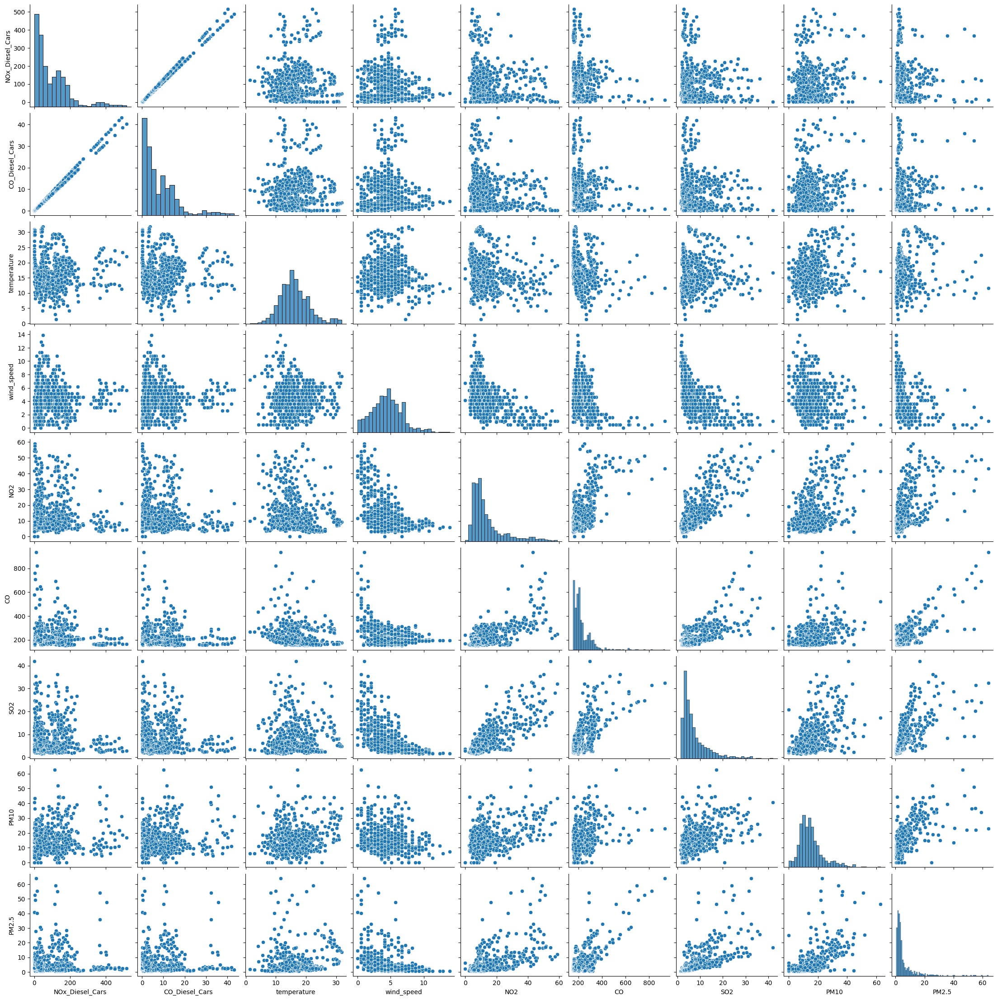

In [ ]:
selected_columnss = ['NOx_Diesel_Cars', 'CO_Diesel_Cars', 'temperature', 'wind_speed', 'NO2', 'CO', 'SO2', 'PM10', 'PM2.5']
subset_df = eda_data[selected_columnss]

# Create pair plot
sns.pairplot(subset_df)
plt.show()

This plot shows non-linearity in most of our variables

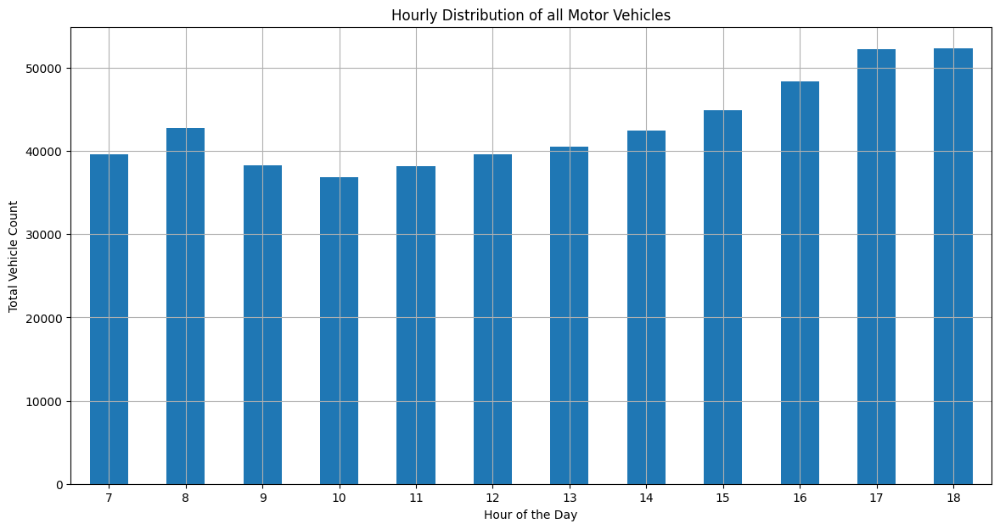

In [ ]:
#plot the hourly distribution

# Extract the hour from the 'Count_date'
eda_data['hour'] = eda_data.index.hour

# Group by the 'Hour' and sum the counts for all vehicle types
hourly_distribution = eda_data.groupby('hour').sum()

plt.figure(figsize=(14, 7))
hourly_distribution['Petrol_Cars'].plot(kind='bar')
plt.title('Hourly Distribution of all Motor Vehicles')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Vehicle Count')
plt.xticks(rotation=0)
plt.grid(True)
plt.show()

The hourly distribution of our data focuses on peak hours, 7am to 6pm. This is great analysis as peak hours generally result in higher emissions due to the increased number of vehicles on the road.

In [ ]:
# Vehicle Counts
vehicle_count_columns = ['Diesel_Cars', 'Petrol_Cars', 'Diesel_Buses_and_coaches', 'Petrol_Motorcycles', 'Diesel_Light_goods_vehicles',
                         'Petrol_Light_goods_vehicles', 'Diesel_Heavy_goods_vehicles']

# Emissions Data
emission_columns = ['NOx_Petrol_Cars','NOx_Diesel_Cars','NOx_Diesel_Buses', 'SO2_Diesel_Cars', 'SO2_Petrol_Cars','SO2_Diesel_Buses', 'CO_Diesel_Cars',
                    'CO_Petrol_Cars','CO_Diesel_Buses', 'PM10_Diesel_Cars', 'PM10_Petrol_Cars','PM10_Diesel_Buses',
                    'PM2.5_Diesel_Cars', 'PM2.5_Petrol_Cars', 'PM2.5_Diesel_Buses']

# Air Quality Indicators
air_quality_columns = ['CO', 'SO2', 'PM2.5', 'NO2', 'PM10', 'AQI']

#Weather_Data
weather_columns = ['temperature','pressure','humidity','wind_speed','wind_dir','rain_vol']



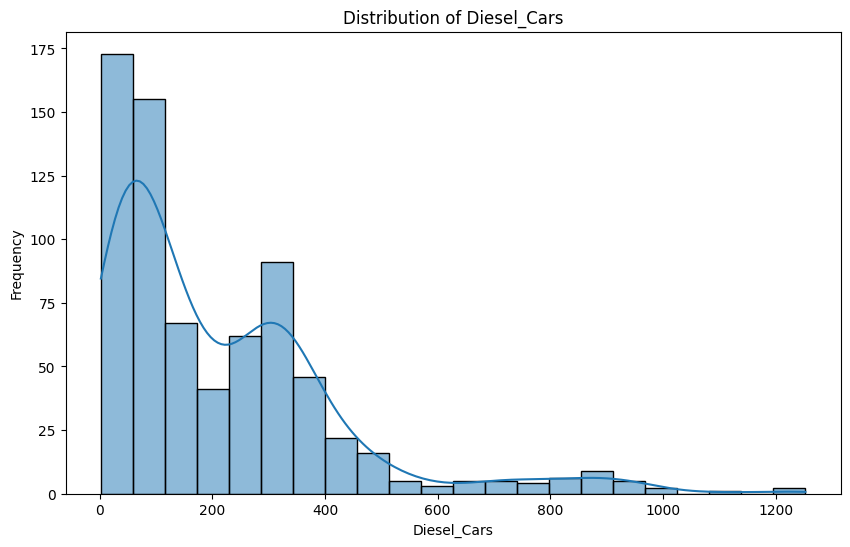

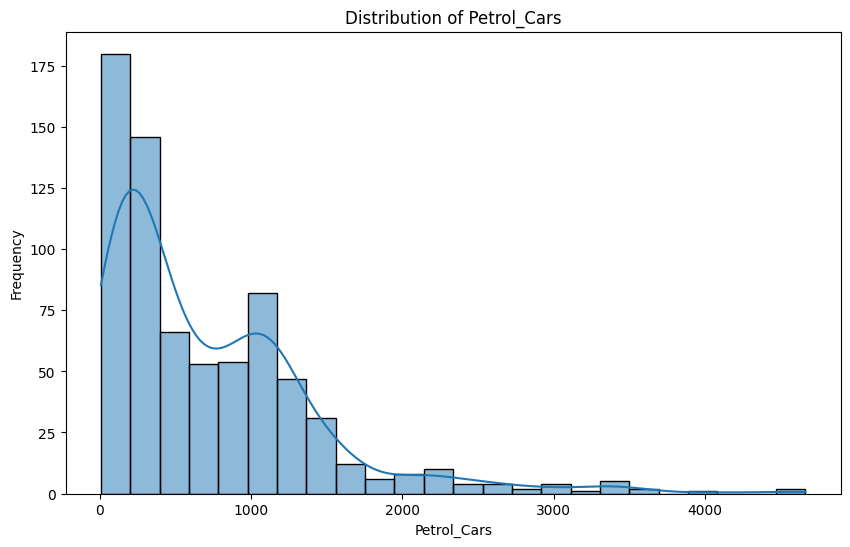

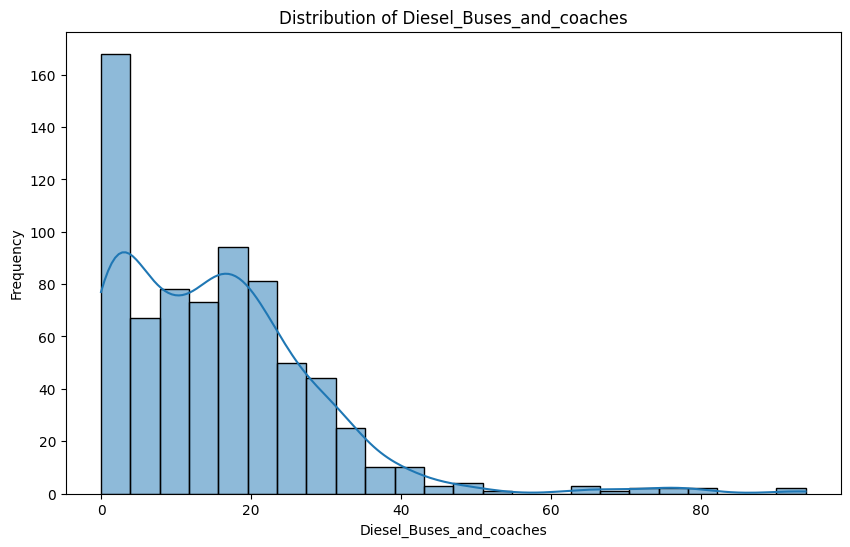

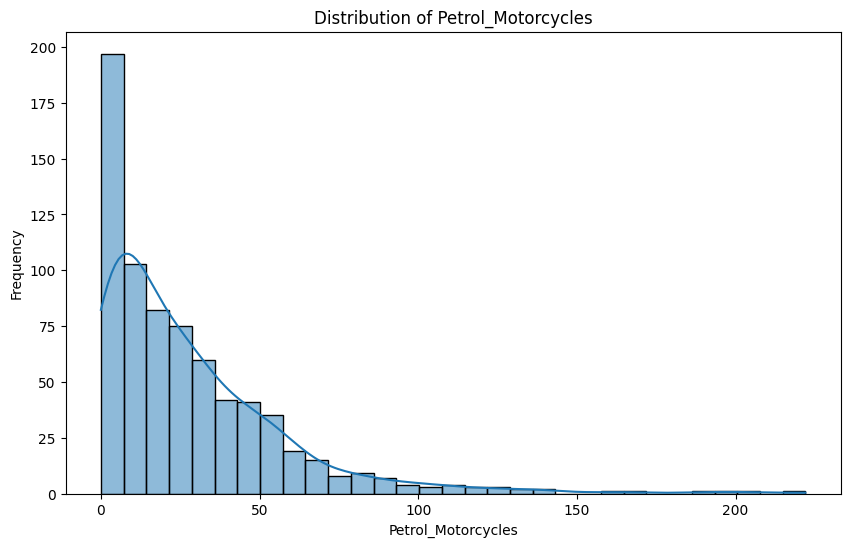

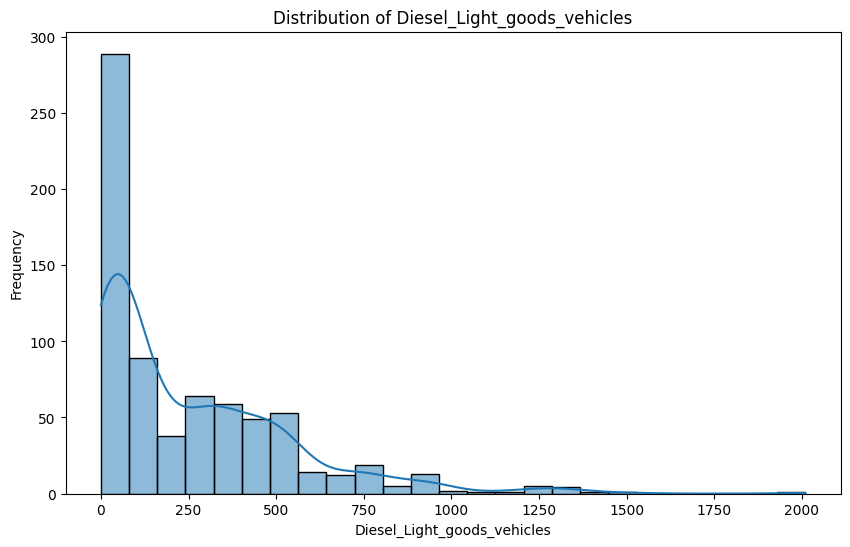

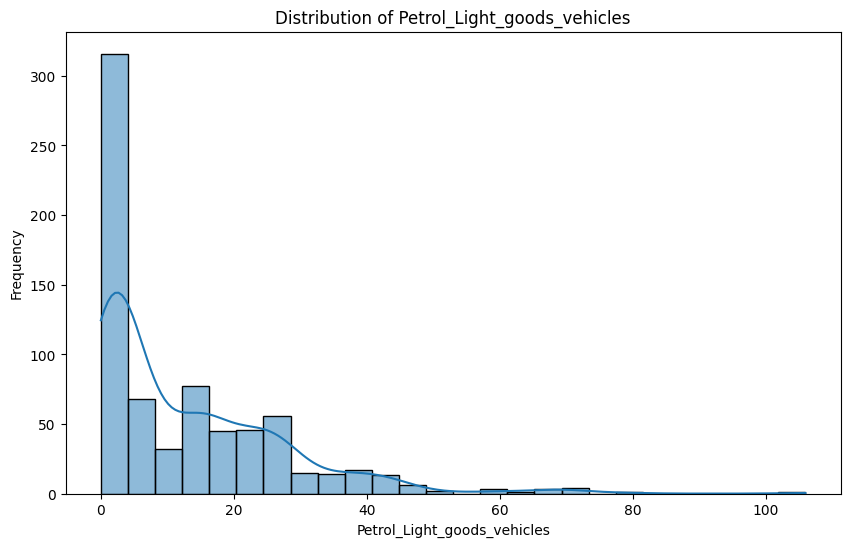

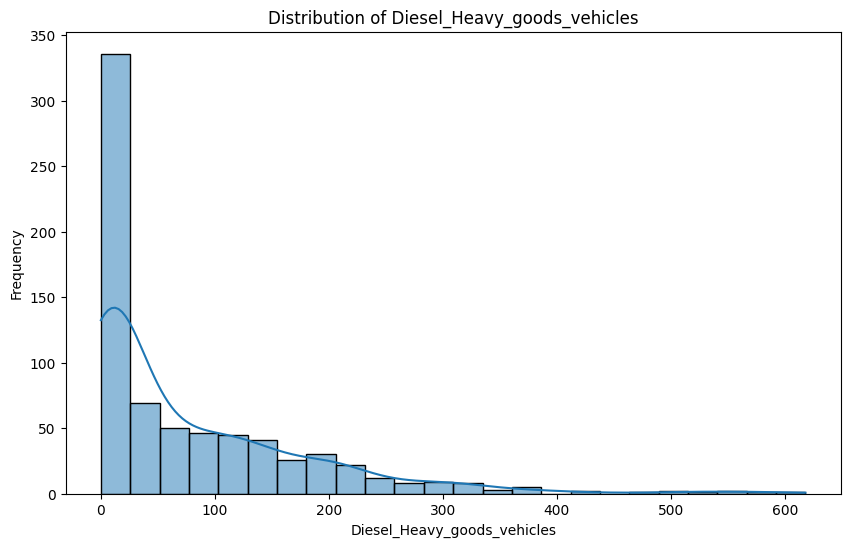

In [ ]:
# Plotting distributions for vehicle counts
for col in vehicle_count_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(eda_data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

From the vis above, the distribution of most of the vehicle fuel type counts are positively/right skewed. They suggest that most of the time, the counts for these vehicle types are low, but there are periods with higher traffic. For modeling purposes, these skewness might be standardized to normalize the distribution if necessary.

For a clearer and clean visual analysis, we would streamline our choice of vehicle emissions for exploration to the vehicles with the most counts from the previous plot, Buses and Cars

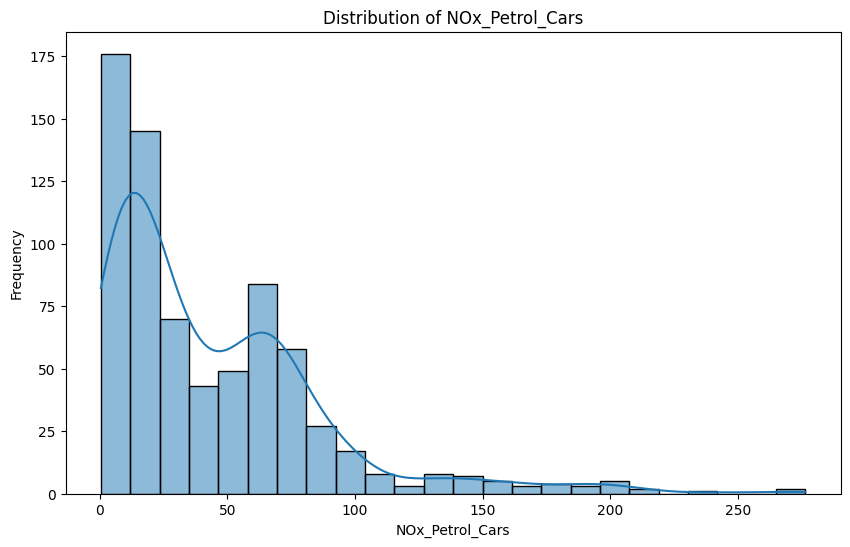

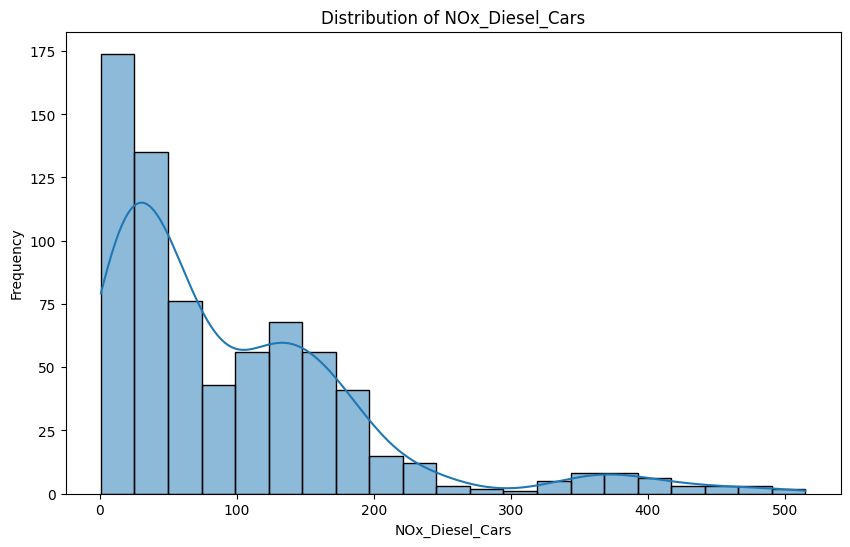

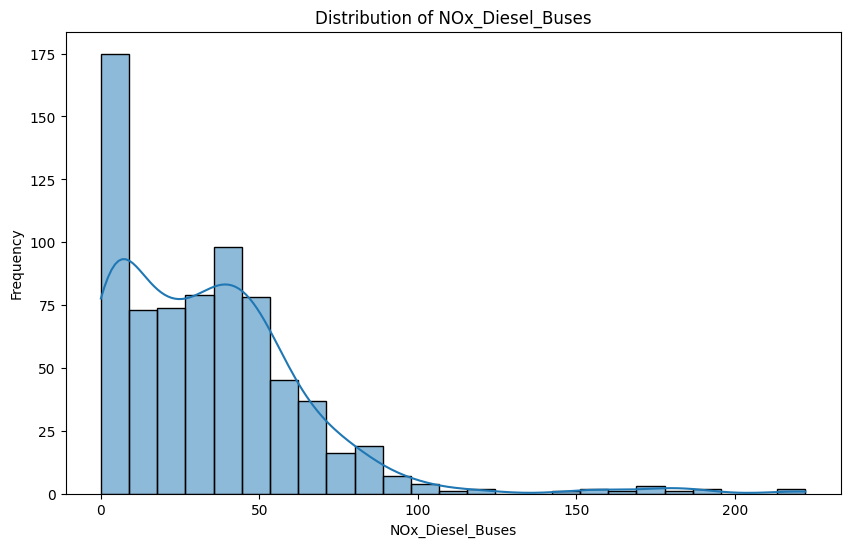

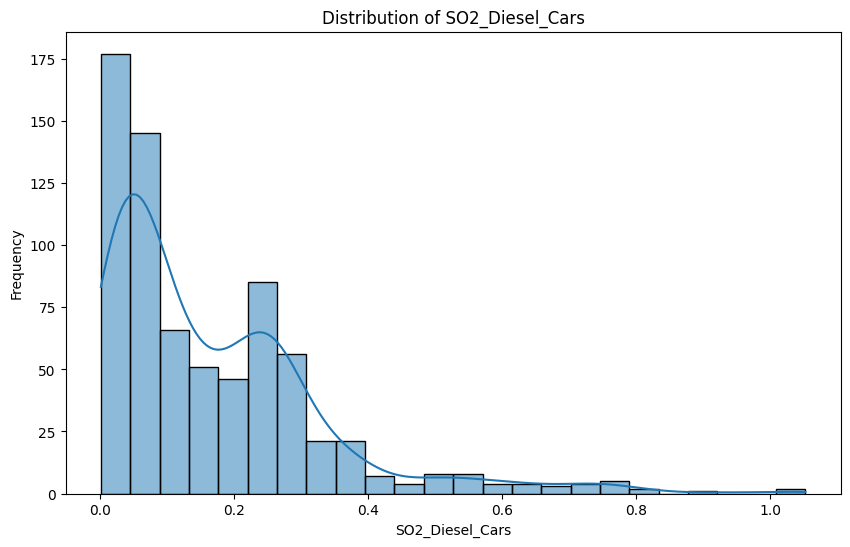

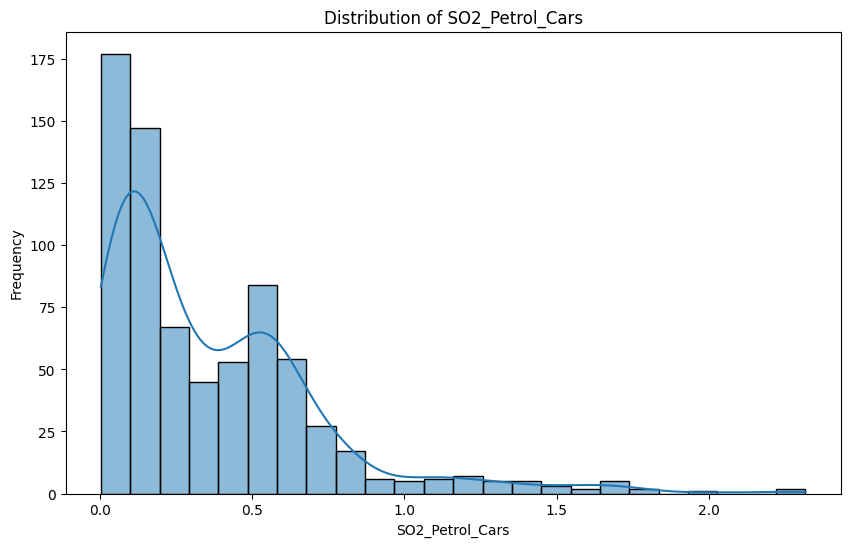

...

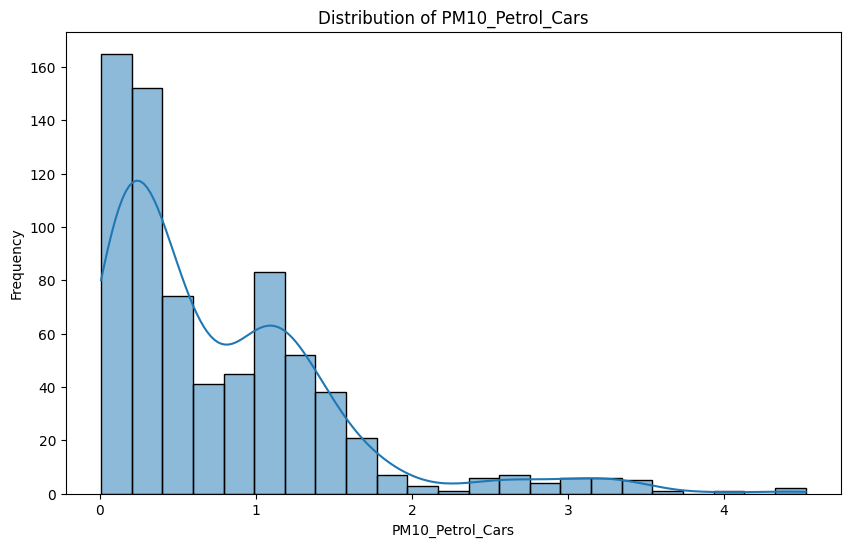

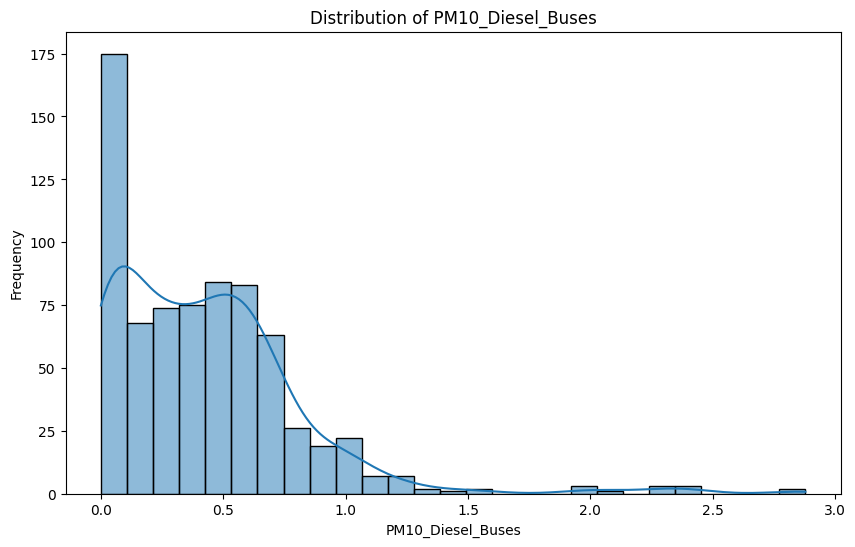

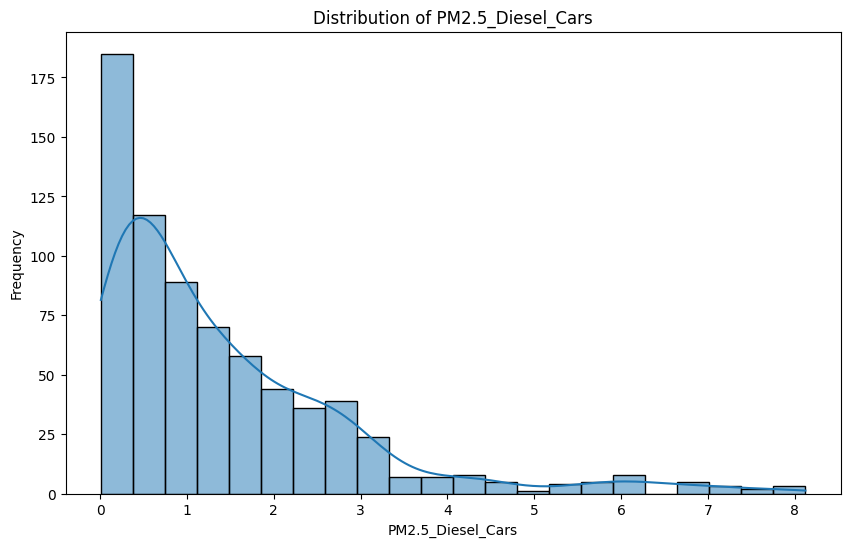

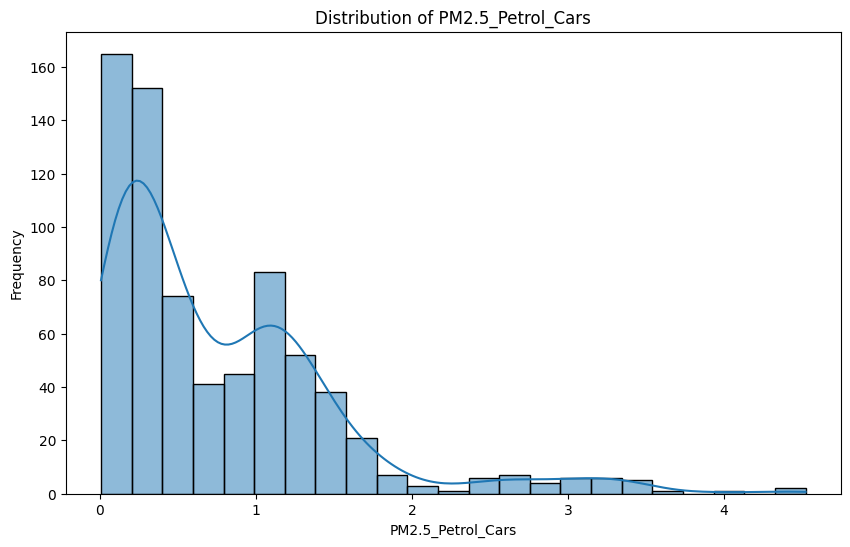

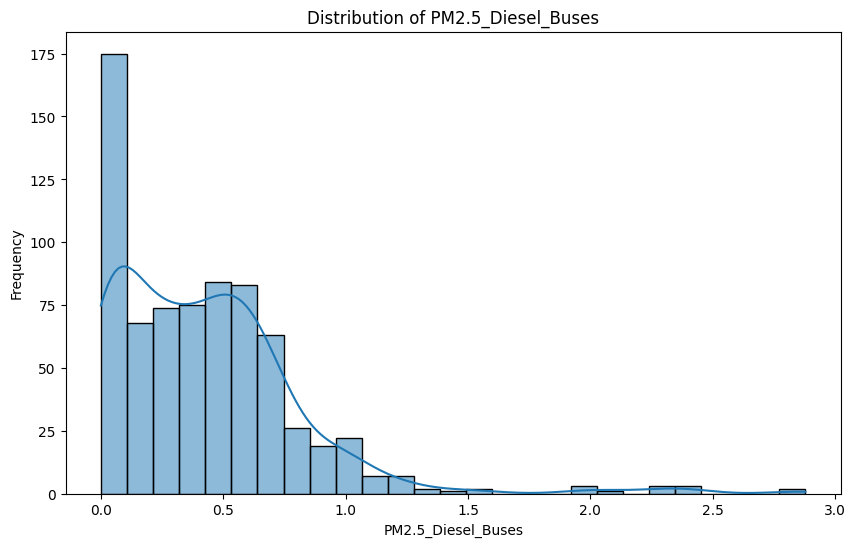

In [ ]:
# Plotting distributions for vehicle emissions
for col in emission_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(eda_data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

The emissions data histograms also appear right-skewed, with most of the data concentrated on the lower end of the emissions range and a tail stretching towards higher emissions values. This skweness in the data might be influenced by outliers or extreme values. The Shape of the histograms also suggest that most of the vehicles emit a relatively small amount of pollutants, but some may be responsible for higher emissions.

In the next line of code we'll investigate to see if the distributions of vehicle emissions differ by time of day

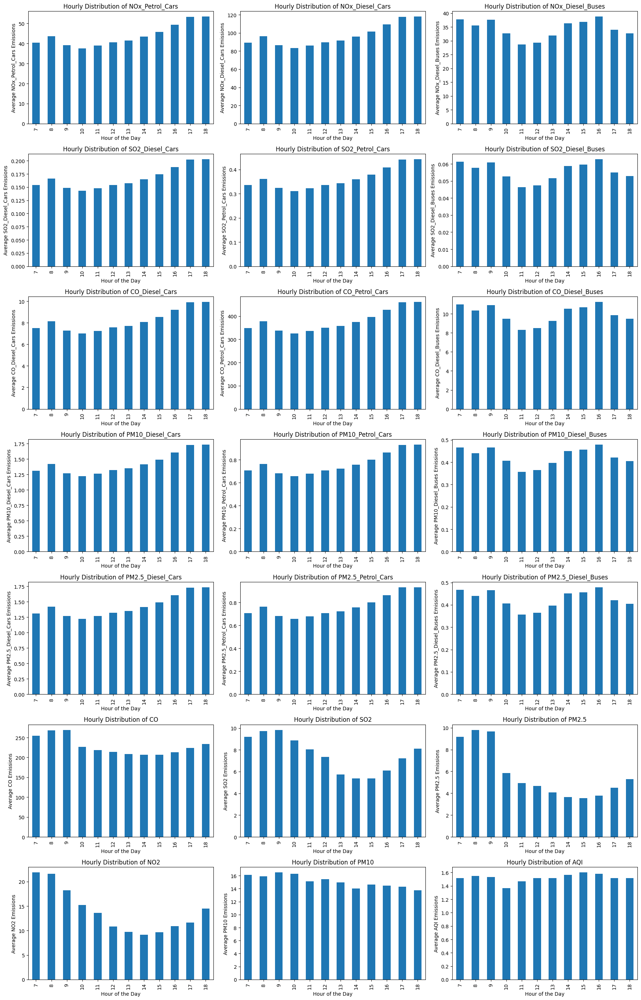

In [ ]:
# Number of rows and columns for the subplot grid
n_cols = 3
n_rows = int(len(emission_columns + air_quality_columns) / n_cols) + (len(emission_columns + air_quality_columns) % n_cols > 0)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Loop through each column and create a subplot
for i, col in enumerate(emission_columns + air_quality_columns):
    hourly_emissions = eda_data.groupby(eda_data.index.hour)[col].mean()
    hourly_emissions.plot(kind='bar', ax=axes[i])
    axes[i].set_title(f'Hourly Distribution of {col}')
    axes[i].set_xlabel('Hour of the Day')
    axes[i].set_ylabel(f'Average {col} Emissions')

# Hide any unused subplots
for i in range(len(emission_columns + air_quality_columns), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


The histograms of the hourly distribution of vehicle emissions appear to indicate variations in emissions throughout the day for different vehicle types. This suggests that emissions are indeed influenced by the time of day, which could be due to various factors such as traffic flow changes during rush hours, different driving conditions, or even variations in atmospheric conditions affecting pollutant dispersion.

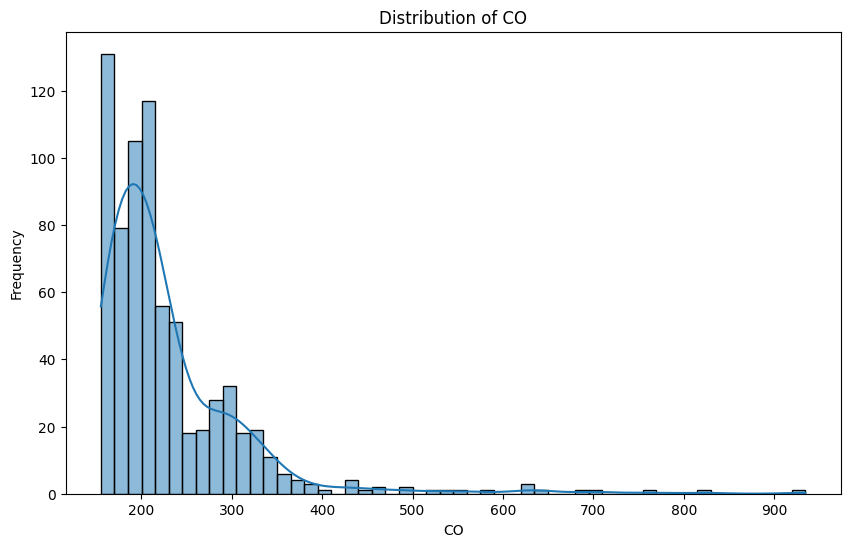

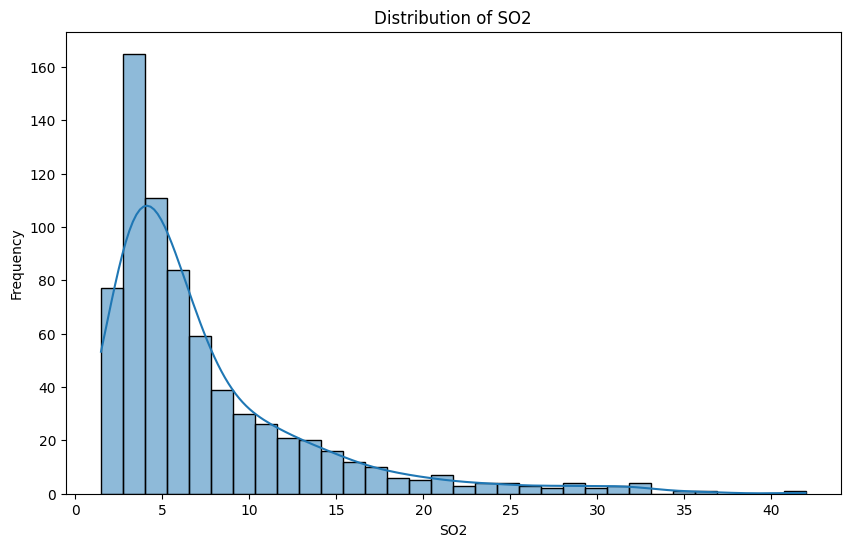

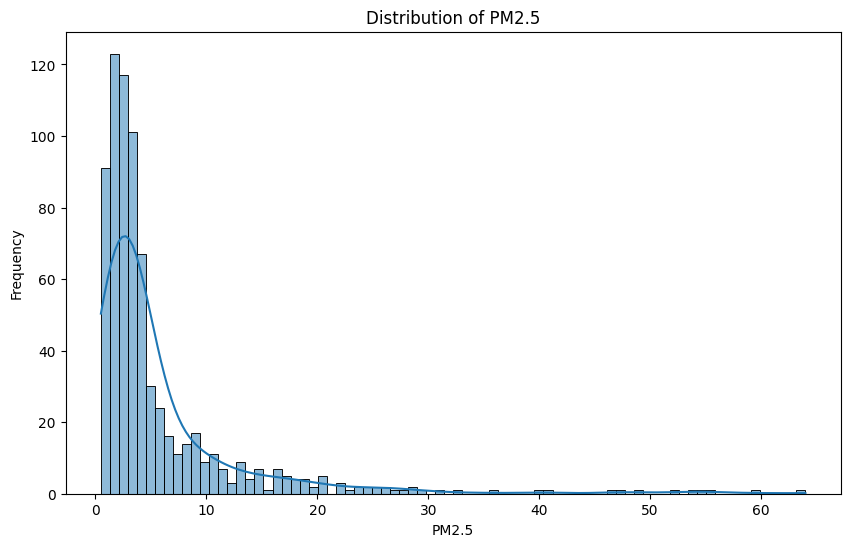

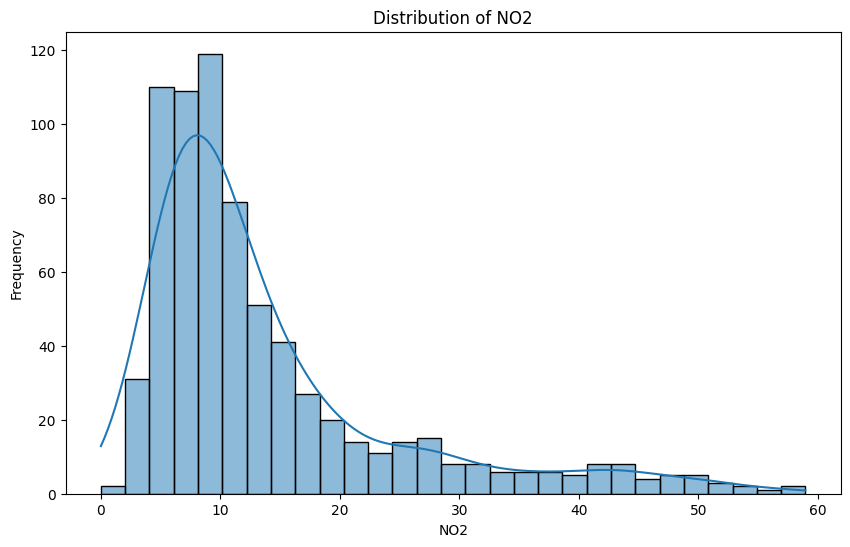

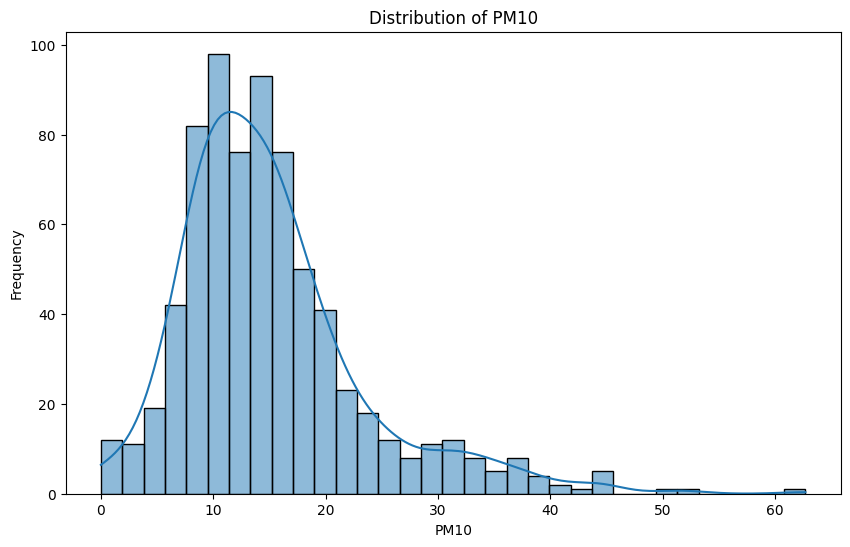

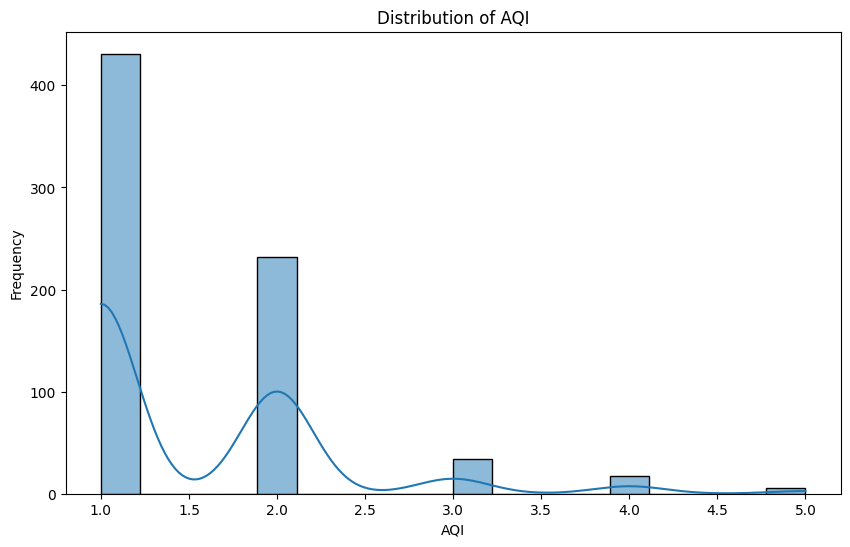

In [ ]:
# Plotting distributions for AQ indicators
for col in air_quality_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(eda_data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

Most of the AQI histograms also have a right-skewed distribution, indicating that most of the observations are low with a tail(outlier) stretching towards higher values. This suggests that the occurrence of the pollutant levels could be influenced by both meteorological conditions and various other sources including heavy traffic, industrial activities, natural events etc

**Correlations:** In next line we would explore the emissions profile and the relationship between vehicle emissions and air quality indicators.

Given the skewness in the distributions, Spearman's correlation would provide a more robust measure of association that does not rely on the assumption of normally distributed data.

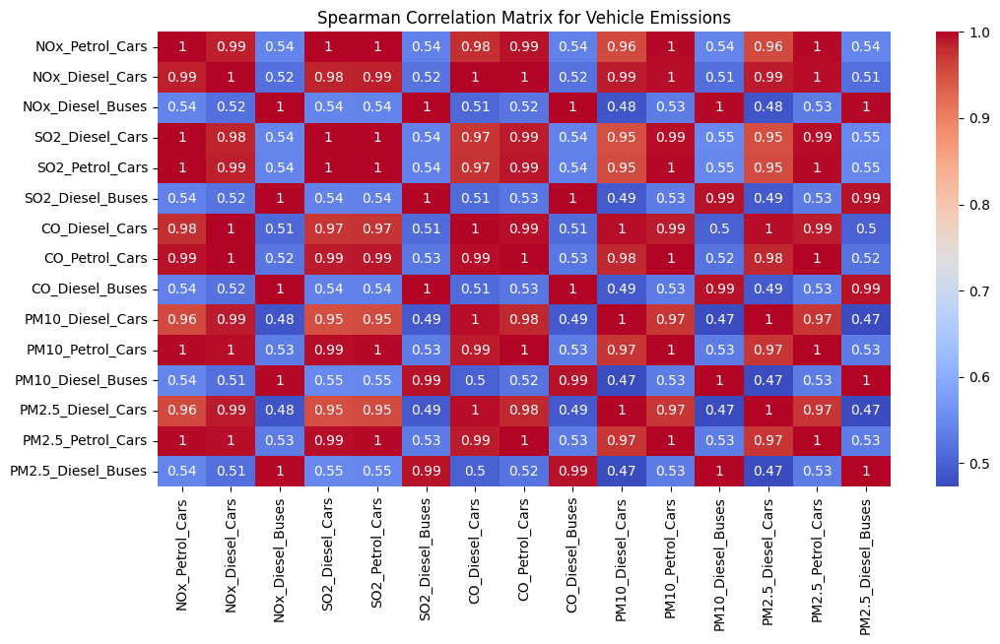

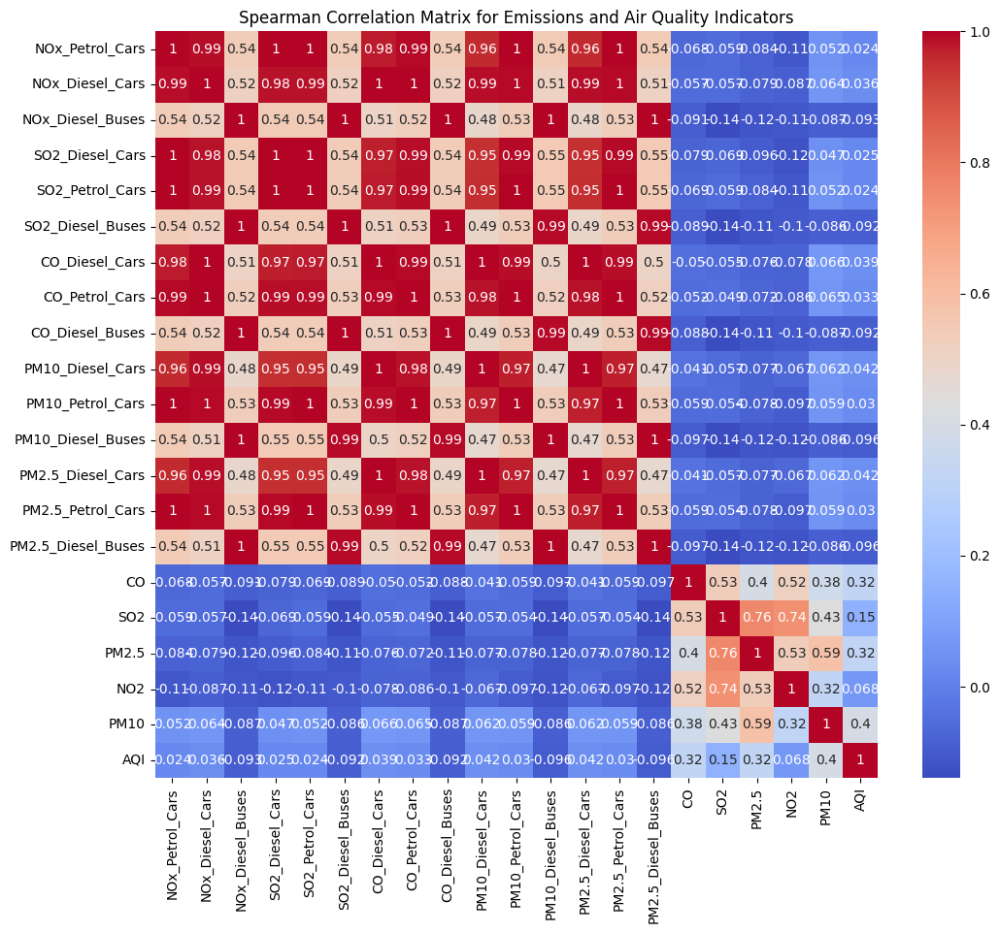

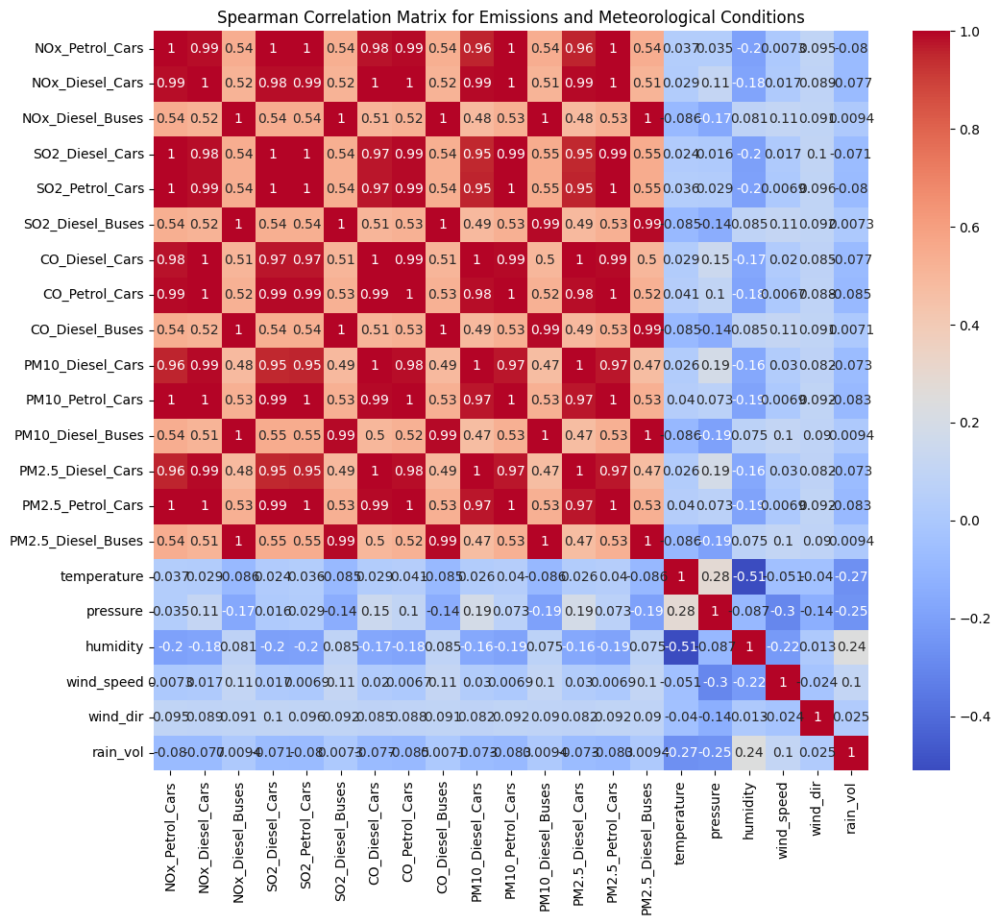

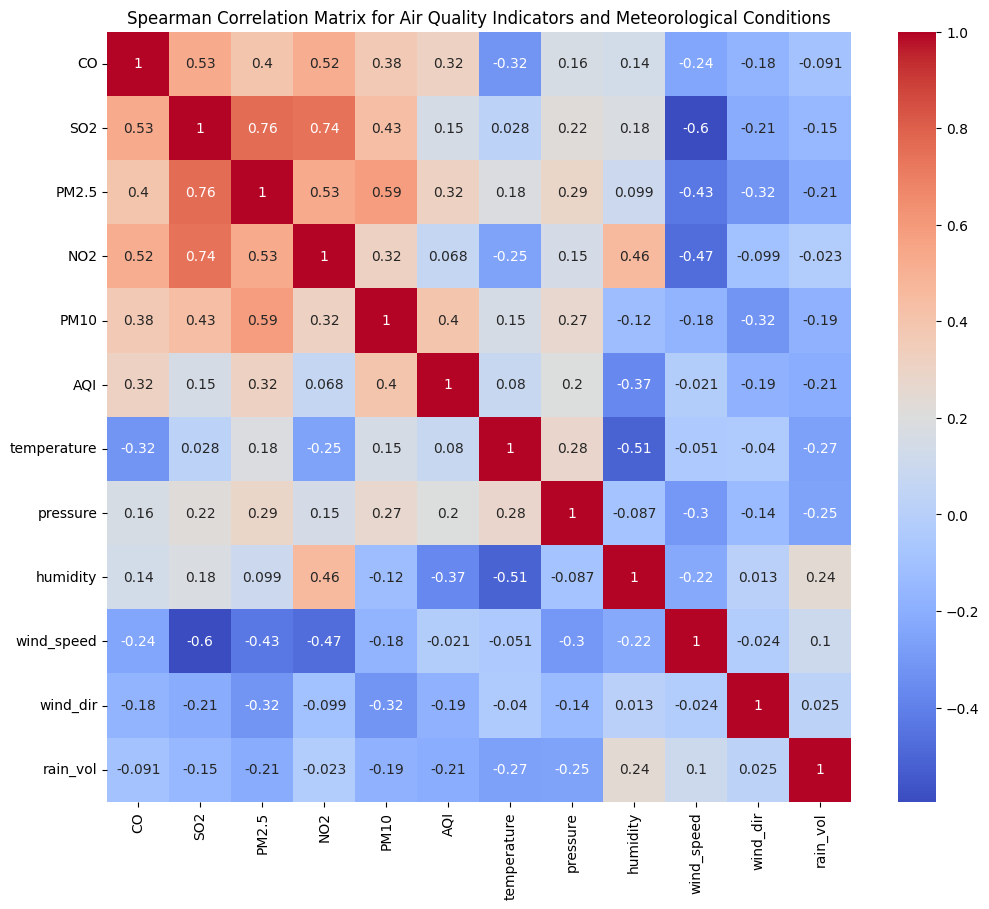

In [ ]:
# Correlations between different emission types using Spearman's method
correlation_matrix_emissions = eda_data[emission_columns].corr(method='spearman')

# Correlations between emissions and air quality indicators using Spearman's method
correlation_matrix_air_quality = eda_data[emission_columns + air_quality_columns].corr(method='spearman')

# Correlations between emissions and weather conditions using Spearman's method
correlation_matrix_weather = eda_data[emission_columns + weather_columns].corr(method= 'spearman')

# Correlations between emissions and weather conditions using Spearman's method
correlation_matrix_weather_air = eda_data[air_quality_columns + weather_columns].corr(method= 'spearman')

# Plotting
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix_emissions, annot=True, cmap='coolwarm')
plt.title('Spearman Correlation Matrix for Vehicle Emissions')
plt.show()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_air_quality, annot=True, cmap='coolwarm')
plt.title('Spearman Correlation Matrix for Emissions and Air Quality Indicators')
plt.show()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_weather, annot=True, cmap='coolwarm')
plt.title('Spearman Correlation Matrix for Emissions and Meteorological Conditions')
plt.show()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_weather_air, annot=True, cmap='coolwarm')
plt.title('Spearman Correlation Matrix for Air Quality Indicators and Meteorological Conditions')
plt.show()



In [ ]:
correlation_matrix_air_quality

,NOx_Petrol_Cars,NOx_Diesel_Cars,NOx_Diesel_Buses,SO2_Diesel_Cars,SO2_Petrol_Cars,SO2_Diesel_Buses,CO_Diesel_Cars,CO_Petrol_Cars,CO_Diesel_Buses,PM10_Diesel_Cars,...,PM10_Diesel_Buses,PM2.5_Diesel_Cars,PM2.5_Petrol_Cars,PM2.5_Diesel_Buses,CO,SO2,PM2.5,NO2,PM10,AQI
NOx_Petrol_Cars,1.000000,0.987616,0.540736,0.998741,0.999903,0.537384,0.977340,0.992501,0.537168,0.956644,...,0.544340,0.956644,0.997439,0.544340,-0.068133,-0.059256,-0.084005,-0.108886,0.052462,0.024310
NOx_Diesel_Cars,0.987616,1.000000,0.517991,0.984571,0.985830,0.520161,0.997957,0.998599,0.519976,0.988307,...,0.514420,0.988307,0.995540,0.514420,-0.057157,-0.057197,-0.078976,-0.086930,0.063670,0.036334
NOx_Diesel_Buses,0.540736,0.517991,1.000000,0.543714,0.542221,0.998603,0.505712,0.524105,0.998584,0.483010,...,0.997864,0.483010,0.531610,0.997864,-0.091496,-0.138060,-0.117042,-0.109338,-0.087003,-0.093307
SO2_Diesel_Cars,0.998741,0.984571,0.543714,1.000000,0.998977,0.539293,0.973029,0.988463,0.539058,0.950740,...,0.548700,0.950740,0.994508,0.548700,-0.078682,-0.069280,-0.096182,-0.118769,0.047009,0.024694
SO2_Petrol_Cars,0.999903,0.985830,0.542221,0.998977,1.000000,0.538417,0.974954,0.991018,0.538199,0.953426,...,0.546401,0.953426,0.996520,0.546401,-0.068843,-0.059129,-0.084114,-0.110151,0.052087,0.024011
SO2_Diesel_Buses,0.537384,0.520161,0.998603,0.539293,0.538417,1.000000,0.509968,0.525314,0.999995,0.490231,...,0.993573,0.490231,0.530881,0.993573,-0.088523,-0.139588,-0.114914,-0.103793,-0.086435,-0.092144
CO_Diesel_Cars,0.977340,0.997957,0.505712,0.973029,0.974954,0.509968,1.000000,0.994839,0.509822,0.995557,...,0.499306,0.995557,0.988800,0.499306,-0.050198,-0.055284,-0.075502,-0.077829,0.066007,0.039433
CO_Petrol_Cars,0.992501,0.998599,0.524105,0.988463,0.991018,0.525314,0.994839,1.000000,0.525133,0.982930,...,0.521809,0.982930,0.998529,0.521809,-0.051593,-0.049487,-0.071713,-0.085787,0.064573,0.033443
CO_Diesel_Buses,0.537168,0.519976,0.998584,0.539058,0.538199,0.999995,0.509822,0.525133,1.000000,0.490134,...,0.993512,0.490134,0.530686,0.993512,-0.088361,-0.139469,-0.114754,-0.103681,-0.086571,-0.092098
PM10_Diesel_Cars,0.956644,0.988307,0.483010,0.950740,0.953426,0.490231,0.995557,0.982930,0.490134,1.000000,...,0.472696,1.000000,0.972958,0.472696,-0.041498,-0.056575,-0.077348,-0.066700,0.062082,0.042305


The Spearman Correlation Matrix we've observed the following:


*  **High Positive Correlation between Different Pollutants from Same Vehicle Fuel Types:** For instance, NOx emissions from petrol cars are highly correlated with CO and PM2.5 emissions from petrol cars. This indicates that vehicles emitting high levels of one pollutant are likely to emit high levels of others. This might suggest a common underlying factor that increases these emissions simultaneously, such as engine efficiency, combustion processes, or driving patterns.
*   **Moderate to Low Negative Correlation between Emissions and Air Quality Indicators:** The negative correlations between vehicle emissions and air quality indicators are quite weak (ranging from -0.041498 to -0.097135 for different emission types), indicating a less direct or more complex relationship between these specific emissions and ambient pollutant levels.This could be due to atmospheric reactions, dispersion factors, or the presence of other pollutant sources.
*   **Strong Positive Correlation between Air Quality Indicators:** SO2 shows a strong positive correlation with PM2.5 (0.760787) and NO2 (0.738563), suggesting that sources contributing to SO2 emissions are also contributing to these other pollutants. This may indicate common sources such as industrial activities or the burning of fossil fuels.
*  **Moderate to Low negative Correlation Vehicle Emissions and Weather Data:** Positive correlations (close to 1) between vehicle emissions and weather variables suggest that certain meteorological conditions are associated with higher emissions. For example, temperature has a positive correlation with NOx from diesel cars, this means that warmer temperatures lead to increased NOx emissions
Negative correlations (close to -1) suggest that certain emissions decrease as the weather variable increases. For instance, a negative correlation between humidity and NOx emissions might indicate that higher humidity levels are associated with lower NOx emissions, possibly due to atmospheric chemical reactions that reduce NOx under humid conditions.


**Temporal Trends**: We would explore the time series aspect of our data to identify any visible trends over time and also understand how vehicle emissions and air quality indicators evolve and respond to external factors, which is essential for accurate predictions.

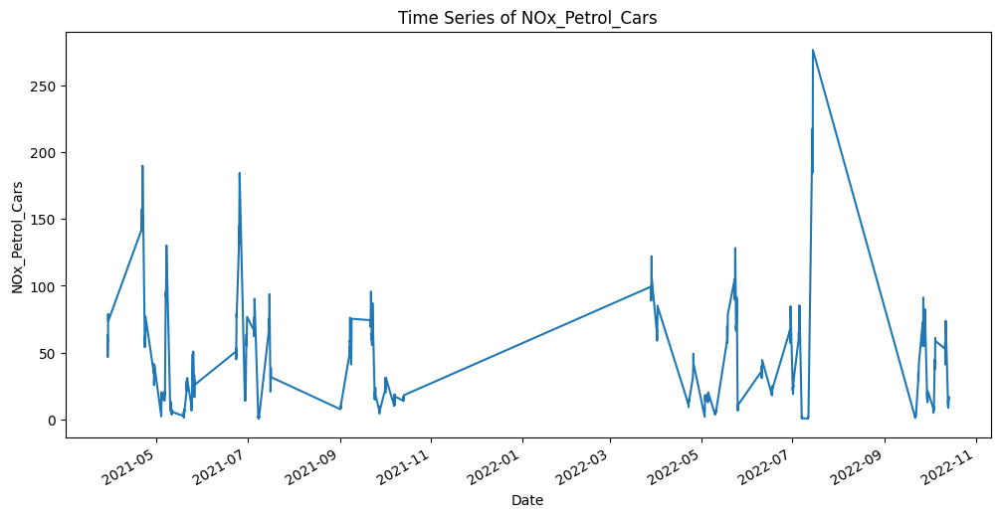

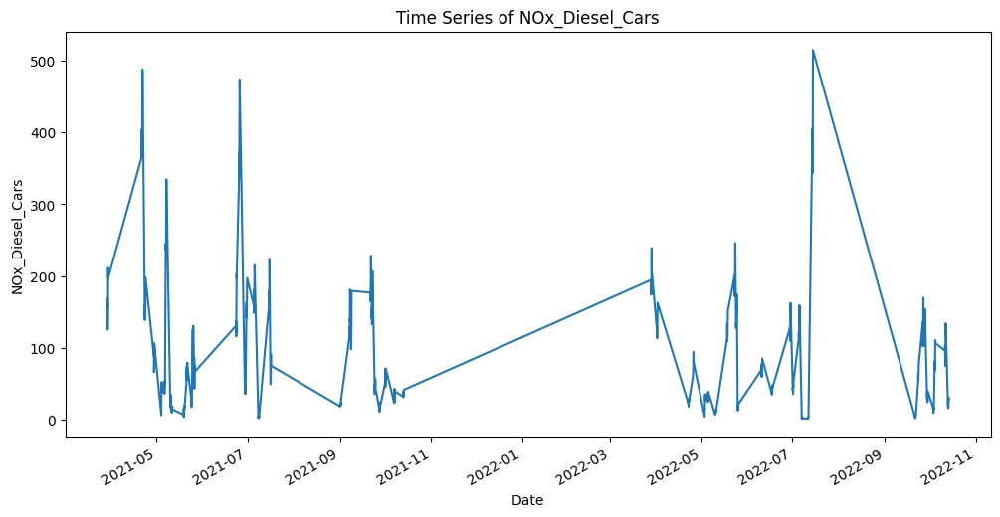

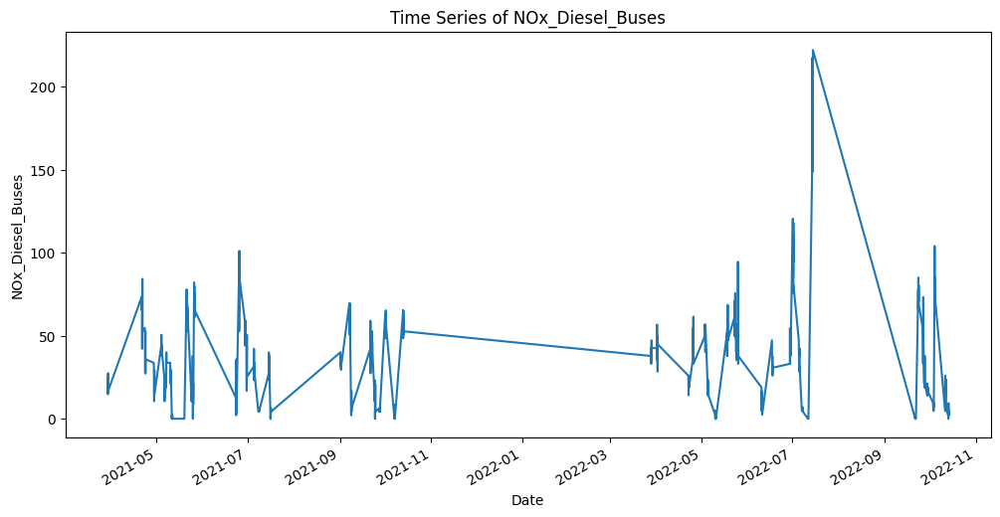

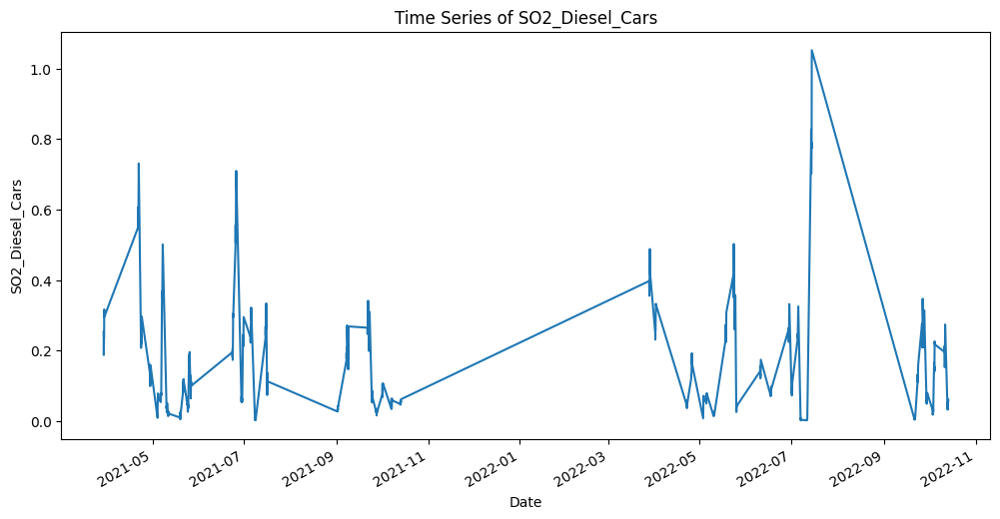

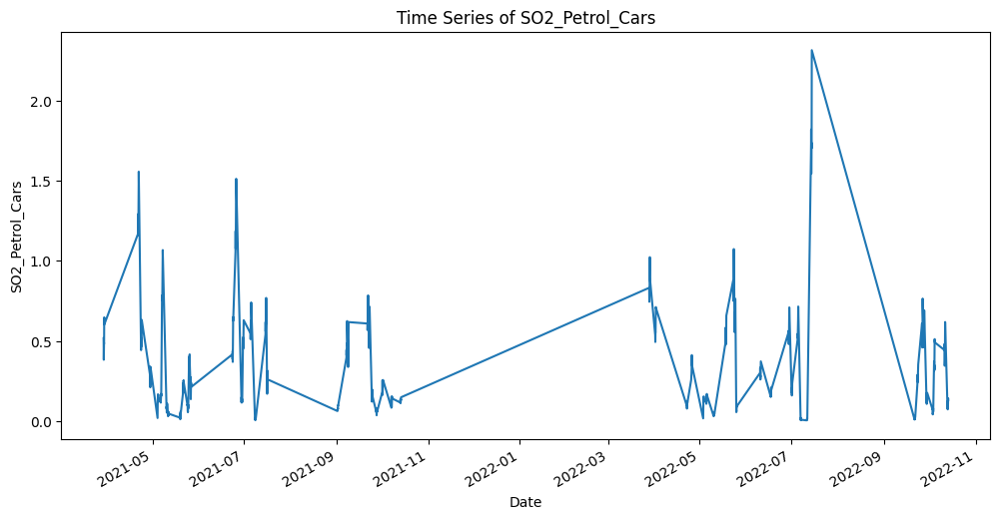

...

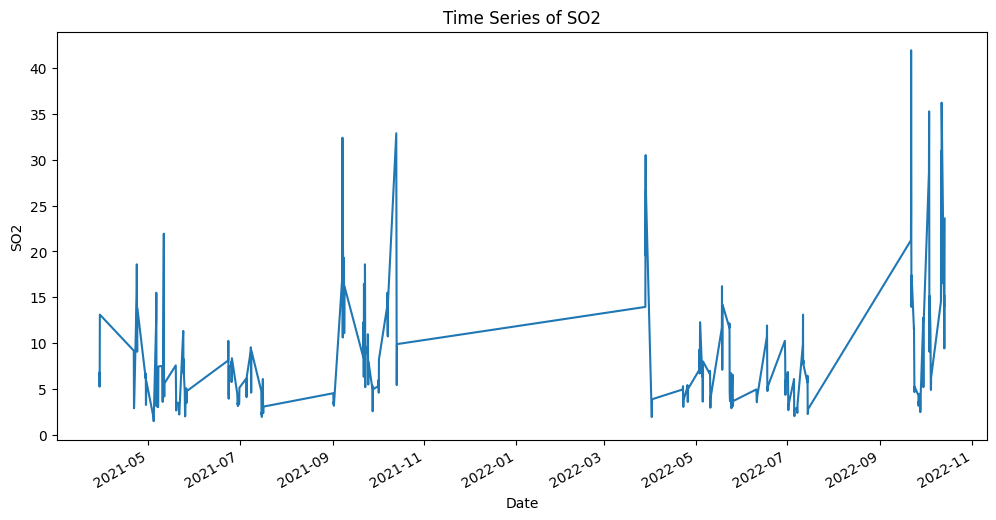

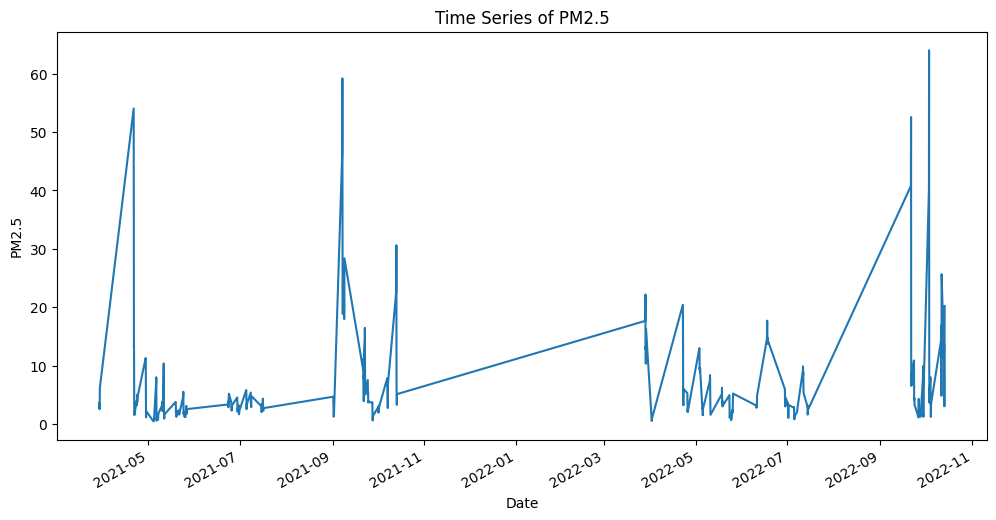

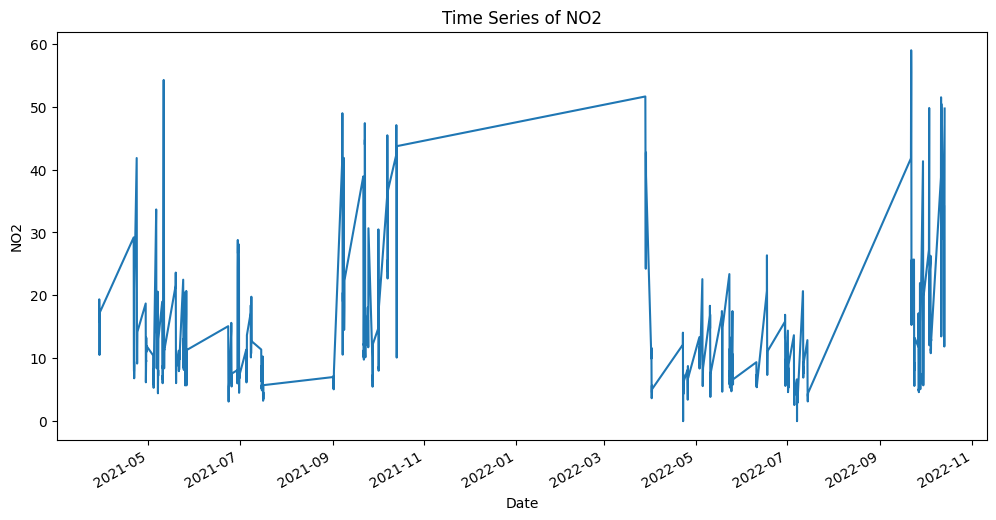

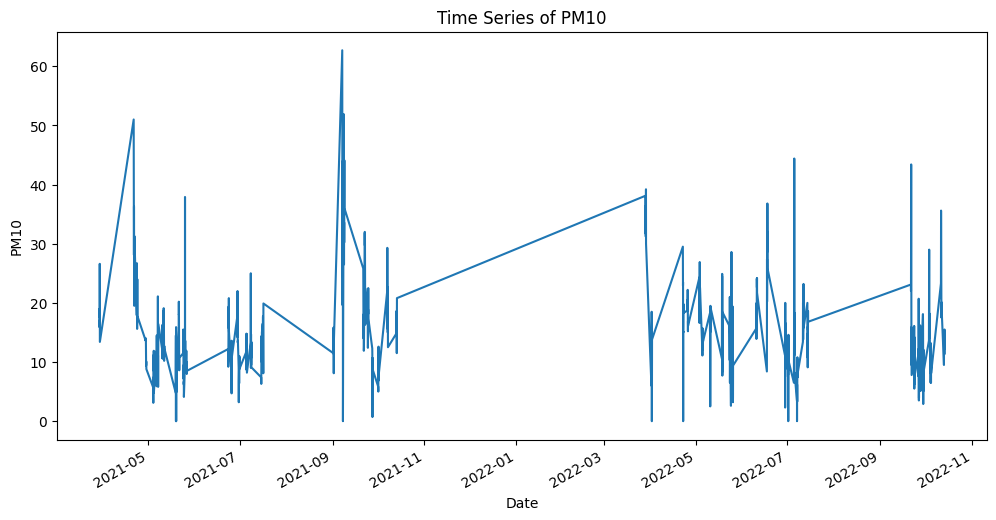

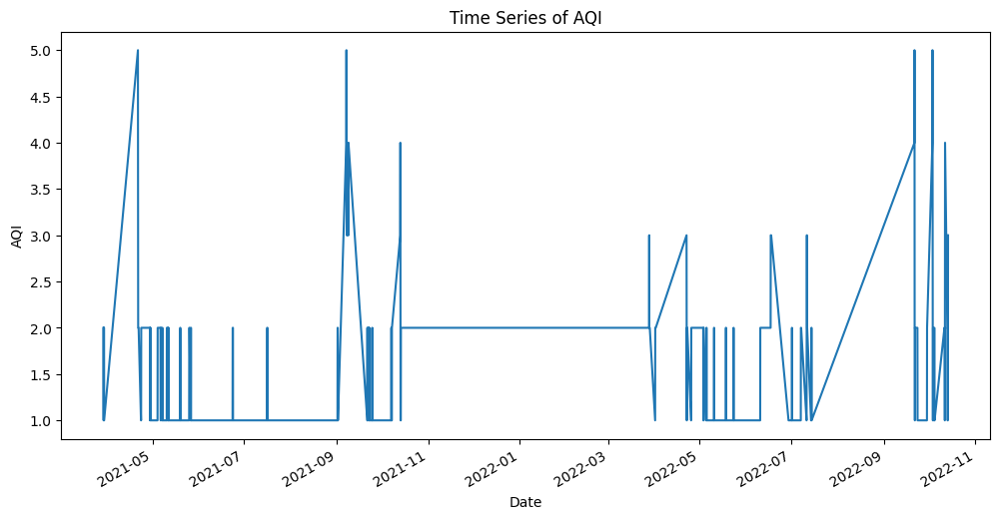

In [ ]:
# Time series plots
for col in emission_columns + air_quality_columns:
    plt.figure(figsize=(12, 6))
    eda_data[col].plot()
    plt.title(f'Time Series of {col}')
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.show()


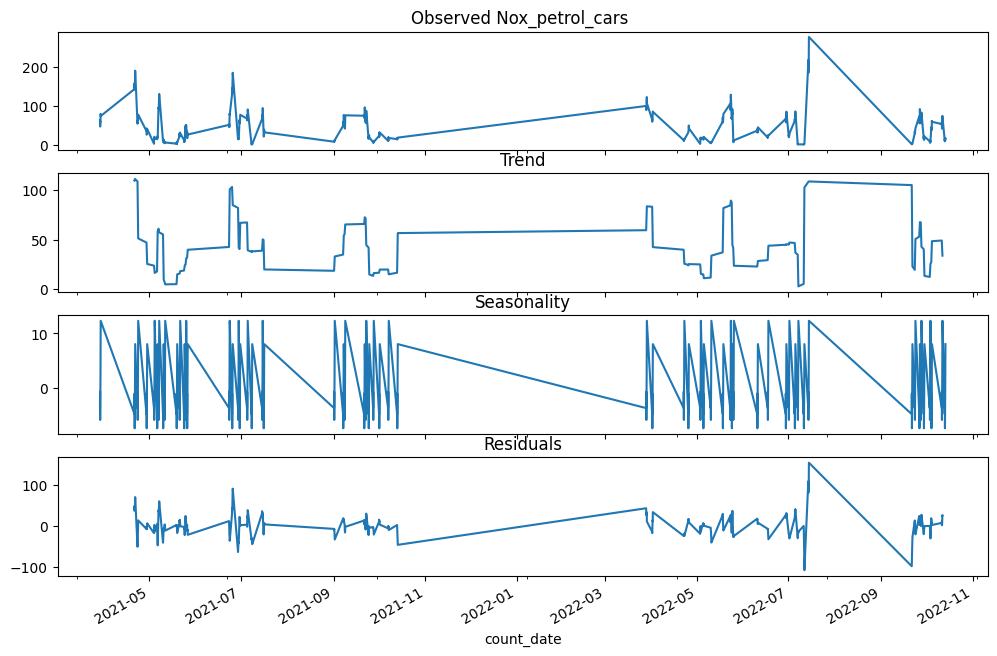

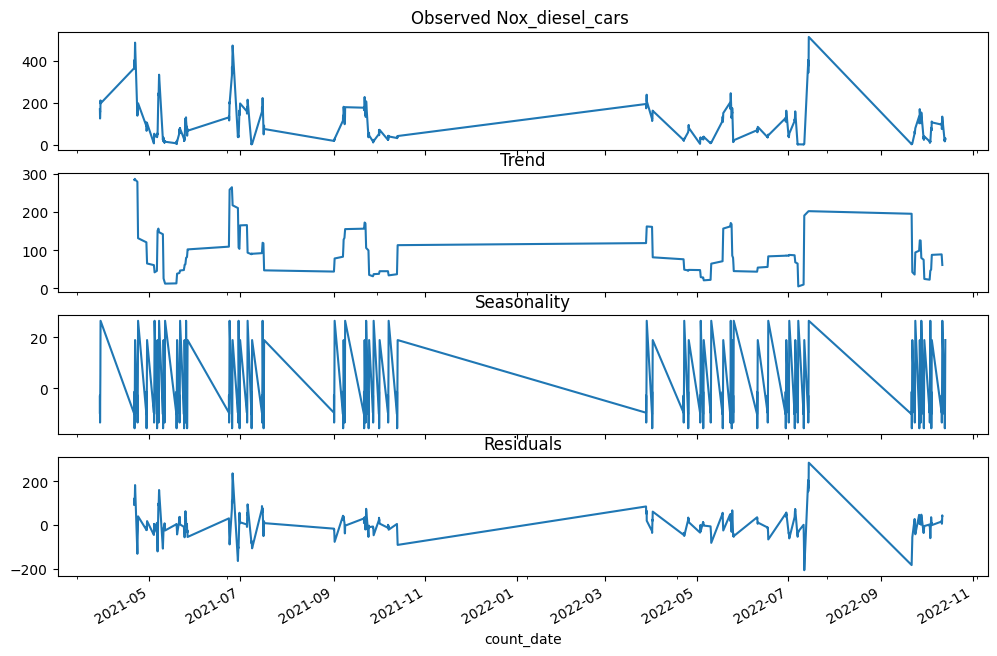

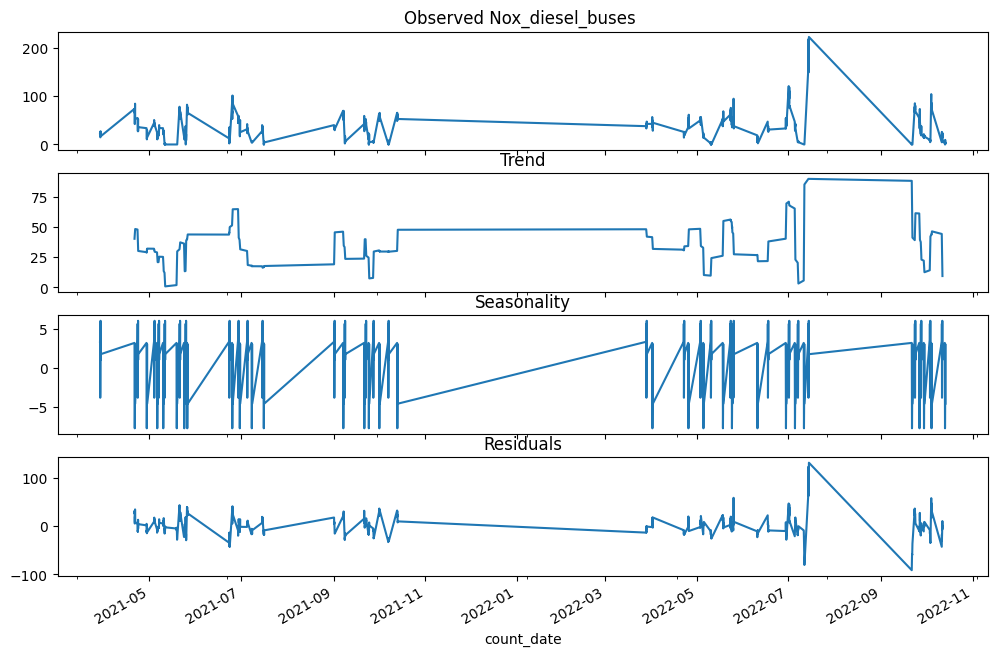

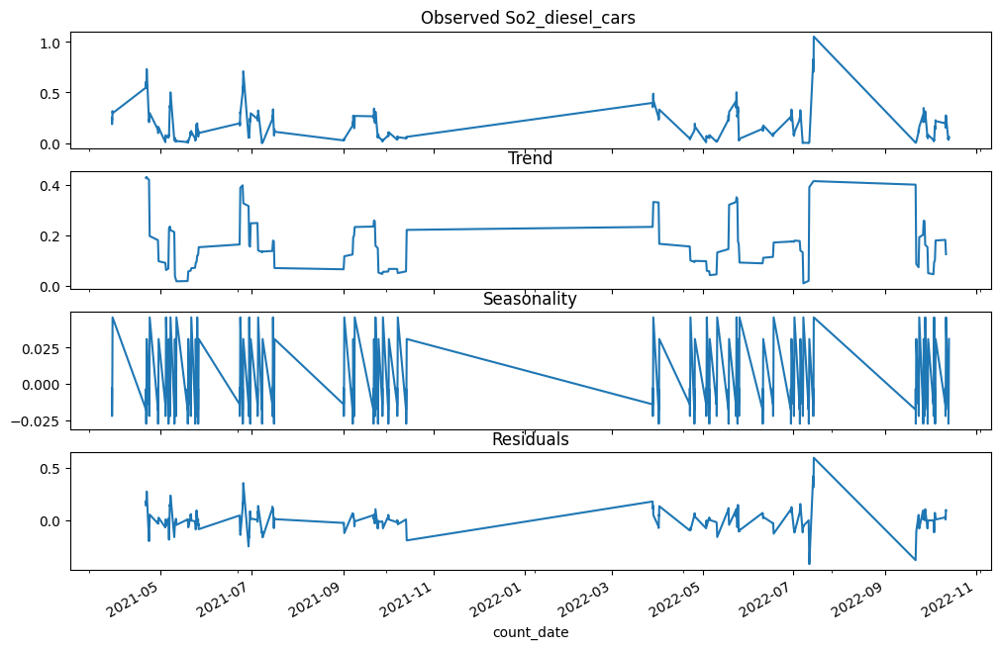

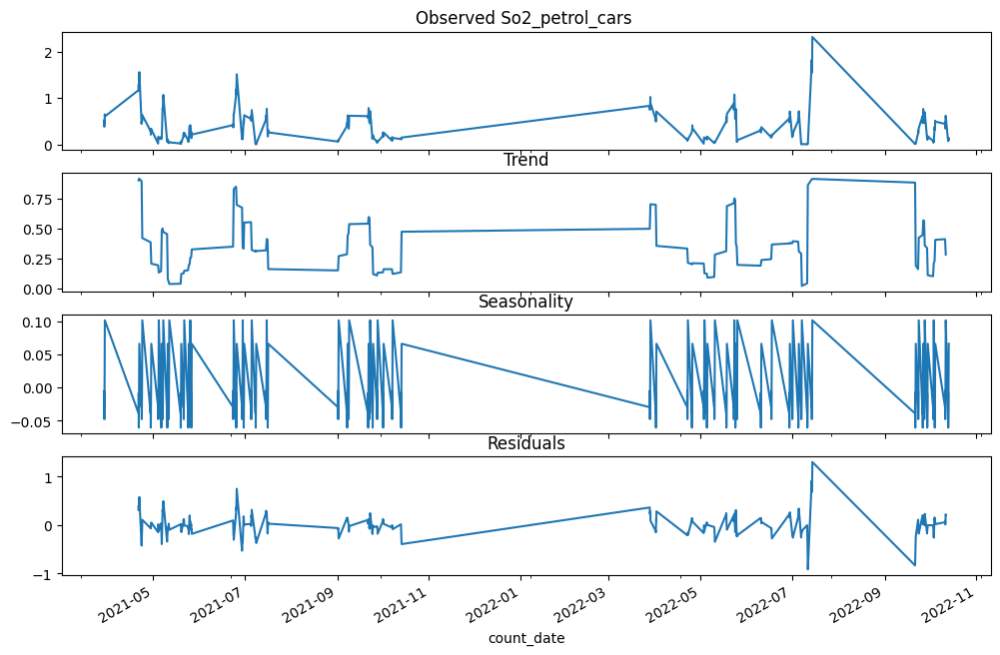

...

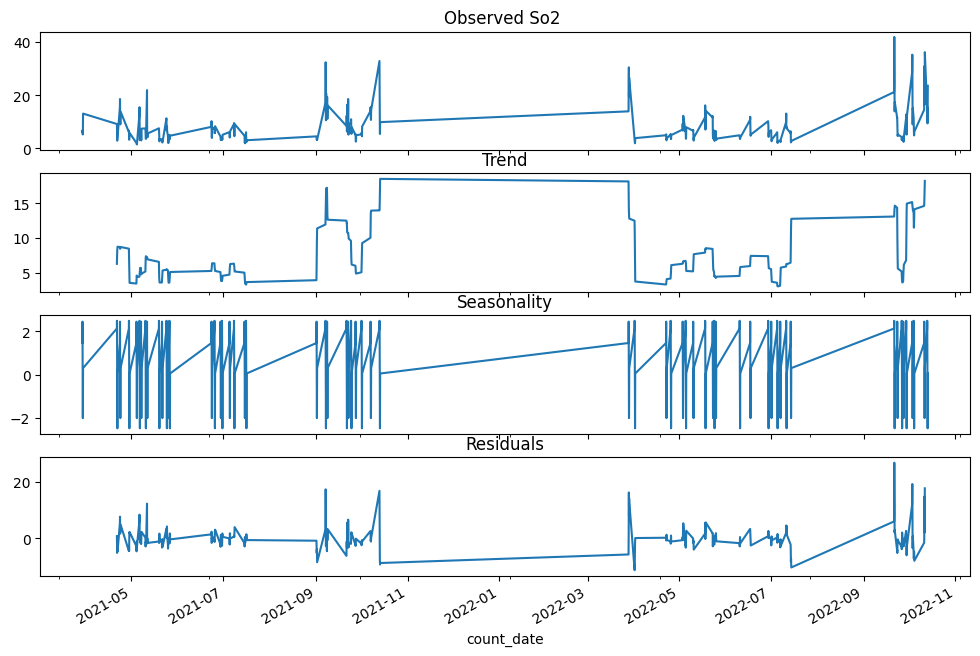

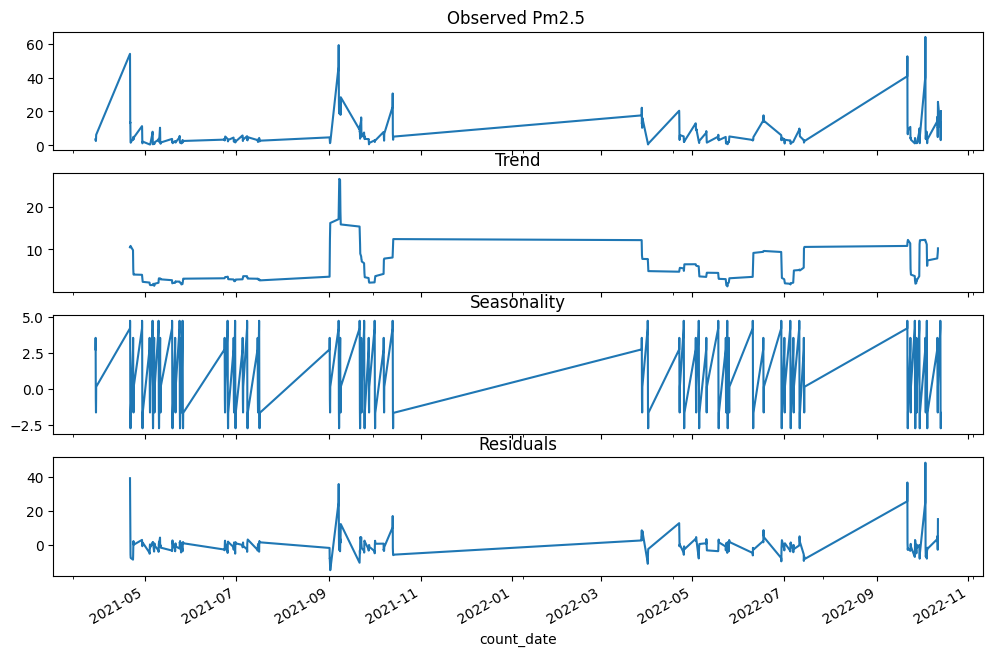

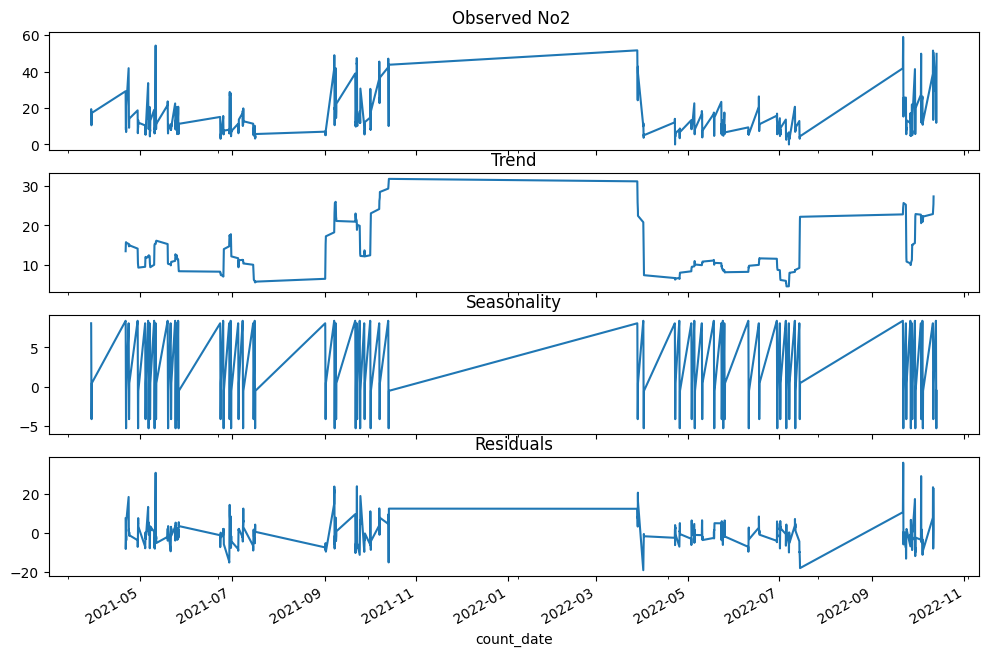

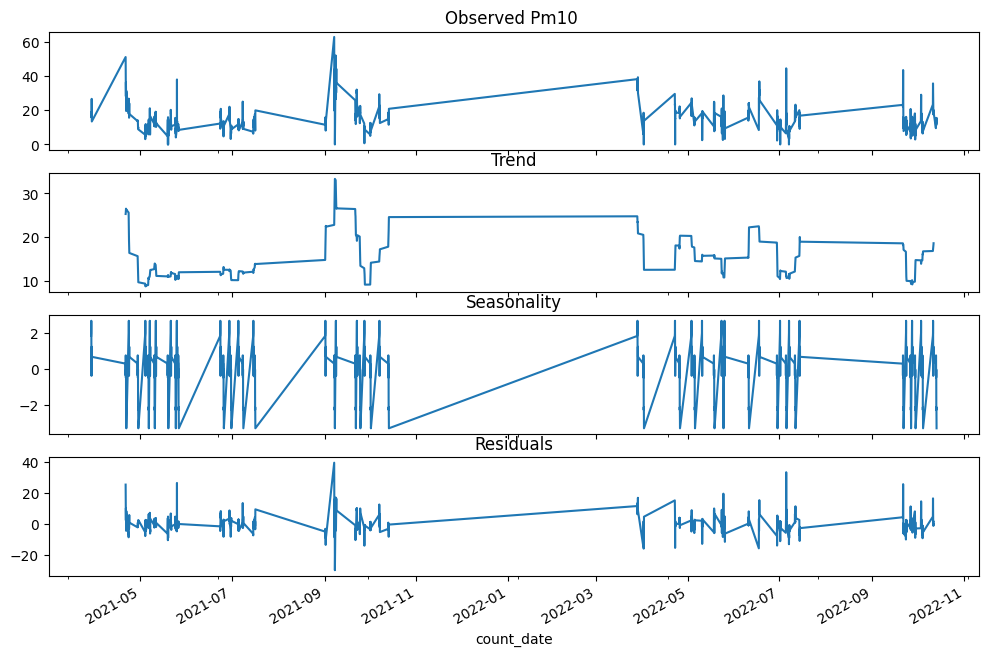

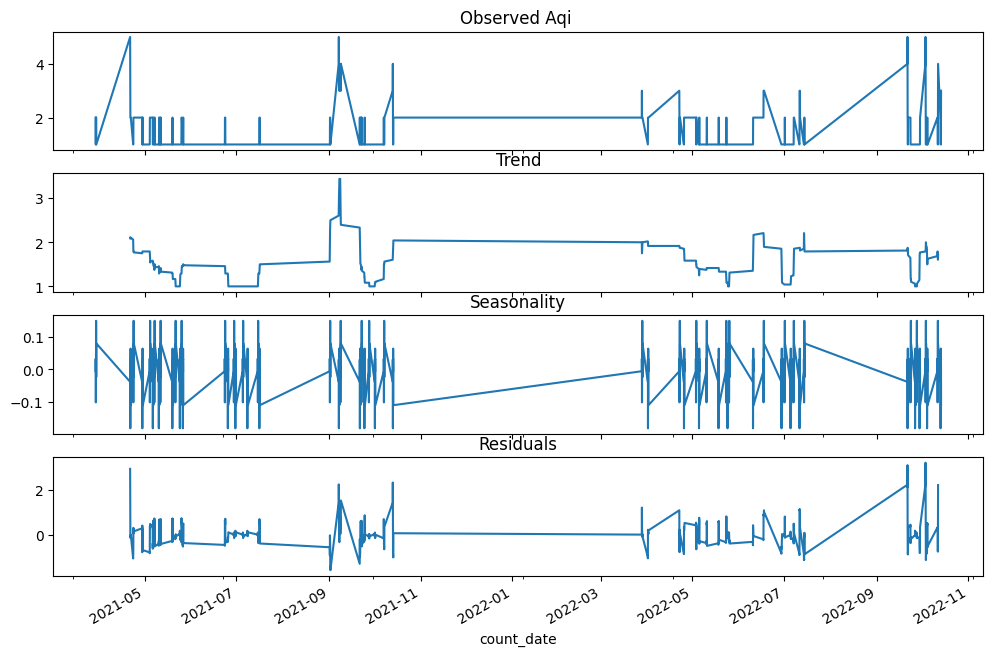

In [ ]:
# Decompose and plot each vehicle type
for col in emission_columns + air_quality_columns:
    # Perform seasonal decomposition
    decomposition = seasonal_decompose(eda_data[col], model='additive', period=24)

    # Plot the decomposed components
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    decomposition.observed.plot(ax=ax1, title=(f'Observed {col.capitalize()} '))
    decomposition.trend.plot(ax=ax2, title='Trend')
    decomposition.seasonal.plot(ax=ax3, title='Seasonality')
    decomposition.resid.plot(ax=ax4, title='Residuals')

The seasonal decomposition plots suggests the following key findings:

There are clear seasonal patterns, indicating that the emissions fluctuate within the year, potentially due to environmental or human factors that change with seasons.
The trend component shows variation over time with a notable increase towards the end, which may signal a recent surge in emissions or could be due to incomplete data.
Residuals indicate that there are additional factors or noise not explained by seasonality or trend..
Data gaps, likely representing missing months, may also affect the accuracy of trend and seasonal estimates and would be considered when interpreting results.


**Temporal Stationarity:** We need to explore our Time-series data to check if its stationary (ie If their statistical properties such as mean, variance, and autocorrelation are constant over time

In [ ]:
# Define a function to perform ADF test
def perform_adf_test(series):
    result = adfuller(series, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')

# Run ADF test for each vehicle type
for col in emission_columns + air_quality_columns + weather_columns:
    print(f'ADF Test for {col}:')
    perform_adf_test(eda_data[col].dropna())  # dropna() is used to remove missing values
    print('\n')

ADF Test for NOx_Petrol_Cars:
ADF Statistic: -6.05539711622589
p-value: 1.248694806243222e-07
Critical Values:
	1%: -3.439633170421852
	5%: -2.8656367026715337
	10%: -2.5689515744354794


ADF Test for NOx_Diesel_Cars:
ADF Statistic: -5.827606644840588
p-value: 4.0448029346197054e-07
Critical Values:
	1%: -3.439633170421852
	5%: -2.8656367026715337
	10%: -2.5689515744354794


ADF Test for NOx_Diesel_Buses:
ADF Statistic: -5.762331595092807
p-value: 5.634653442937597e-07
Critical Values:
	1%: -3.439646367660705
	5%: -2.8656425177031375
	10%: -2.5689546724554404


ADF Test for SO2_Diesel_Cars:
ADF Statistic: -6.024221249584739
p-value: 1.4690251603574412e-07
Critical Values:
	1%: -3.439633170421852
	5%: -2.8656367026715337
	10%: -2.5689515744354794


ADF Test for SO2_Petrol_Cars:
ADF Statistic: -6.0610589714091025
p-value: 1.2123165079819177e-07
Critical Values:
	1%: -3.439633170421852
	5%: -2.8656367026715337
	10%: -2.5689515744354794


ADF Test for SO2_Diesel_Buses:
ADF Statistic: -5.86

Analysis of the ADF Results:
On all variables the ADF statistic is more negative than the critical values at the 1%, 5%, and 10% levels. This indicates that we can reject the null hypothesis of a unit root for all these variables.
p-values: The p-values for all tests are below common significance levels (e.g., 0.05), which further confirms that the null hypothesis is rejected.
From these results  it seems that all the variables tested are stationary. This implies that their statistical characteristics, such as mean, variance, and autocorrelation, remain constant over time.

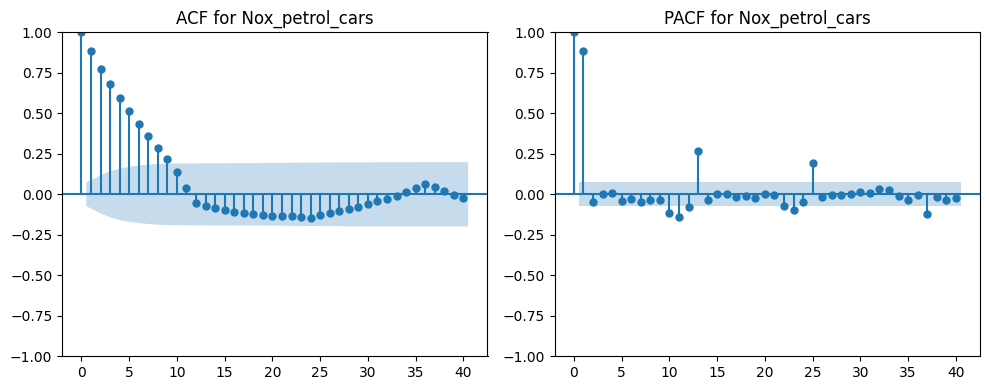

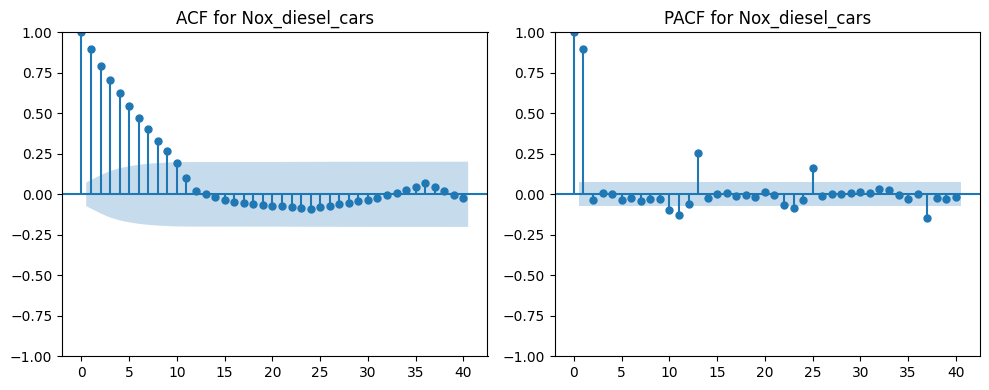

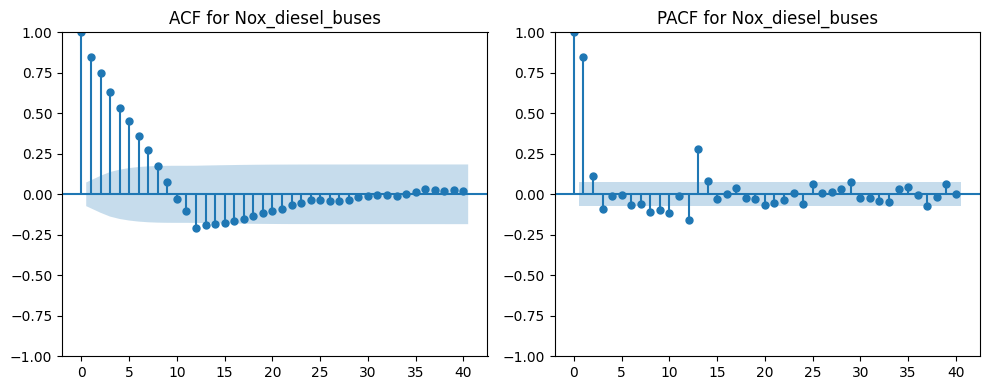

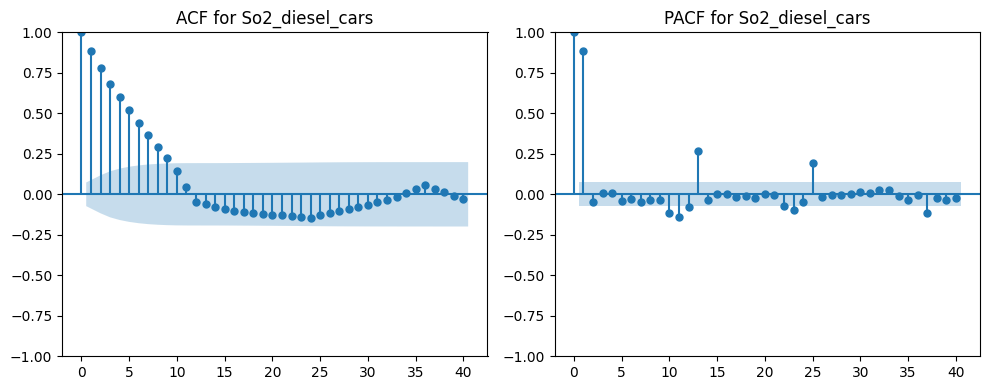

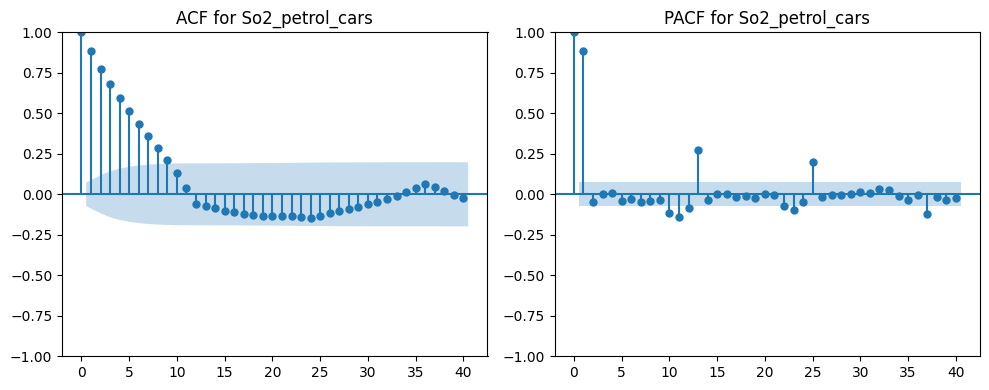

...

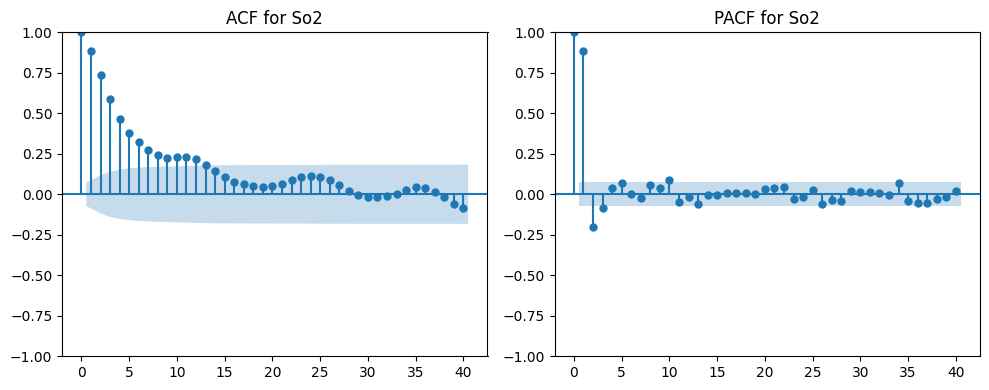

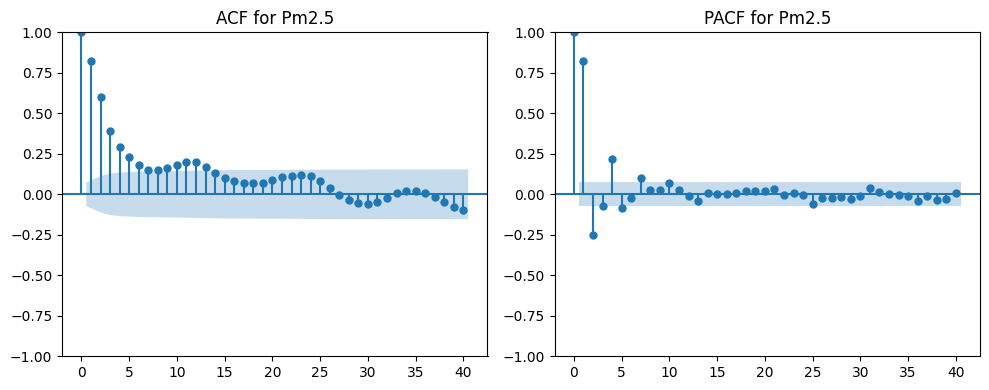

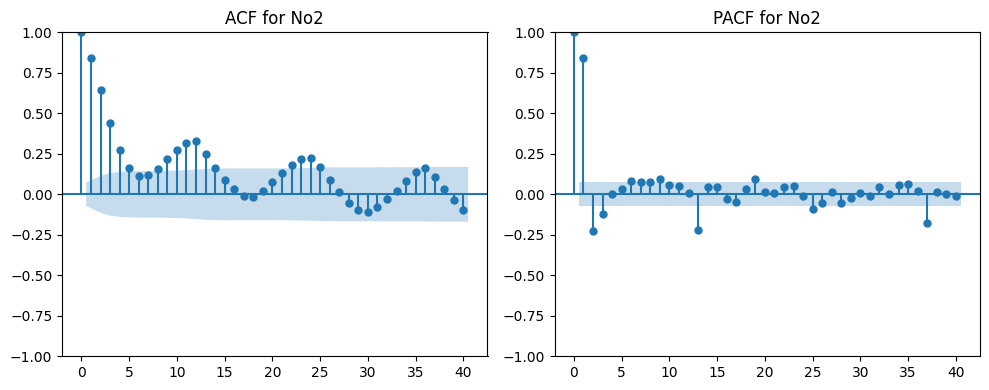

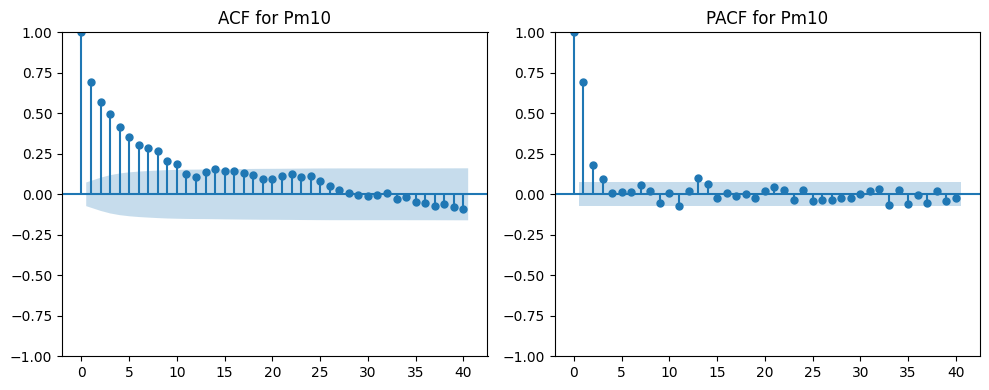

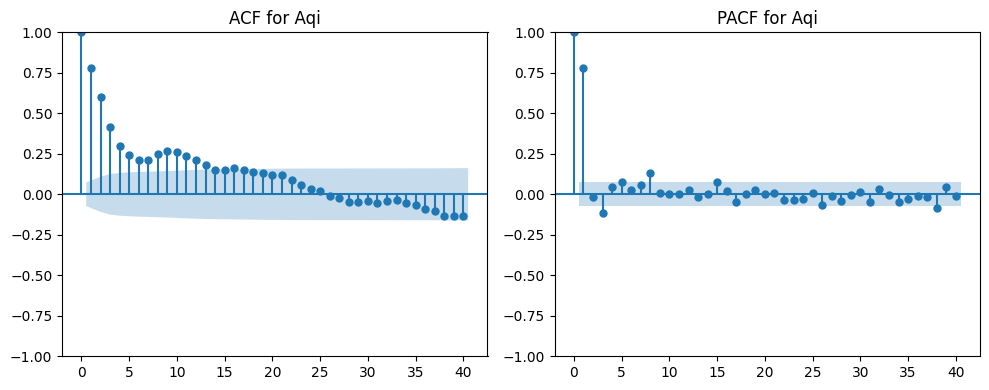

In [ ]:
# Plot ACF and PACF for each vehicle type
for col in emission_columns + air_quality_columns:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

    # Plot ACF
    plot_acf(eda_data[col], lags=40, ax=ax1)
    ax1.set_title(f'ACF for {col.capitalize()}')

    # Plot PACF
    plot_pacf(eda_data[col], lags=40, ax=ax2)
    ax2.set_title(f'PACF for {col.capitalize()}')

    plt.tight_layout()
    plt.show()

Most of the Autocorrelation Function and Partial Autocorrelation function plots for all the Vehicle emissions and Air Pollutants are similar. This suggests that  for the

 **ACF plots** there is a trend or a slow decay in correlation over time. The fact that the autocorrelation is strong and positive at the initial few lags indicates that the data has a high degree of serial correlation and is not random, meaning that past values have a long termt influence on future values.

 The **PACF plot** shows a significant spike at lag 1, which drops off sharply and becomes insignificant(although the confidence interval are almost invisible). This indicates that there is a short term and immediate correlation between a value and its immediate predecessor. The ACF plots for CO and NO2 exhibit repeating spikes, indicating a strong seasonal component in the data, however other variables exhibit weak seasonal component.
 Both plots do not exhibit repeating spikes,

**Anomaly Detection**: Next we would identify unusual spikes or drops in emissions and air quality, which might be due to external factors

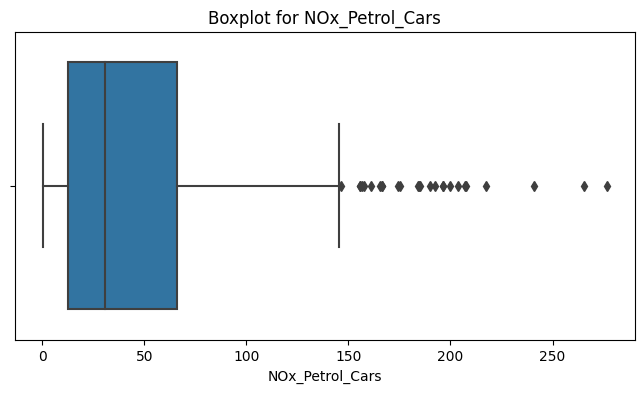

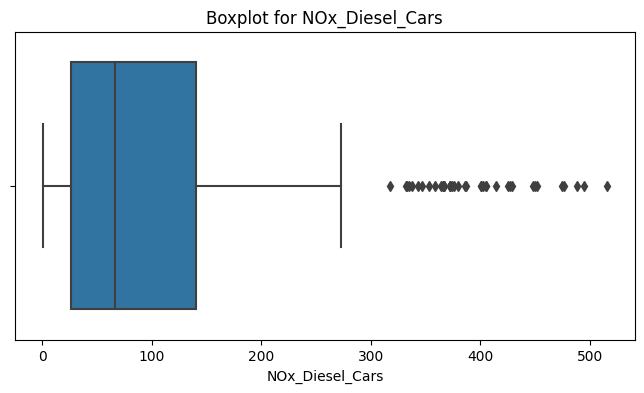

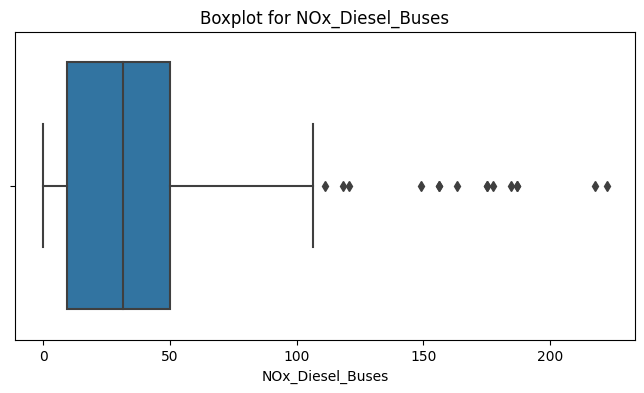

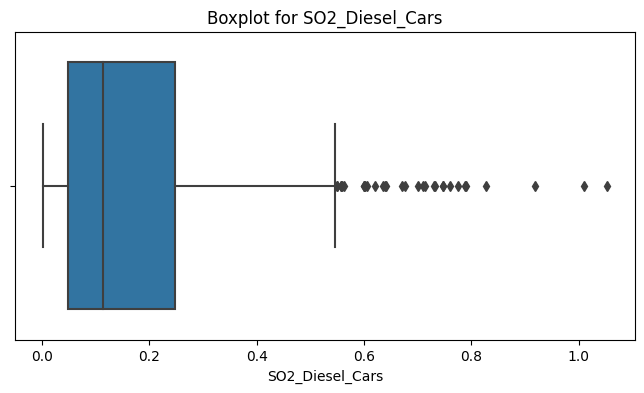

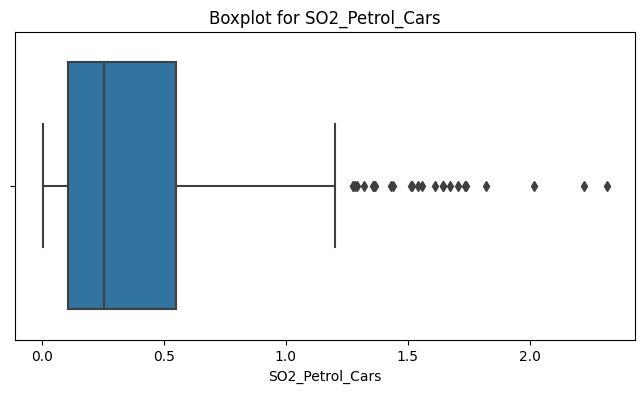

...

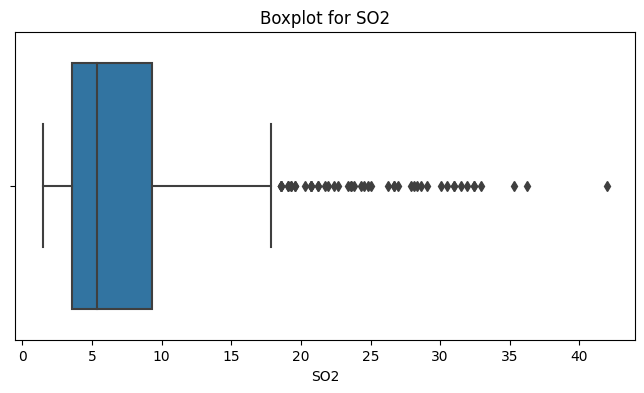

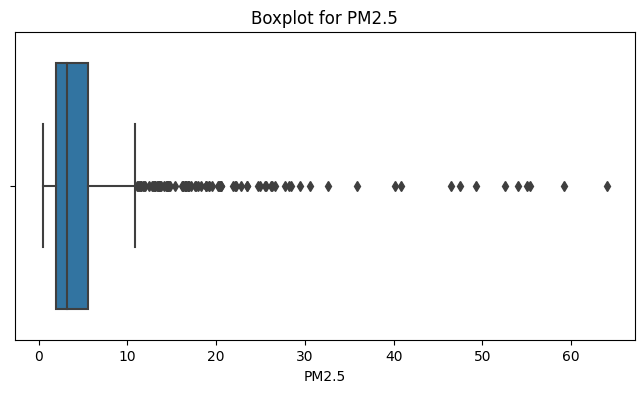

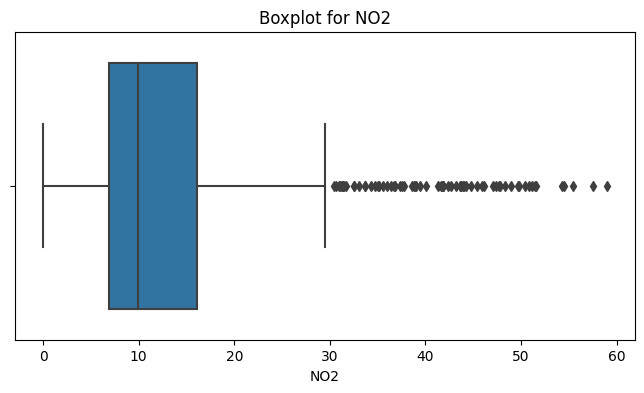

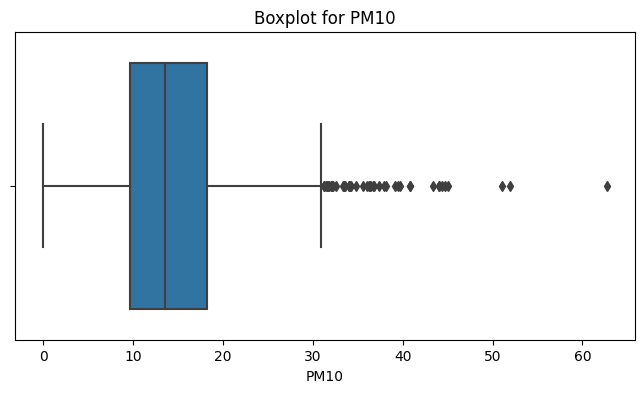

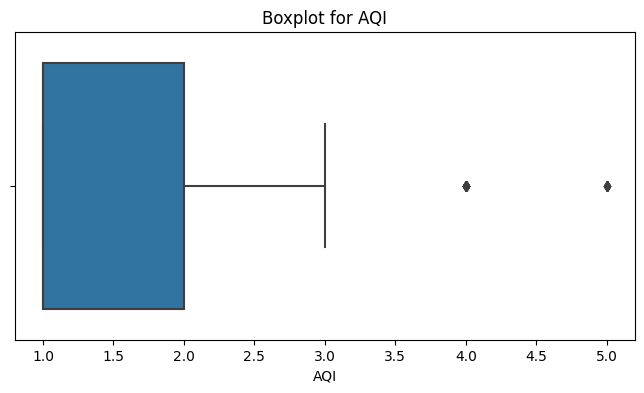

In [ ]:
for col in emission_columns + air_quality_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=eda_data[col])
    plt.title(f'Boxplot for {col}')
    plt.show()

The boxplots shows a right-skewed distribution, with varying median values and a long right tail with outliers, indicating occasional high emissions from the various vehicle fuel types. These outliers may point to extreme but important events or conditions that lead to elevated pollution levels.

**Results From EDA and Hypothesis found WRT answering Research Questions**

**RQ1 Findings:** Correlation between different vehicular fuel types and levels of key pollutants:


*   The histogram distribution plots showed varying levels of emissions from different types of vehicles, with some fuel types (like diesel) consistently showing higher emissions during peak hours.
*   The correlation heatmaps indicated strong positive correlations among pollutants from similar fuel types, suggesting that vehicles using the same fuel type emit pollutants in a similar pattern.
* Anomalies detected in the boxplots for specific pollutants could point to external factors influencing emissions or potential data quality issues. They could also suggest exceptional events or conditions that disproportionately affect emissions
* Despite the data gap, seasonal decomposition showed predictable patterns in emissions with higher emissions during certain seasons (summer), possibly due to temperature, fuel usage patterns, or other seasonal behaviors

**Hypotheses derived:**

1.   Diesel vehicles may contribute more significantly to certain pollutants compared to petrol vehicles.

**RQ2 Findings:** Modification of emissions impact by weather conditions:
The correlation plots between emissions, air quality indicators, and weather conditions showed some significant correlations, suggesting that weather conditions do indeed modify the impact of vehicular emissions on air quality.
For example, temperature and humidity might have inverse relationships with certain pollutants, while wind speed might disperse pollutants more effectively, reducing their concentration levels.

**Hypotheses derived:**

1. Higher temperatures, might be associated with higher levels of every other emission from other veh_fuel tyoes except for `diesel_buses`.
2. Increased humidity, wind speed, wind direction, rain might correlate with lower concentrations of pollutants due to dispersion.
3. There may be specific times of the year when vehicular pollution is more pronounced, which can be associated with either vehicular activity or atmospheric conditions that affect pollutant dispersion.




Overall, the EDA suggests that vehicle emissions have a significant impact on air quality, with clear patterns and occasional anomalies. Understanding these patterns and their relationship with meteorological conditions is crucial for predictive model.

**Hypothesis Testing**: To establish a more robust understanding of the relationships we would perform a further analysis using **regression analysis** and other statistical tests to determine the strength, direction, and significance of the association between these variable, validating our hypotheses.

In [ ]:
eda_df = eda_data.copy()

In [ ]:
eda_df

,Diesel_Cars,Petrol_Cars,Diesel_Buses_and_coaches,Petrol_Motorcycles,Diesel_Light_goods_vehicles,Petrol_Light_goods_vehicles,Diesel_Heavy_goods_vehicles,NOx_Diesel_Cars,NOx_Petrol_Cars,NOx_Diesel_Buses,...,wind_speed,wind_dir,rain_vol,AQI,CO,SO2,PM2.5,NO2,PM10,hour
count_date,,,,,,,,,,,,,,,,,,,,,
2021-03-29 07:00:00,340,996,11,29,537,24,145,168.777026,62.965846,23.182903,...,5.70,230,0.0,2,223.64,6.20,3.58,15.90476,16.0,7
2021-03-29 08:00:00,325,951,12,14,393,18,130,161.330980,60.121003,25.290440,...,5.70,230,0.0,1,223.64,6.56,3.58,19.36595,16.8,8
2021-03-29 09:00:00,260,761,10,15,366,16,131,129.064784,48.109446,21.075366,...,6.20,240,0.0,1,223.64,6.74,3.49,17.10236,17.0,9
2021-03-29 10:00:00,252,737,9,16,345,16,140,125.093560,46.592197,18.967830,...,6.70,240,0.0,1,220.30,6.80,3.36,12.88571,16.6,10
2021-03-29 11:00:00,266,778,7,15,311,14,145,132.043202,49.184165,14.752756,...,6.20,250,0.0,2,216.96,6.50,3.12,11.81024,16.1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-13 14:00:00,44,169,4,11,35,2,5,18.090773,10.020097,9.456270,...,1.54,60,0.0,1,196.93,9.66,3.04,15.72109,11.3,14
2022-10-13 15:00:00,60,230,1,4,28,1,6,24.669236,13.636819,2.364068,...,1.54,60,0.0,1,200.27,11.80,3.16,20.48846,14.6,15
2022-10-13 16:00:00,59,224,2,8,38,2,2,24.258082,13.281076,4.728135,...,1.54,320,0.0,2,273.70,17.17,6.68,31.23385,15.5,16


In [ ]:

eda_df.columns = [col.replace('.', '_') for col in eda_df.columns]


In [ ]:
eda_df.duplicated().any()

False

In [ ]:
#predictors
X = eda_df[['NOx_Diesel_Cars','NOx_Petrol_Cars','NOx_Diesel_Buses','NOx_Petrol_Motorcycles', 'NOx_Diesel_LGVs','NOx_Petrol_LGVs',
        'NOx_Diesel_HGVs','SO2_Diesel_Cars','SO2_Petrol_Cars','SO2_Diesel_Buses','SO2_Petrol_Motorcycles','SO2_Diesel_LGVs','SO2_Petrol_LGVs',
        'SO2_Diesel_HGVs','CO_Diesel_Cars','CO_Petrol_Cars','CO_Diesel_Buses','CO_Petrol_Motorcycles','CO_Diesel_LGVs','CO_Petrol_LGVs',
        'CO_Diesel_HGVs','PM10_Diesel_Cars', 'PM10_Petrol_Cars', 'PM10_Diesel_Buses', 'PM10_Petrol_Motorcycles', 'PM10_Diesel_LGVs', 'PM10_Petrol_LGVs',
        'PM10_Diesel_HGVs', 'PM2_5_Diesel_Cars', 'PM2_5_Petrol_Cars', 'PM2_5_Diesel_Buses', 'PM2_5_Petrol_Motorcycles', 'PM2_5_Diesel_LGVs',
        'PM2_5_Petrol_LGVs', 'PM2_5_Diesel_HGVs', 'temperature', 'pressure', 'humidity', 'wind_speed', 'wind_dir','rain_vol']]
#target
y = eda_df[['NO2']] #,'CO','PM2_5','NO2','PM10','SO2'


In [ ]:
y.head()

,NO2
count_date,
2021-03-29 07:00:00,15.90476
2021-03-29 08:00:00,19.36595
2021-03-29 09:00:00,17.10236
2021-03-29 10:00:00,12.88571
2021-03-29 11:00:00,11.81024


In [ ]:
#Perform OLS regression
X = sm.add_constant(X)

# Create the model
model = sm.OLS(y, X)

# Fit the model
result = model.fit()

# Print the summary
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                    NO2   R-squared:                       0.433
Model:                            OLS   Adj. R-squared:                  0.417
Method:                 Least Squares   F-statistic:                     26.68
Date:                Sun, 14 Jan 2024   Prob (F-statistic):           1.06e-72
Time:                        11:33:29   Log-Likelihood:                -2539.5
No. Observations:                 720   AIC:                             5121.
Df Residuals:                     699   BIC:                             5217.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

**According to the OLS regression results:**

**CO (Carbon Monoxide):** The model explains approximately 31.8% of the variability in CO levels, with a significant overall fit (F-statistic: 16.31). The coefficients (coef column) indicate the change in the dependent variable for a one-unit change in the predictor, all else being equal. For instance, a one-unit increase in NOx_Diesel_Cars leads to an increase of about 70.29 in CO levels. Also, several variables(mostly car vehicle types) have significant p-values (less than 0.05), meaning that the coef are statistically significant, infering that all fuel types of cars have an impact on CO levels. Temperature and wind speed possess high p-values but negative coef suggesting that the CO will  decrease for a one-unit increase in these weather variables.

---
**SO2(Sulfur Dioxide):** The OLS regression for SO2 shows an R-squared of 0.376, indicating that about 37.6% of the variation in SO2 levels is explained by the model. The observed slight strength from the positive coef and the values of the p-value indicate that Emissions from mostly Diesel vehicles have the most influence on SO2 levels. For instance for every one-unit increase in NOx_Diesel_LGVs there's a 2.2984 increase in SO2 levels.Wind speed and Rain emerges as a significant factor, although they have negative coefficients, they underscore the role of weather in dispersing or concentrating SO2.

---
**NO2(Nitrogen Dioxide):**
The OLS regression for NO2 shows a relatively stronger model fit with an R-squared of 0.433, indicating that approximately 43.3% of the variability in NO2 levels is explained by the predictors in the model. From the positive coefficients, predictors with statistically significant p-values highlight most diesel vehicle types to have more impact on the levels of NO2 in the air. For instance for every one-unit increase in SO2_Diesel_LGVs there's a 7.0207  increase in NO2 levels in the air. Same goes for Wind speed, temperature, and pressure, highlighting their role in NO2 dispersion.

---
**PM10 (Particulate Matter less than 10 microns):** For PM10 the regression analysis demonstrates some degree of explanatory power, with an R-squared of 0.229, indicating that approximately 22.9% of the variance in PM10 levels is accounted for by the model. The analysis reveals several significant predictors, such as NOx_Diesel_Cars, SO2_Diesel_Cars, and PM10_Diesel_Cars, which suggest a notable association between these emissions from diesel vehicles and PM10 levels. Weather variables like temperature, pressure, and wind_speed , similar to PM2.5, emerge as significant factors, reflecting the influence of meteorological conditions on PM10 concentrations.


---
**PM2_5(Particulate Matter less than 2.5 microns):** The regression analysis for PM2.5 shows a model fit with an R-squared of 0.195, indicating that about 19.5% of the variability in PM2.5 levels can be explained by the model's predictors. Key variables like NOx_Diesel_Cars and SO2_Diesel_Cars are statistically significant, suggesting a link between these emissions and PM2.5 levels. Wind_speed and wind_dir also appear as significant predictors, indicating the influence of weather conditions on PM2.5 concentrations.

**Hypothesis Validation:** The results from the regression analysis validates our derived hypothesis from the correlation analysis



The analyses, while informative, are constrained by multicollinearity issues. Also, the presence of high skewness and kurtosis suggests non-normality in residuals, suggesting the need for more nuanced statistical test to validate our findings. In the next line of code we would be performing a **Granger's Causality Test** to statistically explore the relationships further.




In [ ]:
# Function to perform Granger's causality test
def grangers_causality_test(dataframe, x, y, maxlag=6):
    test_result = grangercausalitytests(dataframe[[x, y]], maxlag=maxlag, verbose=False)
    p_values = [round(test_result[i+1][0]['ssr_ftest'][1], 6) for i in range(maxlag)]
    return p_values

# List of pollutants and vehicle emissions
pollutants = ['NO2', 'SO2', 'CO', 'PM10', 'PM2_5']

emission_types = ['NOx_Diesel_Cars','NOx_Petrol_Cars','NOx_Diesel_Buses','NOx_Petrol_Motorcycles', 'NOx_Diesel_LGVs','NOx_Petrol_LGVs',
        'NOx_Diesel_HGVs','SO2_Diesel_Cars','SO2_Petrol_Cars','SO2_Diesel_Buses','SO2_Petrol_Motorcycles','SO2_Diesel_LGVs','SO2_Petrol_LGVs',
        'SO2_Diesel_HGVs','CO_Diesel_Cars','CO_Petrol_Cars','CO_Diesel_Buses','CO_Petrol_Motorcycles','CO_Diesel_LGVs','CO_Petrol_LGVs',
        'CO_Diesel_HGVs','PM10_Diesel_Cars', 'PM10_Petrol_Cars', 'PM10_Diesel_Buses', 'PM10_Petrol_Motorcycles', 'PM10_Diesel_LGVs', 'PM10_Petrol_LGVs',
        'PM10_Diesel_HGVs', 'PM2_5_Diesel_Cars', 'PM2_5_Petrol_Cars', 'PM2_5_Diesel_Buses', 'PM2_5_Petrol_Motorcycles', 'PM2_5_Diesel_LGVs',
        'PM2_5_Petrol_LGVs', 'PM2_5_Diesel_HGVs', 'temperature', 'pressure', 'humidity', 'wind_speed', 'wind_dir','rain_vol']

# Creating a DataFrame to store the results
results_df = pd.DataFrame(columns=['Emission_Type', 'Pollutant', 'Lag_1_p', 'Lag_2_p', 'Lag_3_p', 'Lag_4_p', 'Lag_5_p', 'Lag_6_p']) #Decided from the ACF & PACF plots

# Loop through each emission type and pollutant pair and perform tests
for emission_type in emission_types:
    for pollutant in pollutants:
        p_values = grangers_causality_test(eda_df, emission_type, pollutant)
        results_df = results_df.append({
            'Emission_Type': emission_type,
            'Pollutant': pollutant,
            'Lag_1_p': p_values[0],
            'Lag_2_p': p_values[1],
            'Lag_3_p': p_values[2],
            'Lag_4_p': p_values[3],
            'Lag_5_p': p_values[4],
            'Lag_6_p': p_values[5]
        }, ignore_index=True)

# Set the display options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
# Display the results
results_df


,Emission_Type,Pollutant,Lag_1_p,Lag_2_p,Lag_3_p,Lag_4_p,Lag_5_p,Lag_6_p
0,NOx_Diesel_Cars,NO2,0.347645,0.679124,0.806614,0.705516,0.785132,0.750464
1,NOx_Diesel_Cars,SO2,0.448767,0.677643,0.767219,0.840700,0.856450,0.895012
2,NOx_Diesel_Cars,CO,0.252355,0.558889,0.702089,0.838688,0.918957,0.944705
3,NOx_Diesel_Cars,PM10,0.617699,0.672532,0.239680,0.309785,0.363987,0.463527
4,NOx_Diesel_Cars,PM2_5,0.846397,0.957457,0.515937,0.603878,0.715916,0.764720
5,NOx_Petrol_Cars,NO2,0.340818,0.676074,0.806024,0.725050,0.809170,0.769399
6,NOx_Petrol_Cars,SO2,0.489149,0.720934,0.792516,0.841808,0.857573,0.898093
7,NOx_Petrol_Cars,CO,0.206143,0.502798,0.654986,0.794760,0.893115,0.921791
8,NOx_Petrol_Cars,PM10,0.589128,0.654319,0.295746,0.381516,0.415709,0.501642
9,NOx_Petrol_Cars,PM2_5,0.968038,0.980215,0.588093,0.674113,0.779354,0.798157


**According to the Granger's Causality Test:**
The p-value readings of
NOx, CO, SO2, PM10 and PM2.5 emissions for all fuel types from Cars, Buses and LGVs showed no significant impact on all pollutants levels, However emissions from `Petrol_Motorcyles` and `Diesel_HGVs` had p-values ranging from  0.009 - 0.03 at lower lags for NO2 pollutants meaning that there is a short-term statistically significant Granger's causality of emissions from these vehicles on NO2 levels in the air. This also shows  potential predictive relationships. `Petrol_Motorcyles` also seemed to show significant causality on PM10 but at higher lags meaning that the impact may not be immediate but its effects perists for long.

Weather conditions such as `temperature`, `wind_speed`and `wind_dir` had p-values ranging from 0.0001 - 0.03 for all pollutants at lower lags indicating that these weather conditions have statistically significant granger-cause on these pollutant levels.

### **MODELLING**

In [ ]:
#model_df = pd.read_csv('/content/drive/MyDrive/Data/THESIS/Model_Data.csv', index_col='count_date') #load final_data df

model_df = final_data.copy()

In [ ]:
model_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 720 entries, 2021-03-29 07:00:00 to 2022-10-13 18:00:00
Data columns (total 54 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Diesel_Cars                  720 non-null    int64  
 1   Petrol_Cars                  720 non-null    int64  
 2   Diesel_Buses_and_coaches     720 non-null    int64  
 3   Petrol_Motorcycles           720 non-null    int64  
 4   Diesel_Light_goods_vehicles  720 non-null    int64  
 5   Petrol_Light_goods_vehicles  720 non-null    int64  
 6   Diesel_Heavy_goods_vehicles  720 non-null    int64  
 7   NOx_Diesel_Cars              720 non-null    float64
 8   NOx_Petrol_Cars              720 non-null    float64
 9   NOx_Diesel_Buses             720 non-null    float64
 10  NOx_Petrol_Motorcycles       720 non-null    float64
 11  NOx_Diesel_LGVs              720 non-null    float64
 12  NOx_Petrol_LGVs              720 non-null

In [ ]:
#convert index to datetime
model_df.index = pd.to_datetime(model_df.index)


In the next line of code We would include datetime features such as hour of the day, day of the week, month, and year to provide  machine learning models with valuable context that could improve their predictive accuracy

In [ ]:
# Reset the index so 'count_date' becomes a column
model_df.reset_index(inplace=True)

# Extract datetime features
model_df['year'] = model_df['count_date'].dt.year
model_df['month'] = model_df['count_date'].dt.month
model_df['day'] = model_df['count_date'].dt.day #due to inconsistency
model_df['weekday'] = model_df['count_date'].dt.weekday  # Monday=0, Sunday=6
model_df['hour'] = model_df['count_date'].dt.hour

#drop the original 'count_date'
model_df.drop(columns=['count_date'], inplace=True)

In [ ]:
model_df.columns = [col.replace('.', '_') for col in model_df.columns]

In [ ]:
# Set the display options
pd.set_option('display.max_rows', None)  # or use a specific large number instead of None
pd.set_option('display.max_columns', None)
model_df

In the next line of code we would explore several models that are suitable for the nature of our data(multicollinearity, non-normality of residual, non-linear patterm, temporal) and compare them against the baselines.

**Baseline**

---
*   **Ridge Regression:** This regularization model is particularly useful when dealing with  a large number of predictors and handles multicollinearity well by distributing the effect among correlated variables.
*  **Decision Trees Regressor:** Decision trees are capable of modeling complex, non-linear relationships, handle multicollinearity and are relatively easy to understand and interpret.

Since the data range is very large and they are not scaled equally, let us use MinMaxScaler to scale the data first in order to prevent prediction mistakes.

In [ ]:
model_df.columns.to_list()

In [ ]:
#Selecting predictors (X) and multiple target variables (y)
predictors = ['NOx_Diesel_Cars','NOx_Petrol_Cars','NOx_Diesel_Buses','NOx_Petrol_Motorcycles', 'NOx_Diesel_LGVs','NOx_Petrol_LGVs',
        'NOx_Diesel_HGVs','SO2_Diesel_Cars','SO2_Petrol_Cars','SO2_Diesel_Buses','SO2_Petrol_Motorcycles','SO2_Diesel_LGVs','SO2_Petrol_LGVs',
        'SO2_Diesel_HGVs','CO_Diesel_Cars','CO_Petrol_Cars','CO_Diesel_Buses','CO_Petrol_Motorcycles','CO_Diesel_LGVs','CO_Petrol_LGVs',
        'CO_Diesel_HGVs','PM10_Diesel_Cars', 'PM10_Petrol_Cars', 'PM10_Diesel_Buses', 'PM10_Petrol_Motorcycles', 'PM10_Diesel_LGVs', 'PM10_Petrol_LGVs',
        'PM10_Diesel_HGVs', 'PM2_5_Diesel_Cars', 'PM2_5_Petrol_Cars', 'PM2_5_Diesel_Buses', 'PM2_5_Petrol_Motorcycles', 'PM2_5_Diesel_LGVs',
        'PM2_5_Petrol_LGVs', 'PM2_5_Diesel_HGVs', 'temperature', 'pressure', 'humidity', 'wind_speed', 'wind_dir','rain_vol', 'year',
        'month', 'weekday','day', 'hour']

targets = ['NO2', 'CO', 'SO2', 'PM10', 'PM2_5']
X = model_df[predictors]
y = model_df[targets]

# scale the features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
split_point = int(len(X_scaled) * 0.8)
X_train, X_test = X_scaled[:split_point], X_scaled[split_point:]
y_train, y_test = y.iloc[:split_point], y.iloc[split_point:]

**Ridge Regression**

In [ ]:
# Fit the Ridge model on the training data
model = Ridge()
model.fit(X_train, y_train)

# Predict and evaluate the model
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
mse_train = mean_squared_error(y_train, y_train_pred, multioutput='raw_values')
mse_test = mean_squared_error(y_test, y_test_pred, multioutput='raw_values')

#Calculate Median Absolute Error for each target
medae_train = median_absolute_error(y_train, y_train_pred, multioutput='raw_values')
medae_test = median_absolute_error(y_test, y_test_pred, multioutput='raw_values')

# Calculate R2 score for each target
R2_scores_train = [r2_score(y_train.iloc[:, i], y_train_pred[:, i]) for i in range(y_train.shape[1])]
R2_scores_test = [r2_score(y_test.iloc[:, i], y_test_pred[:, i]) for i in range(y_test.shape[1])]

print(f"Train MSE for each target: {mse_train}")
print(f"Test MSE for each target: {mse_test}")

print(f"Train MEDAE for each target: {medae_train}")
print(f"Test MEDAE for each target: {medae_test}")

print(f"Train R2 Score: {R2_scores_train}")
print(f"Test R2 Score: {R2_scores_test}")

Train MSE for each target: [  55.492364   2765.21182951   16.44303515   51.86415511   35.14417094]
Test MSE for each target: [  150.226917   17093.61595351    68.46578102    54.15073342
    92.84742851]
Train MEDAE for each target: [ 4.19661834 27.11224169  2.19777554  3.73465478  2.62182875]
Test MEDAE for each target: [  4.7214005  105.48709292   3.48698803   4.93732508   3.61390741]
Train R2 Score: [0.41540095880259253, 0.4228994005072776, 0.3842266159665858, 0.2841477898096304, 0.3067253224995834]
Test R2 Score: [0.25367316323863975, -0.04915396782497261, 0.08719648468322894, 0.01577701731521408, 0.12069194782393988]


The Ridge regression baseline model shows reasonable performance on the MSE, MEDAE and R&sup2; scores for some pollutants (NO2, SO2, PM10, PM2_5), its performance on CO is notably worse, especially in the test set. It's possible that the issue could be attributed to overfitting, the complexity of the model, the adequacy of the training data or that Ridge regression assumes a linear relationship between predictors and the target variable.

**Decision Tree Regressor**

In [ ]:
# Initialize the Decision Tree Regressor
dt_model = DecisionTreeRegressor(max_depth=15, min_samples_split=10, min_samples_leaf=5, max_leaf_nodes=20)

# Fit the model
dt_model.fit(X_train, y_train)

# Make predictions
dt_y_train_pred = dt_model.predict(X_train)
dt_y_test_pred = dt_model.predict(X_test)

#Calculate Mean Squared Error for each target
mse_train = mean_squared_error(y_train, dt_y_train_pred, multioutput='raw_values')
mse_test = mean_squared_error(y_test, dt_y_test_pred, multioutput='raw_values')

#Calculate Median Absolute Error for each target
medae_train = median_absolute_error(y_train, dt_y_train_pred, multioutput='raw_values')
medae_test = median_absolute_error(y_test, dt_y_test_pred, multioutput='raw_values')

# Calculate R2 score for each target
R2_scores_train = [r2_score(y_train.iloc[:, i], dt_y_train_pred[:, i]) for i in range(y_train.shape[1])]
R2_scores_test = [r2_score(y_test.iloc[:, i], dt_y_test_pred[:, i]) for i in range(y_test.shape[1])]

print(f"Train MSE for each target: {mse_train}")
print(f"Test MSE for each target: {mse_test}")

print(f"Train MEDAE for each target: {medae_train}")
print(f"Test MEDAE for each target: {medae_test}")

print(f"Train R2 Score: {R2_scores_train}")
print(f"Test R2 Score: {R2_scores_test}")

Train MSE for each target: [ 36.37312618 413.07225976   9.5289702   42.51620948  21.03553597]
Test MSE for each target: [  109.66481772 14510.39191776    54.13628431    60.09858373
    84.13350578]
Train MEDAE for each target: [3.45443673 8.85151099 1.79796474 3.33892774 1.27622378]
Test MEDAE for each target: [ 5.34474826 88.26419048  2.66954212  4.45641026  1.92576465]
Train R2 Score: [0.6168176455327381, 0.9137916863378825, 0.6431506610010377, 0.41317230641391955, 0.585040590711596]
Test R2 Score: [0.4551855409749168, 0.10939643802590326, 0.2782410441253723, -0.09232883100113565, 0.20321682266143104]


The decision tree performs slightly better than the linear ridge model confirming that there are non-linear relationship in our datasets.The training sets have lower MSE and MEDAE scores as compared to the test sets. However, the R2 scores for most of the targets like`PM10`, `CO`, `PM2.5` on the test sets, when compared to the training sets, indicate that the model is not performing well on unseen data. This suggests that the variability of the target variables is difficult to explain, and the model is struggling to generalize well on new data.

**Machine Learning Models**

**RANDOM FOREST REGRESSOR**: This ensemble method can handle non-linearity and do not require the residuals to be normally distributed. They are also robust to multicollinearity. Moreover its ability to perform feature importance can also offer some level of interpretability in terms of the relative importance of different predictors.


In [ ]:
#Usign time-based split to divide data into tuning and validation sets
split_point = int(len(X) * 0.8)
X_tuning, X_val = X[:split_point], X[split_point:]
y_tuning, y_val = y.iloc[:split_point], y.iloc[split_point:]

# Further time-based split of tuning set for hyperparameter tuning
split_point_tuning = int(len(X_tuning) * 0.75)
X_train, X_test = X_tuning[:split_point_tuning], X_tuning[split_point_tuning:]
y_train, y_test = y_tuning[:split_point_tuning], y_tuning[split_point_tuning:]




Feature Selection

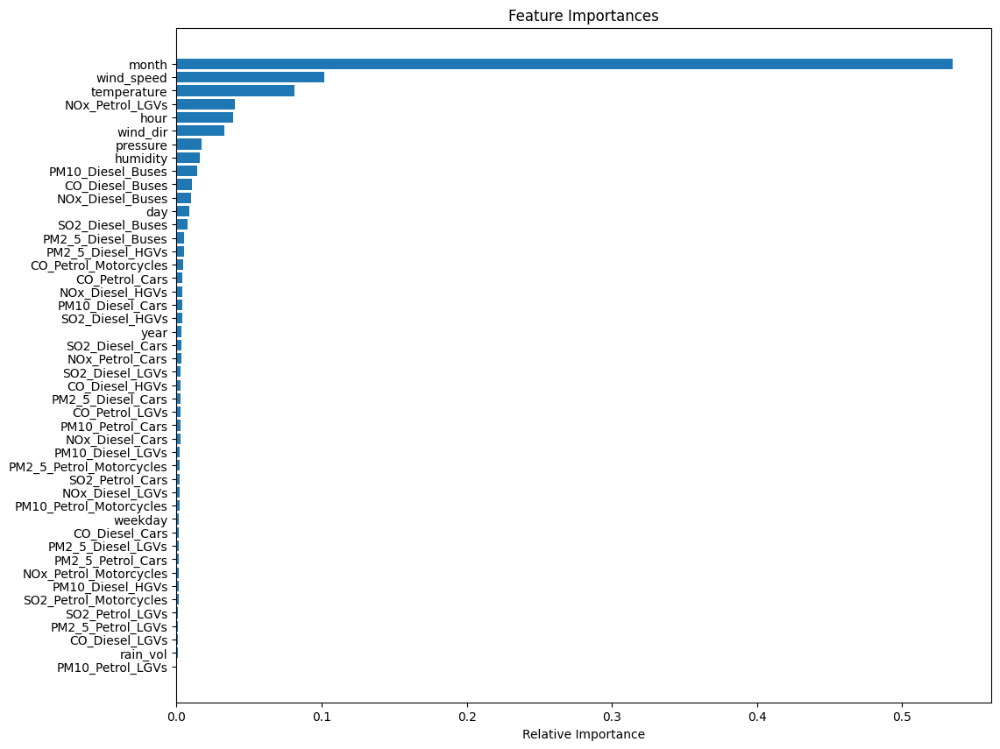

In [ ]:
#Feature Selection to determine the most relevant features first
# Preliminary Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_

# Visualize feature importances
indices = np.argsort(importances)
plt.figure(figsize=(12, 10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [predictors[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
# Select a threshold for feature selection using median importance
threshold = np.median(importances)

# Select features above the threshold
selected_features = [feature for feature, importance in zip(predictors, importances) if importance > threshold]
selected_features

['NOx_Petrol_Cars',
 'NOx_Diesel_Buses',
 'NOx_Petrol_LGVs',
 'NOx_Diesel_HGVs',
 'SO2_Diesel_Cars',
 'SO2_Diesel_Buses',
 'SO2_Diesel_HGVs',
 'CO_Petrol_Cars',
 'CO_Diesel_Buses',
 'CO_Petrol_Motorcycles',
 'PM10_Diesel_Cars',
 'PM10_Diesel_Buses',
 'PM2_5_Diesel_Buses',
 'PM2_5_Diesel_HGVs',
 'temperature',
 'pressure',
 'humidity',
 'wind_speed',
 'wind_dir',
 'year',
 'month',
 'day',
 'hour']

From observing the visualization of feature importances and setting a threshold using the median importance(statistical approach), both methods resulted in selecting the same features meaning that they contribute significantly to impacting the performance of the model. Note that amongs these features are mostly `Diesel_Buses` and weather variables including `temperature`, `wind_speed`, `pressure`, `humidity` and `wind_direction`

In [ ]:
# Apply selected features to the datasets
X_selected = X[selected_features]

# scale the features
scaler = MinMaxScaler()
X_selected_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y)

# Convert y_scaled back to DataFrame if needed
y_scaled_df = pd.DataFrame(y_scaled, columns=y.columns)

# Now perform the split
split_point = int(len(X_selected_scaled) * 0.8)
X_tuning, X_val = X_selected_scaled[:split_point], X_selected_scaled[split_point:]
y_tuning, y_val = y_scaled_df[:split_point], y_scaled_df[split_point:]

# Further time-based split of tuning set for hyperparameter tuning
split_point_tuning = int(len(X_tuning) * 0.75)
X_train, X_test = X_tuning[:split_point_tuning], X_tuning[split_point_tuning:]
y_train, y_test = y_tuning[:split_point_tuning], y_tuning[split_point_tuning:]


In [ ]:
X_selected

RF Model Training & Hyperparameter tuning using GridSearchCV

In [ ]:
# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=10, random_state=42)
rf.fit(X_train, y_train)

# Predict on the training and test sets
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Calculate R2, MSE, and MedAE scores for each target on training and test sets
for i, target in enumerate(targets):
    r2_train = r2_score(y_train.iloc[:, i], y_train_pred[:, i])
    mse_train = mean_squared_error(y_train.iloc[:, i], y_train_pred[:, i])
    medae_train = median_absolute_error(y_train.iloc[:, i], y_train_pred[:, i])
    r2_test = r2_score(y_test.iloc[:, i], y_test_pred[:, i])
    mse_test = mean_squared_error(y_test.iloc[:, i], y_test_pred[:, i])
    medae_test = median_absolute_error(y_test.iloc[:, i], y_test_pred[:, i])

    print(f"Target: {target}")
    print(f"  Train R2: {r2_train:.3f}, Train MSE: {mse_train:.3f}, Train MedAE: {medae_train:.3f}")
    print(f"  Test R2: {r2_test:.3f}, Test MSE: {mse_test:.3f}, Test MedAE: {medae_test:.3f}\n")


Target: NO2
  Train R2: 0.950, Train MSE: 0.002, Train MedAE: 0.013
  Test R2: -0.782, Test MSE: 0.010, Test MedAE: 0.039

Target: CO
  Train R2: 0.959, Train MSE: 0.000, Train MedAE: 0.003
  Test R2: -2.229, Test MSE: 0.003, Test MedAE: 0.018

Target: SO2
  Train R2: 0.956, Train MSE: 0.001, Train MedAE: 0.007
  Test R2: -0.220, Test MSE: 0.006, Test MedAE: 0.038

Target: PM10
  Train R2: 0.897, Train MSE: 0.002, Train MedAE: 0.015
  Test R2: -0.190, Test MSE: 0.015, Test MedAE: 0.068

Target: PM2_5
  Train R2: 0.908, Train MSE: 0.001, Train MedAE: 0.003
  Test R2: -0.207, Test MSE: 0.005, Test MedAE: 0.022



The results with and without scaling show a similar pattern of overfitting. The high R² ranging from (0.91 to 0.97)on the training set, indicates that the model explains a large proportion of the variance in the target variables, but a low or negative R² on the test set for most targets asides CO (0.639) suggests a lower model performance.The MSE and MEDAE are low on the training set compared to the test for all targets indicating that the model performs well on the training data but poorly on unseen data.


---
In the next line of code we would tune our model to find the best hyperparameters


HYPERPARAMETER TUNING

In [ ]:
# Define the parameter grid
param_grid = {
    'n_estimators': [5, 10, 15, 20, 30],
    'max_depth': [10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'max_features': [2, 3],
    'min_samples_leaf': [1, 2, 4],
    }

# TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# GridSearchCV with TimeSeriesSplit
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring='neg_median_absolute_error', )

# Fit GridSearchCV using only the training data
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")


Best parameters: {'max_depth': 10, 'max_features': 3, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 5}


MODEL EVALUATION

In [ ]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    mse_scores = [mean_squared_error(test_labels.iloc[:, i], predictions[:, i]) for i in range(test_labels.shape[1])]
    medae_scores = [median_absolute_error(test_labels.iloc[:, i], predictions[:, i]) for i in range(test_labels.shape[1])]
    r2_scores = [r2_score(test_labels.iloc[:, i], predictions[:, i]) for i in range(test_labels.shape[1])]

    print('Model Performance')
    for i, target in enumerate(test_labels.columns):
        print(f"Target: {target}")
        print(f"  MSE: {mse_scores[i]:.4f}")
        print(f"  MedAE: {medae_scores[i]:.4f}")
        print(f"  R2: {r2_scores[i]:.4f}\n")

    return mse_scores, medae_scores, r2_scores

# Evaluate the base model
base_model = RandomForestRegressor(n_estimators=100, random_state=42)
base_model.fit(X_train, y_train)
print("Base Model Evaluation:")
base_model_mse, base_model_medae, base_model_r2 = evaluate(base_model, X_test, y_test)

# Evaluate the best model from GridSearch
best_rf = RandomForestRegressor(**best_params, random_state=42)
best_rf.fit(X_train, y_train)
print("\nBest GridSearch Model Evaluation:")
best_grid_mse, best_grid_medae, best_grid_r2 = evaluate(best_rf, X_test, y_test)



Base Model Evaluation:
Model Performance
Target: NO2
  MSE: 0.0099
  MedAE: 0.0375
  R2: -0.7366

Target: CO
  MSE: 0.0027
  MedAE: 0.0188
  R2: -2.0071

Target: SO2
  MSE: 0.0062
  MedAE: 0.0351
  R2: -0.1939

Target: PM10
  MSE: 0.0135
  MedAE: 0.0643
  R2: -0.0507

Target: PM2_5
  MSE: 0.0045
  MedAE: 0.0242
  R2: -0.0425


Best GridSearch Model Evaluation:
Model Performance
Target: NO2
  MSE: 0.0180
  MedAE: 0.0996
  R2: -2.1589

Target: CO
  MSE: 0.0065
  MedAE: 0.0584
  R2: -6.1347

Target: SO2
  MSE: 0.0089
  MedAE: 0.0440
  R2: -0.7206

Target: PM10
  MSE: 0.0181
  MedAE: 0.0876
  R2: -0.4096

Target: PM2_5
  MSE: 0.0064
  MedAE: 0.0458
  R2: -0.4865



The models generated from GridSearch are performing considerably worse than the base models. Most of the targets are showing negative R² scores, which indicates that there are issues with model fit. The significantly higher values of Mean Squared Error (MSE) and Median Absolute Error (MEDAE) in the gridsearch suggest a severe overfitting problem.

FINAL MODEL VALIDATION

In [ ]:
# Predict on tuning and validation sets
y_tuning_pred = best_rf.predict(X_tuning)
y_val_pred = best_rf.predict(X_val)

# Calculate MSE and R2 for each target on tuning and validation sets
for i, target in enumerate(targets):
    mse_tuning = mean_squared_error(y_tuning[target], y_tuning_pred[:, i])
    medae_tuning = median_absolute_error(y_tuning[target], y_tuning_pred[:, i])
    r2_tuning = r2_score(y_tuning[target], y_tuning_pred[:, i])
    mse_val = mean_squared_error(y_val[target], y_val_pred[:, i])
    medae_val = median_absolute_error(y_val[target], y_val_pred[:, i])
    r2_val = r2_score(y_val[target], y_val_pred[:, i])
    print(f"{target}")
    print(f"  Train R2: {r2_tuning:.3f}, Train MSE: {mse_tuning:.3f}, Train MedAE: {medae_tuning:.3f}")
    print(f"  Test R2: {r2_val:.3f}, Test MSE: {mse_val:.3f}, Test MedAE: {medae_val:.3f}\n")

NO2
  Train R2: 0.581, Train MSE: 0.011, Train MedAE: 0.052
  Test R2: 0.142, Test MSE: 0.050, Test MedAE: 0.097

CO
  Train R2: 0.489, Train MSE: 0.004, Train MedAE: 0.026
  Test R2: 0.083, Test MSE: 0.025, Test MedAE: 0.064

SO2
  Train R2: 0.604, Train MSE: 0.006, Train MedAE: 0.031
  Test R2: 0.036, Test MSE: 0.044, Test MedAE: 0.080

PM10
  Train R2: 0.469, Train MSE: 0.010, Train MedAE: 0.049
  Test R2: -0.161, Test MSE: 0.016, Test MedAE: 0.080

PM2_5
  Train R2: 0.536, Train MSE: 0.006, Train MedAE: 0.021
  Test R2: -0.010, Test MSE: 0.026, Test MedAE: 0.035



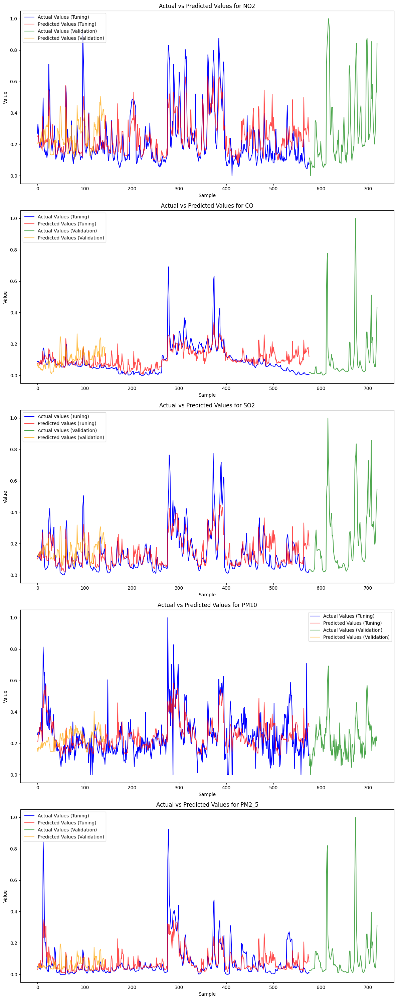

In [ ]:
#Plot Actual vs Pred
num_targets = len(targets)

# Create subplots
fig, axes = plt.subplots(num_targets, 1, figsize=(12, 6 * num_targets))

for i, target in enumerate(targets):
    # Actual vs. Predicted on Tuning Set
    axes[i].plot(y_tuning[target], label='Actual Values (Tuning)', color='blue')
    axes[i].plot(y_tuning_pred[:, i], label='Predicted Values (Tuning)', color='red', alpha=0.7)

    # Actual vs. Predicted on Validation Set
    axes[i].plot(y_val[target], label='Actual Values (Validation)', color='green', alpha=0.7)
    axes[i].plot(y_val_pred[:, i], label='Predicted Values (Validation)', color='orange', alpha=0.7)

    axes[i].set_title(f'Actual vs Predicted Values for {target}')
    axes[i].set_xlabel('Sample')
    axes[i].set_ylabel('Value')
    axes[i].legend()

plt.tight_layout()
plt.show()


Same observation from the base model and the tuned model is seen in the validation phase. This implies that while past values have some predictive potential, they are not sufficient on their own to improve predictability.

**SUPPORT VECTOR REGRESSION(SVR):**  With non-linear kernels SVRs can model complex relationships without the assumption of normality in residuals.

In [ ]:
svX_selected = X[selected_features]

# scale the features
scaler = MinMaxScaler()
svX_selected_scaled = scaler.fit_transform(svX_selected)
svy_scaled = scaler.fit_transform(y)

# Convert y_scaled back to DataFrame if needed
y_scaled_df = pd.DataFrame(svy_scaled, columns=y.columns)

# Now perform the split
split_point = int(len(svX_selected) * 0.8)
X_tuning, X_val = svX_selected_scaled[:split_point], svX_selected_scaled[split_point:]
y_tuning, y_val = y_scaled_df[:split_point], y_scaled_df[split_point:]

# Further time-based split of tuning set for hyperparameter tuning
split_point_tuning = int(len(X_tuning) * 0.75)
X_train, X_test = X_tuning[:split_point_tuning], X_tuning[split_point_tuning:]
y_train, y_test = y_tuning[:split_point_tuning], y_tuning[split_point_tuning:]

In [ ]:
# Initialize SVR model
svr = SVR()

# Wrap SVR in MultiOutputRegressor for multi-output regression
multioutput_svr = MultiOutputRegressor(svr)

# Fit the model
multioutput_svr.fit(X_train, y_train)

# Predict on the training and test sets
y_train_pred = multioutput_svr.predict(X_train)
y_test_pred = multioutput_svr.predict(X_test)

# Calculate R2, MSE, and MedAE scores for each target on training and test sets
for i, target in enumerate(targets):
    r2_train = r2_score(y_train.iloc[:, i], y_train_pred[:, i])
    mse_train = mean_squared_error(y_train.iloc[:, i], y_train_pred[:, i])
    medae_train = median_absolute_error(y_train.iloc[:, i], y_train_pred[:, i])
    r2_test = r2_score(y_test.iloc[:, i], y_test_pred[:, i])
    mse_test = mean_squared_error(y_test.iloc[:, i], y_test_pred[:, i])
    medae_test = median_absolute_error(y_test.iloc[:, i], y_test_pred[:, i])

    print(f"Target: {target}")
    print(f"  Train R2: {r2_train:.3f}, Train MSE: {mse_train:.3f}, Train MedAE: {medae_train:.3f}")
    print(f"  Test R2: {r2_test:.3f}, Test MSE: {mse_test:.3f}, Test MedAE: {medae_test:.3f}\n")


Target: NO2
  Train R2: 0.797, Train MSE: 0.007, Train MedAE: 0.059
  Test R2: -0.744, Test MSE: 0.010, Test MedAE: 0.052

Target: CO
  Train R2: 0.649, Train MSE: 0.003, Train MedAE: 0.040
  Test R2: -14.539, Test MSE: 0.014, Test MedAE: 0.102

Target: SO2
  Train R2: 0.768, Train MSE: 0.005, Train MedAE: 0.050
  Test R2: -1.830, Test MSE: 0.015, Test MedAE: 0.070

Target: PM10
  Train R2: 0.697, Train MSE: 0.006, Train MedAE: 0.052
  Test R2: -0.958, Test MSE: 0.025, Test MedAE: 0.128

Target: PM2_5
  Train R2: 0.701, Train MSE: 0.005, Train MedAE: 0.054
  Test R2: -0.691, Test MSE: 0.007, Test MedAE: 0.081



HYPERPARAMETER TUNING

In [ ]:
# Initialize SVR
svr = SVR()

# Wrap SVR in MultiOutputRegressor
multioutput_svr = MultiOutputRegressor(svr)

# Define the parameter grid, prefixing with 'estimator__'
param_grid = {
    'estimator__C': [0.1, 1, 10, 100],  # Regularization parameter
    'estimator__gamma': ['scale', 'auto'],  # Kernel coefficient
    'estimator__kernel': ['rbf', 'poly']  # Non-linear Kernel type
}

# TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Grid search
svgrid_search = GridSearchCV(multioutput_svr, param_grid, cv=tscv, scoring='neg_median_absolute_error', n_jobs=-1)

# Fit GridSearchCV
svgrid_search.fit(X_train, y_train)

# Best parameters
best_params = svgrid_search.best_params_
print(f"Best parameters: {best_params}")

# Best model
best_svr = svgrid_search.best_estimator_

Best parameters: {'estimator__C': 1, 'estimator__gamma': 'auto', 'estimator__kernel': 'rbf'}


MODEL EVALUATION

In [ ]:

def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    # Ensure predictions are in the same format as test_labels
    if len(predictions.shape) == 1:
        predictions = predictions.reshape(-1, 1)

    mse_scores = [mean_squared_error(test_labels.iloc[:, i], predictions[:, i]) for i in range(test_labels.shape[1])]
    medae_scores = [median_absolute_error(test_labels.iloc[:, i], predictions[:, i]) for i in range(test_labels.shape[1])]
    r2_scores = [r2_score(test_labels.iloc[:, i], predictions[:, i]) for i in range(test_labels.shape[1])]

    print('Model Performance')
    for i, target in enumerate(test_labels.columns):
        print(f"Target: {target}")
        print(f"  MSE: {mse_scores[i]:.4f}")
        print(f"  MedAE: {medae_scores[i]:.4f}")
        print(f"  R2: {r2_scores[i]:.4f}\n")

    return mse_scores, medae_scores, r2_scores

# Evaluate the base SVR model
base_svr = SVR()
multioutput_base_svr = MultiOutputRegressor(base_svr)
multioutput_base_svr.fit(X_train, y_train)
print("Base SVR Model Evaluation:")
base_svr_mse, base_svr_medae, base_svr_r2 = evaluate(multioutput_base_svr, X_test, y_test)

# Evaluate the best model from GridSearch
print("\nBest GridSearch SVR Model Evaluation:")
best_grid_mse, best_grid_medae, best_grid_r2 = evaluate(best_svr, X_test, y_test)


Base SVR Model Evaluation:
Model Performance
Target: NO2
  MSE: 0.0099
  MedAE: 0.0522
  R2: -0.7445

Target: CO
  MSE: 0.0141
  MedAE: 0.1016
  R2: -14.5392

Target: SO2
  MSE: 0.0146
  MedAE: 0.0697
  R2: -1.8295

Target: PM10
  MSE: 0.0252
  MedAE: 0.1283
  R2: -0.9576

Target: PM2_5
  MSE: 0.0073
  MedAE: 0.0807
  R2: -0.6913


Best GridSearch SVR Model Evaluation:
Model Performance
Target: NO2
  MSE: 0.0086
  MedAE: 0.0730
  R2: -0.5165

Target: CO
  MSE: 0.0214
  MedAE: 0.1211
  R2: -22.6096

Target: SO2
  MSE: 0.0115
  MedAE: 0.0842
  R2: -1.2220

Target: PM10
  MSE: 0.0179
  MedAE: 0.0939
  R2: -0.3911

Target: PM2_5
  MSE: 0.0132
  MedAE: 0.1195
  R2: -2.0484



FINAL MODEL VALIDATION

In [ ]:
# Predict on tuning and validation sets
y_tuning_pred = best_svr.predict(X_tuning)
y_val_pred = best_svr.predict(X_val)

# Calculate MSE and R2 for each target on tuning and validation sets
for i, target in enumerate(targets):
    mse_tuning = mean_squared_error(y_tuning[target], y_tuning_pred[:, i])
    medae_tuning = median_absolute_error(y_tuning[target], y_tuning_pred[:, i])
    r2_tuning = r2_score(y_tuning[target], y_tuning_pred[:, i])
    mse_val = mean_squared_error(y_val[target], y_val_pred[:, i])
    medae_val = median_absolute_error(y_val[target], y_val_pred[:, i])
    r2_val = r2_score(y_val[target], y_val_pred[:, i])
    print(f"{target}")
    print(f"  Train R2: {r2_tuning:.3f}, Train MSE: {mse_tuning:.3f}, Train MedAE: {medae_tuning:.3f}")
    print(f"  Test R2: {r2_val:.3f}, Test MSE: {mse_val:.3f}, Test MedAE: {medae_val:.3f}\n")

NO2
  Train R2: 0.415, Train MSE: 0.016, Train MedAE: 0.076
  Test R2: 0.330, Test MSE: 0.039, Test MedAE: 0.103

CO
  Train R2: -0.172, Train MSE: 0.009, Train MedAE: 0.066
  Test R2: -0.976, Test MSE: 0.053, Test MedAE: 0.224

SO2
  Train R2: 0.260, Train MSE: 0.012, Train MedAE: 0.073
  Test R2: 0.136, Test MSE: 0.040, Test MedAE: 0.132

PM10
  Train R2: 0.237, Train MSE: 0.014, Train MedAE: 0.066
  Test R2: -0.772, Test MSE: 0.025, Test MedAE: 0.132

PM2_5
  Train R2: 0.114, Train MSE: 0.011, Train MedAE: 0.066
  Test R2: -0.228, Test MSE: 0.032, Test MedAE: 0.136



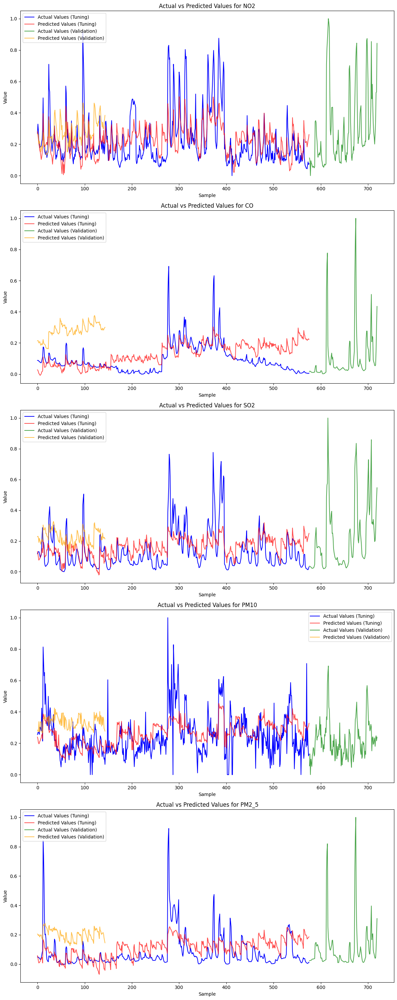

In [ ]:
#Plot Actual vs Pred
num_targets = len(targets)

# Create subplots
fig, axes = plt.subplots(num_targets, 1, figsize=(12, 6 * num_targets))

for i, target in enumerate(targets):
    # Actual vs. Predicted on Tuning Set
    axes[i].plot(y_tuning[target], label='Actual Values (Tuning)', color='blue')
    axes[i].plot(y_tuning_pred[:, i], label='Predicted Values (Tuning)', color='red', alpha=0.7)

    # Actual vs. Predicted on Validation Set
    axes[i].plot(y_val[target], label='Actual Values (Validation)', color='green', alpha=0.7)
    axes[i].plot(y_val_pred[:, i], label='Predicted Values (Validation)', color='orange', alpha=0.7)

    axes[i].set_title(f'Actual vs Predicted Values for {target}')
    axes[i].set_xlabel('Sample')
    axes[i].set_ylabel('Value')
    axes[i].legend()

plt.tight_layout()
plt.show()


The base SVR model has high MSE and MedAE, indicating that the predictions are far from actual values also the negative R² scores suggest underfitting where the model is not capturing the underlying patterns in the data. The tuned SVR model improved MSE and MedAE, but R² scores, although improved, still indicate limited predictive power. The SVR models struggle to predict air pollution levels. Potential overfitting and complexity of the problem suggest the need for more sophisticated modeling approaches or relevant features.

**MULTIVARIATE LSTM (Long Short-Term Memory):** This Recurrent Neural Network can capture complex relationships in multivariate time series data. Suitable for time series data as they can capture temporal dependencies, patterns and complex relationships in multivariate time series data. Also since our data appears to be stationary, it is well-suited for modeling with LSTM networks.

Feature Engineering to improve LSTM:

---

Creating lag features for this dataset: This can help capture temporal dependencies in your data. It involves shifting the relevant columns to introduce a time delay, effectively creating past values as new features.

In [ ]:
number_of_lags = 1  # This creates lags for 1 hour as we observed during the Granger's casualty test that most effects occured at the first lag

# Create lagged features
for lag in range(1, number_of_lags + 1):
    svX_selected[[f'{col}_lag_{lag}' for col in svX_selected.columns]] = svX_selected.shift(lag)

# Drop rows with NaN values that were created due to shifting
svX_selected.dropna(inplace=True)

In [ ]:
svX_selected.columns.to_list()

['NOx_Petrol_Cars',
 'NOx_Diesel_Buses',
 'NOx_Petrol_LGVs',
 'NOx_Diesel_HGVs',
 'SO2_Diesel_Cars',
 'SO2_Diesel_Buses',
 'SO2_Diesel_HGVs',
 'CO_Petrol_Cars',
 'CO_Diesel_Buses',
 'CO_Petrol_Motorcycles',
 'PM10_Diesel_Cars',
 'PM10_Diesel_Buses',
 'PM2_5_Diesel_Buses',
 'PM2_5_Diesel_HGVs',
 'temperature',
 'pressure',
 'humidity',
 'wind_speed',
 'wind_dir',
 'year',
 'month',
 'day',
 'hour',
 'NOx_Petrol_Cars_lag_1',
 'NOx_Diesel_Buses_lag_1',
 'NOx_Petrol_LGVs_lag_1',
 'NOx_Diesel_HGVs_lag_1',
 'SO2_Diesel_Cars_lag_1',
 'SO2_Diesel_Buses_lag_1',
 'SO2_Diesel_HGVs_lag_1',
 'CO_Petrol_Cars_lag_1',
 'CO_Diesel_Buses_lag_1',
 'CO_Petrol_Motorcycles_lag_1',
 'PM10_Diesel_Cars_lag_1',
 'PM10_Diesel_Buses_lag_1',
 'PM2_5_Diesel_Buses_lag_1',
 'PM2_5_Diesel_HGVs_lag_1',
 'temperature_lag_1',
 'pressure_lag_1',
 'humidity_lag_1',
 'wind_speed_lag_1',
 'wind_dir_lag_1',
 'year_lag_1',
 'month_lag_1',
 'day_lag_1',
 'hour_lag_1']

Data Preprocessing & Training

In [ ]:

# Scale the features and target variables
scaler_X = StandardScaler()
l_X_selected_scaled = scaler_X.fit_transform(svX_selected)

scaler_y = MinMaxScaler()
l_y_scaled = scaler_y.fit_transform(y)

# Convert y_scaled back to DataFrame if needed
l_y_scaled_df = pd.DataFrame(l_y_scaled, columns=y.columns)

# Time-based split for tuning and validation sets
split_point = int(len(svX_selected_scaled) * 0.8)
X_tuning, X_val = l_X_selected_scaled[:split_point], l_X_selected_scaled[split_point:]
y_tuning, y_val = l_y_scaled_df[:split_point], l_y_scaled_df[split_point:]

# Further time-based split of tuning set for training and testing
split_point_tuning = int(len(X_tuning) * 0.75)
X_train, X_test = X_tuning[:split_point_tuning], X_tuning[split_point_tuning:]
y_train, y_test = y_tuning[:split_point_tuning], y_tuning[split_point_tuning:]

# Reshape input to be [samples, time steps, features] for LSTM
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))



In [ ]:
# Number of features
n_features = X_train.shape[2]

# Create the LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1, n_features)))
model.add(Dropout(0.2))
model.add(LSTM(units=50))
model.add(Dropout(0.2))
model.add(Dense(units=y_train.shape[1]))  # Output layer for multivariate targets

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
14/14 [==============================] - 6s 75ms/step - loss: 0.0440 - val_loss: 0.0213
Epoch 2/20
14/14 [==============================] - 0s 6ms/step - loss: 0.0290 - val_loss: 0.0164
Epoch 3/20
14/14 [==============================] - 0s 7ms/step - loss: 0.0201 - val_loss: 0.0127
Epoch 4/20
14/14 [==============================] - 0s 7ms/step - loss: 0.0158 - val_loss: 0.0118
Epoch 5/20
14/14 [==============================] - 0s 7ms/step - loss: 0.0142 - val_loss: 0.0102
Epoch 6/20
14/14 [==============================] - 0s 6ms/step - loss: 0.0123 - val_loss: 0.0092
Epoch 7/20
14/14 [==============================] - 0s 6ms/step - loss: 0.0116 - val_loss: 0.0092
Epoch 8/20
14/14 [==============================] - 0s 6ms/step - loss: 0.0107 - val_loss: 0.0099
Epoch 9/20
14/14 [==============================] - 0s 7ms/step - loss: 0.0097 - val_loss: 0.0092
Epoch 10/20
14/14 [==============================] - 0s 8ms/step - loss: 0.0093 - val_loss: 0.0101
Epoch 11/20
14/14 

MODEL EVALUATION

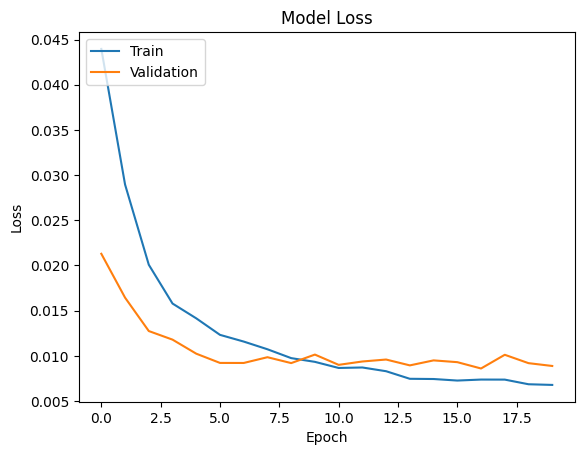

In [ ]:
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Ideally, both the training and validation loss should decrease over epochs, indicating that the model is learning and improving. This is what is been obeserved from the LSTM model, however the validation loss is (indicated by the orange line is not stable) seen to converge at epoch 10 and then increase towards the end. Although the gap between the training loss and validation loss is not so much it still indicates the presence of overfittng in the model

In the next line of code we would perform hyperparameter tuning to improve our model's performance



HYPERPARAMETER TUNING: We would take an iterative approach to hyperparameter tuning This method involves manually adjusting hyperparameters, training the model, and evaluating its performance on a tuning set.

In [ ]:
#Create a function to build LSTM model. This function allows for easy hyperparamter modification.

def create_lstm_model(neurons=50, dropout_rate=0.2, optimizer='adam'):
    model = Sequential()
    model.add(LSTM(units=neurons, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(dropout_rate))
    model.add(Dense(y_train.shape[1]))  # Adjust for the number of output variables
    model.compile(optimizer=optimizer, loss='mse')
    return model


In [ ]:
X_tuning = X_tuning.reshape((X_tuning.shape[0], 1, X_tuning.shape[1]))
X_val = X_val.reshape((X_val.shape[0], 1, X_val.shape[1]))



In [ ]:
neurons = 50
dropout_rate = 0.2
optimizer = 'adam'
batch_size = 16 #From the base LSTM Evaluation plot we would try batch_Size [16, 32]
epochs = 8 #From the base LSTM Evaluation plot we would try epoch [8, 10]

# Create and train the model with Tuning Parameters
model = create_lstm_model(neurons, dropout_rate, optimizer)
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1, validation_data=(X_tuning, y_tuning))





Epoch 1/8
27/27 [==============================] - 2s 26ms/step - loss: 0.0460 - val_loss: 0.0240
Epoch 2/8
27/27 [==============================] - 0s 6ms/step - loss: 0.0239 - val_loss: 0.0166
Epoch 3/8
27/27 [==============================] - 0s 5ms/step - loss: 0.0186 - val_loss: 0.0136
Epoch 4/8
27/27 [==============================] - 0s 6ms/step - loss: 0.0165 - val_loss: 0.0118
Epoch 5/8
27/27 [==============================] - 0s 5ms/step - loss: 0.0144 - val_loss: 0.0106
Epoch 6/8
27/27 [==============================] - 0s 5ms/step - loss: 0.0136 - val_loss: 0.0099
Epoch 7/8
27/27 [==============================] - 0s 5ms/step - loss: 0.0123 - val_loss: 0.0093
Epoch 8/8
27/27 [==============================] - 0s 5ms/step - loss: 0.0112 - val_loss: 0.0088


In [ ]:
# Evaluate on the tuning set to assess the model's performance with the current hyperparameters.
tuning_loss = model.evaluate(X_tuning, y_tuning)
print(f"Tuning set MSE: {tuning_loss}")

18/18 [==============================] - 1s 2ms/step - loss: 0.0088
Tuning set MSE: 0.008805794641375542


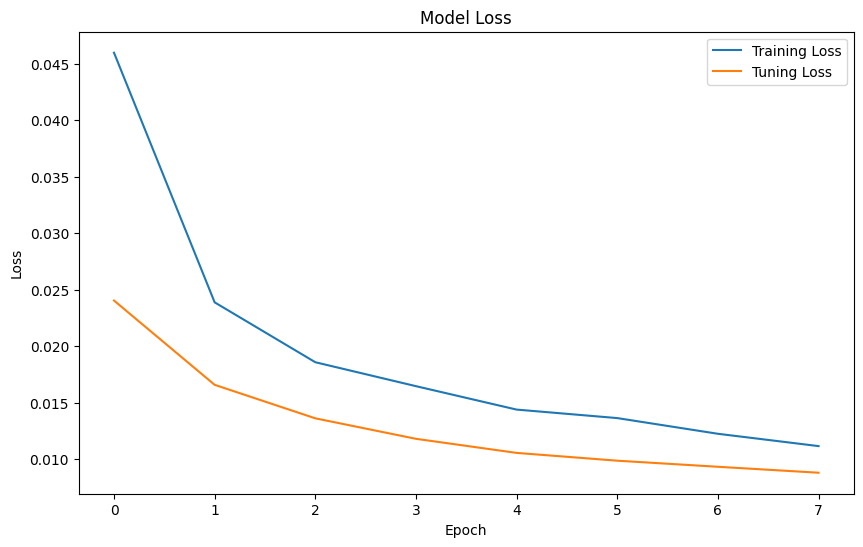

In [ ]:
#Plot the training loss and the tuning loss to visualize the model's learning process
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Tuning Loss')  # Ensure 'val_loss' is recorded
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()


After tuning with epoch[8, 10] and batch_size[16, 32] we finally found the best parameters on (neurons = 50
dropout_rate = 0.2
optimizer = 'adam'
batch_size = 16
epochs = 8
) which had the lowest loss of 0.008. When we compare the training loss to the tunning loss from the above visualization we can see that we model's loss on tuning is lower, meaning that it's generalizing well. In the next line of code we would evaluate the model on the test set (X_test, y_test) to get an unbiased estimate of its performance on unseen data.

FINAL EVALUATION AND PREDICTIONS

In [ ]:
# Final evaluation on the test set
test_loss = model.evaluate(X_test, y_test, verbose=0)
print(f"Test set MSE: {test_loss}")

Test set MSE: 0.012364059686660767


The fact that tuning loss and test loss are close (0.008 vs. 0.01) is a good sign. It suggests that the model is generalizing well and not overfitting significantly to the tuning data.

In [ ]:
#Make Predictions on Validation Set
y_pred_val = model.predict(X_val)


5/5 [==============================] - 1s 4ms/step


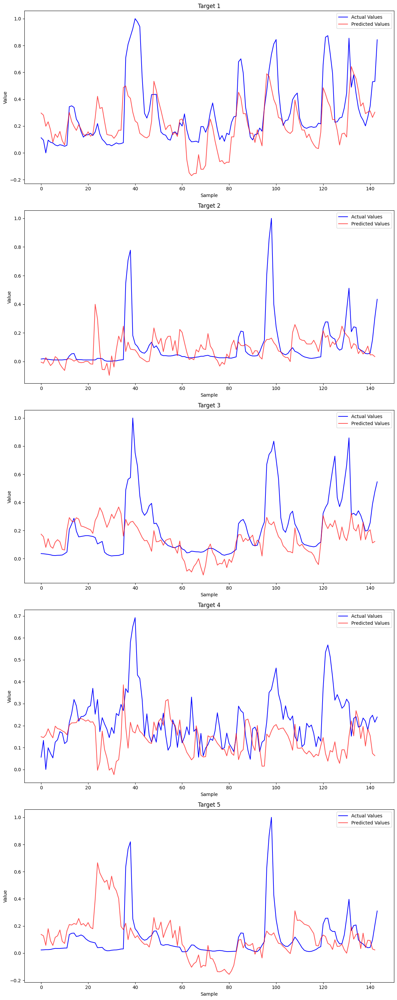

In [ ]:
y_val_np = y_val.to_numpy() #convert to numpy array

num_targets = y_val_np.shape[1]
fig, axes = plt.subplots(num_targets, 1, figsize=(12, 6 * num_targets))

for i in range(num_targets):
    axes[i].plot(y_val_np[:, i], label='Actual Values', color='blue')
    axes[i].plot(y_pred_val[:, i], label='Predicted Values', color='red', alpha=0.7)
    axes[i].set_title(f'Target {i+1}')
    axes[i].set_xlabel('Sample')
    axes[i].set_ylabel('Value')
    axes[i].legend()

plt.tight_layout()
plt.show()



### **RESULTS AND CONCLUSION**

**BASELINE MODELS:**

* **Decision Tree Regressor:** Displayed moderate performance but was outperformed by LSTM. Its interpretability and simplicity are positive aspects, but it is not sophisticated enough for complicated time-series data.time-series data.
* **Ridge Regression:** The non-linear structure of the data, multicollinearity, and outliers probably contributed to its poor performance as a linear model.


**RANDOM FOREST AND SVM MODELS:**

*   **Performance**: The RF and SVM models, after tuning, performed worse than its baseline. The predicted values were significantly distant from the actual values, indicating poor model performance.
* **Conclusion**:SVM models and RF are not well-suited for the complexity and characteristics of the given dataset. SVM's performance suggests it might not handle multicollinearity and non-normal residuals well. RF's performance was suboptimal, which could be due to the model's inability to capture temporal dependencies or presence of outliers.


**MULTIVARIATE LSTM:**
* **Performance**: The LSTM model demonstrated promising performance with an MSE tuning loss of 0.008 and a test loss of 0.01. Its predictions closely matched the observed values, suggesting strong model performance in capturing the temporal dependencies in the data, thanks to the lag features included in the timeseries data
* **Limitation**: Given the nature of data with peak traffic hours, it was not robust to outliers, which could be important.
* **Conclusion**: The LSTM model is well-suited for capturing complex temporal patterns in data, making it a viable choice for time-series prediction. However, its sensitivity to outliers suggests the need for outlier-robust techniques or further improvement.

**ANSWERING RESEARCH QUESTIONS:**
In this study, we aimed to investigate:

1. The correlation between different vehicular fuel types and the levels of key pollutants in urban air quality
2. How weather conditions modify the impact of emissions from various fuel types on urban air quality and
3. If machine learning models can accurately predict air pollution levels based on the distribution of vehicle fuel types and meteorological data

From the investigation the following conclusions were inferred:

1. **Correlation between Fuel Types and Pollutants:** The results on the Exploratory data analysis, from the distribution plots, correlation plots, to the multiple regression analysis and Granger's Causality Test  demonstrates a significant correlation between specific vehicular fuel types and key urban air pollutants. Notably, there is a clear and persistent correlation between higher concentrations of CO, SO2, and NO2 pollutant levels and emissions from diesel vehicles as indicated by the p-values. This correlation underscores diesel fuel's substantial contribution to urban air pollution. Nevertheless, the correlation with particulate matter (PM2.5 and PM10) is not as strong, indicating that their concentration may be influenced by other sources or variables.

2. **Impact of Weather on Emissions and Air Quality:** Weather conditions, particularly rain, wind speed and temperature, consistently modify the impact of emissions on air quality. The correlation plots and regression analysis coefficients reveal that higher wind speeds generally correlate with lower concentrations of pollutants, indicating dispersion effects, while temperature variations impact the chemical processes affecting pollutants like NO2 and CO(ie the effects of temperature on the pollutants are dependent on the vehicle fuel type). The Granger causality results for weather variables showed that in some cases, these variables had predictive power for certain pollutants at various lags. For instance, wind speed/direction and rain volume showed some significant p-values at lower lags for specific pollutants, indicating a potential causal relationship. This demonstrates how weather patterns can either lessen or increase the effects of vehicle emissions, highlighting the dynamic nature of air quality.These elements are essential to the concentration and dispersion of pollutants.


3. **Predicting Air Pollutant Levels with Vehicle Fuel Emissions & Weather Data:**The findings of the LSTM model suggest that it is possible to use machine learning to forecast air pollutant levels using information on vehicle fuel emissions and weather conditions. Nevertheless, the model has its drawbacks, including difficulties in dealing with outliers and the lower performance of alternative models. Consequently, to improve the accuracy and robustness of predictions, more advanced techniques like hybrid models or outlier-robust methods may be required.

In conclusion, although Granger causality tests generally suggest a weaker predictive relationship between vehicle fuel-type emissions and pollutants, as well as between certain weather conditions and pollutants, there are some notable exceptions eapecially with diesel vehicles. Despite the limitations of temporal granularity, extrapolated periods and assumptions from feature engineering. These findings indicate that while there is a relationship between vehicle fuel types, weather conditions, and urban air quality, the complexity of these relationships varies and is influenced by multiple factors that are not included in our study.